In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.subplots as sp
import plotly.graph_objs as go
from pandas.tseries.offsets import MonthEnd
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import mean_squared_error
import xgboost as xgb
from sklearn.model_selection import train_test_split
from xgboost import XGBRegressor
from sklearn.ensemble import RandomForestRegressor
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.ensemble import VotingRegressor
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor

In [3]:
df = pd.read_csv('merged_data.csv') #import the data

In [4]:
df.drop('date', inplace = True, axis = 1 ) #Drop this date because its duplicated

In [5]:
# Seperating the into 14 different DataFrames for each GCK naming each df_gck1, df_gck2, df_gck3, etc.
for i in range(1, 37):
    globals()[f'df_gck{i}'] = df[df['Mapped_GCK'] == i]

# Display the first few rows of the df_gck1 DataFrame
df_gck1

,Date,Mapped_GCK,Sales_EUR,Sales_EUR_Lag_1,Sales_EUR_Lag_2,Sales_EUR_Lag_3,Sales_EUR_Lag_4,Sales_EUR_Lag_5,Sales_EUR_Lag_6,Sales_EUR_Lag_7,...,production index: France: Electrical equipment_lag_3,production index: France: Electrical equipment_lag_4,production index: France: Electrical equipment_lag_5,production index: France: Electrical equipment_lag_6,production index: Germany: Electrical equipment_lag_1,production index: Germany: Electrical equipment_lag_2,production index: Germany: Electrical equipment_lag_3,production index: Germany: Electrical equipment_lag_4,production index: Germany: Electrical equipment_lag_5,production index: Germany: Electrical equipment_lag_6
0,2018-10-01,1,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,...,86.400002,95.119263,81.820183,83.933945,110.872368,111.284912,111.181778,116.751183,106.746880,108.706490
14,2018-11-01,1,5140760.00,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,...,64.293579,86.400002,95.119263,81.820183,118.298233,110.872368,111.284912,111.181778,116.751183,106.746880
28,2018-12-01,1,37889612.12,5140760.00,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,...,85.078896,64.293579,86.400002,95.119263,117.163727,118.298233,110.872368,111.284912,111.181778,116.751183
42,2019-01-01,1,27728148.35,37889612.12,5140760.00,36098918.79,36098918.79,36098918.79,36098918.79,36098918.79,...,97.849541,85.078896,64.293579,86.400002,89.626122,117.163727,118.298233,110.872368,111.284912,111.181778
56,2019-02-01,1,34793163.53,27728148.35,37889612.12,5140760.00,36098918.79,36098918.79,36098918.79,36098918.79,...,91.155960,97.849541,85.078896,64.293579,105.406097,89.626122,117.163727,118.298233,110.872368,111.284912
70,2019-03-01,1,33856803.04,34793163.53,27728148.35,37889612.12,5140760.00,36098918.79,36098918.79,36098918.79,...,78.033028,91.155960,97.849541,85.078896,103.652771,105.406097,89.626122,117.163727,118.298233,110.872368
84,2019-04-01,1,39688292.01,33856803.04,34793163.53,27728148.35,37889612.12,5140760.00,36098918.79,36098918.79,...,81.908257,78.033028,91.155960,97.849541,111.388054,103.652771,105.406097,89.626122,117.163727,118.298233
98,2019-05-01,1,38897974.29,39688292.01,33856803.04,34793163.53,27728148.35,37889612.12,5140760.00,36098918.79,...,80.322929,81.908257,78.033028,91.155960,102.518265,111.388054,103.652771,105.406097,89.626122,117.163727
112,2019-06-01,1,39106750.23,38897974.29,39688292.01,33856803.04,34793163.53,27728148.35,37889612.12,5140760.00,...,92.477066,80.322929,81.908257,78.033028,107.468842,102.518265,111.388054,103.652771,105.406097,89.626122
126,2019-07-01,1,37912572.30,39106750.23,38897974.29,39688292.01,33856803.04,34793163.53,27728148.35,37889612.12,...,85.519257,92.477066,80.322929,81.908257,95.814354,107.468842,102.518265,111.388054,103.652771,105.406097


# GCK 1

In [6]:
#Set Date to datetime
df_gck1['Date'] = pd.to_datetime(df_gck1['Date']) #Convert the date to datetime
df_gck1.set_index('Date', inplace = True) #Set it as index

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\875933263.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck1['Date'] = pd.to_datetime(df_gck1['Date']) #Convert the date to datetime


In [7]:
#This list is used to check for each market feature and its lag
market_features = [
    'China:Production Index Machinery & Electricals', 'France:Production Index Machinery & Electricals',
    'France:Shipments Index Machinery & Electricals', 'Germany:Production Index Machinery & Electricals',
    'Germany:Shipments Index Machinery & Electricals', 'Italy:Production Index Machinery & Electricals',
    'Italy:Shipments Index Machinery & Electricals', 'Japan:Production Index Machinery & Electricals',
    'Switzerland:Production Index Machinery & Electricals', 'UK:Production Index Machinery & Electricals',
    'UK:Shipments Index Machinery & Electricals', 'US:Production Index Machinery & Electricals',
    'US:Shipments Index Machinery & Electricals', 'Europe:Production Index Machinery & Electricals',
    'Europe:Shipments Index Machinery & Electricals', 'World: Price of Energy', 'World: Price of Metals & Minerals',
    'World: Price of Natural gas index', 'United States: EUR in LCU',
    'Producer Prices: France: Electrical equipment', 'Producer Prices: Germany: Electrical equipment',
    'Producer Prices: China: Electrical equipment', 'production index: World: Machinery and equipment n.e.c.',
    'production index: Switzerland: Machinery and equipment n.e.c.',
    'production index: United States: Electrical equipment', 'production index: World: Electrical equipment',
    'production index: Switzerland: Electrical equipment', 'production index: United Kingdom: Electrical equipment',
    'production index: Italy: Electrical equipment', 'production index: Japan: Electrical equipment',
    'production index: France: Electrical equipment', 'production index: Germany: Electrical equipment',
    'China:Production Index Machinery & Electricals_lag_1', 'China:Production Index Machinery & Electricals_lag_2',
    'China:Production Index Machinery & Electricals_lag_3', 'China:Production Index Machinery & Electricals_lag_4',
    'China:Production Index Machinery & Electricals_lag_5', 'China:Production Index Machinery & Electricals_lag_6',
    'France:Production Index Machinery & Electricals_lag_1', 'France:Production Index Machinery & Electricals_lag_2',
    'France:Production Index Machinery & Electricals_lag_3', 'France:Production Index Machinery & Electricals_lag_4',
    'France:Production Index Machinery & Electricals_lag_5', 'France:Production Index Machinery & Electricals_lag_6',
    'France:Shipments Index Machinery & Electricals_lag_1', 'France:Shipments Index Machinery & Electricals_lag_2',
    'France:Shipments Index Machinery & Electricals_lag_3', 'France:Shipments Index Machinery & Electricals_lag_4',
    'France:Shipments Index Machinery & Electricals_lag_5', 'France:Shipments Index Machinery & Electricals_lag_6',
    'Germany:Production Index Machinery & Electricals_lag_1', 'Germany:Production Index Machinery & Electricals_lag_2',
    'Germany:Production Index Machinery & Electricals_lag_3', 'Germany:Production Index Machinery & Electricals_lag_4',
    'Germany:Production Index Machinery & Electricals_lag_5', 'Germany:Production Index Machinery & Electricals_lag_6',
    'Germany:Shipments Index Machinery & Electricals_lag_1', 'Germany:Shipments Index Machinery & Electricals_lag_2',
    'Germany:Shipments Index Machinery & Electricals_lag_3', 'Germany:Shipments Index Machinery & Electricals_lag_4',
    'Germany:Shipments Index Machinery & Electricals_lag_5', 'Germany:Shipments Index Machinery & Electricals_lag_6',
    'Italy:Production Index Machinery & Electricals_lag_1', 'Italy:Production Index Machinery & Electricals_lag_2',
    'Italy:Production Index Machinery & Electricals_lag_3', 'Italy:Production Index Machinery & Electricals_lag_4',
    'Italy:Production Index Machinery & Electricals_lag_5', 'Italy:Production Index Machinery & Electricals_lag_6',
    'Italy:Shipments Index Machinery & Electricals_lag_1', 'Italy:Shipments Index Machinery & Electricals_lag_2',
    'Italy:Shipments Index Machinery & Electricals_lag_3', 'Italy:Shipments Index Machinery & Electricals_lag_4',
    'Italy:Shipments Index Machinery & Electricals_lag_5', 'Italy:Shipments Index Machinery & Electricals_lag_6',
    'Japan:Production Index Machinery & Electricals_lag_1', 'Japan:Production Index Machinery & Electricals_lag_2',
    'Japan:Production Index Machinery & Electricals_lag_3', 'Japan:Production Index Machinery & Electricals_lag_4',
    'Japan:Production Index Machinery & Electricals_lag_5', 'Japan:Production Index Machinery & Electricals_lag_6',
    'Switzerland:Production Index Machinery & Electricals_lag_1',
    'Switzerland:Production Index Machinery & Electricals_lag_2',
    'Switzerland:Production Index Machinery & Electricals_lag_3',
    'Switzerland:Production Index Machinery & Electricals_lag_4',
    'Switzerland:Production Index Machinery & Electricals_lag_5',
    'Switzerland:Production Index Machinery & Electricals_lag_6', 'UK:Production Index Machinery & Electricals_lag_1',
    'UK:Production Index Machinery & Electricals_lag_2', 'UK:Production Index Machinery & Electricals_lag_3',
    'UK:Production Index Machinery & Electricals_lag_4', 'UK:Production Index Machinery & Electricals_lag_5',
    'UK:Production Index Machinery & Electricals_lag_6', 'UK:Shipments Index Machinery & Electricals_lag_1',
    'UK:Shipments Index Machinery & Electricals_lag_2', 'UK:Shipments Index Machinery & Electricals_lag_3',
    'UK:Shipments Index Machinery & Electricals_lag_4', 'UK:Shipments Index Machinery & Electricals_lag_5',
    'UK:Shipments Index Machinery & Electricals_lag_6', 'US:Production Index Machinery & Electricals_lag_1',
    'US:Production Index Machinery & Electricals_lag_2', 'US:Production Index Machinery & Electricals_lag_3',
    'US:Production Index Machinery & Electricals_lag_4', 'US:Production Index Machinery & Electricals_lag_5',
    'US:Production Index Machinery & Electricals_lag_6', 'US:Shipments Index Machinery & Electricals_lag_1',
    'US:Shipments Index Machinery & Electricals_lag_2', 'US:Shipments Index Machinery & Electricals_lag_3',
    'US:Shipments Index Machinery & Electricals_lag_4', 'US:Shipments Index Machinery & Electricals_lag_5',
    'US:Shipments Index Machinery & Electricals_lag_6', 'Europe:Production Index Machinery & Electricals_lag_1',
    'Europe:Production Index Machinery & Electricals_lag_2', 'Europe:Production Index Machinery & Electricals_lag_3',
    'Europe:Production Index Machinery & Electricals_lag_4', 'Europe:Production Index Machinery & Electricals_lag_5',
    'Europe:Production Index Machinery & Electricals_lag_6', 'Europe:Shipments Index Machinery & Electricals_lag_1',
    'Europe:Shipments Index Machinery & Electricals_lag_2', 'Europe:Shipments Index Machinery & Electricals_lag_3',
    'Europe:Shipments Index Machinery & Electricals_lag_4', 'Europe:Shipments Index Machinery & Electricals_lag_5',
    'Europe:Shipments Index Machinery & Electricals_lag_6', 'World: Price of Energy_lag_1',
    'World: Price of Energy_lag_2', 'World: Price of Energy_lag_3', 'World: Price of Energy_lag_4',
    'World: Price of Energy_lag_5', 'World: Price of Energy_lag_6', 'World: Price of Metals & Minerals_lag_1',
    'World: Price of Metals & Minerals_lag_2', 'World: Price of Metals & Minerals_lag_3',
    'World: Price of Metals & Minerals_lag_4', 'World: Price of Metals & Minerals_lag_5',
    'World: Price of Metals & Minerals_lag_6', 'World: Price of Natural gas index_lag_1',
    'World: Price of Natural gas index_lag_2', 'World: Price of Natural gas index_lag_3',
    'World: Price of Natural gas index_lag_4', 'World: Price of Natural gas index_lag_5',
    'World: Price of Natural gas index_lag_6', 'United States: EUR in LCU_lag_1', 'United States: EUR in LCU_lag_2',
    'United States: EUR in LCU_lag_3', 'United States: EUR in LCU_lag_4', 'United States: EUR in LCU_lag_5',
    'United States: EUR in LCU_lag_6', 'Producer Prices: France: Electrical equipment_lag_1',
    'Producer Prices: France: Electrical equipment_lag_2', 'Producer Prices: France: Electrical equipment_lag_3',
    'Producer Prices: France: Electrical equipment_lag_4', 'Producer Prices: France: Electrical equipment_lag_5',
    'Producer Prices: France: Electrical equipment_lag_6', 'Producer Prices: Germany: Electrical equipment_lag_1',
    'Producer Prices: Germany: Electrical equipment_lag_2', 'Producer Prices: Germany: Electrical equipment_lag_3',
    'Producer Prices: Germany: Electrical equipment_lag_4', 'Producer Prices: Germany: Electrical equipment_lag_5',
    'Producer Prices: Germany: Electrical equipment_lag_6', 'Producer Prices: China: Electrical equipment_lag_1',
    'Producer Prices: China: Electrical equipment_lag_2', 'Producer Prices: China: Electrical equipment_lag_3',
    'Producer Prices: China: Electrical equipment_lag_4', 'Producer Prices: China: Electrical equipment_lag_5',
    'Producer Prices: China: Electrical equipment_lag_6', 'production index: World: Machinery and equipment n.e.c._lag_1',
    'production index: World: Machinery and equipment n.e.c._lag_2',
    'production index: World: Machinery and equipment n.e.c._lag_3',
    'production index: World: Machinery and equipment n.e.c._lag_4',
    'production index: World: Machinery and equipment n.e.c._lag_5',
    'production index: World: Machinery and equipment n.e.c._lag_6',
    'production index: Switzerland: Machinery and equipment n.e.c._lag_1',
    'production index: Switzerland: Machinery and equipment n.e.c._lag_2',
    'production index: Switzerland: Machinery and equipment n.e.c._lag_3',
    'production index: Switzerland: Machinery and equipment n.e.c._lag_4',
    'production index: Switzerland: Machinery and equipment n.e.c._lag_5',
    'production index: Switzerland: Machinery and equipment n.e.c._lag_6',
    'production index: United States: Electrical equipment_lag_1',
    'production index: United States: Electrical equipment_lag_2',
    'production index: United States: Electrical equipment_lag_3',
    'production index: United States: Electrical equipment_lag_4',
    'production index: United States: Electrical equipment_lag_5',
    'production index: United States: Electrical equipment_lag_6',
    'production index: World: Electrical equipment_lag_1', 'production index: World: Electrical equipment_lag_2',
    'production index: World: Electrical equipment_lag_3', 'production index: World: Electrical equipment_lag_4',
    'production index: World: Electrical equipment_lag_5', 'production index: World: Electrical equipment_lag_6',
    'production index: Switzerland: Electrical equipment_lag_1',
    'production index: Switzerland: Electrical equipment_lag_2',
    'production index: Switzerland: Electrical equipment_lag_3',
    'production index: Switzerland: Electrical equipment_lag_4',
    'production index: Switzerland: Electrical equipment_lag_5',
    'production index: Switzerland: Electrical equipment_lag_6',
    'production index: United Kingdom: Electrical equipment_lag_1',
    'production index: United Kingdom: Electrical equipment_lag_2',
    'production index: United Kingdom: Electrical equipment_lag_3',
    'production index: United Kingdom: Electrical equipment_lag_4',
    'production index: United Kingdom: Electrical equipment_lag_5',
    'production index: United Kingdom: Electrical equipment_lag_6',
    'production index: Italy: Electrical equipment_lag_1', 'production index: Italy: Electrical equipment_lag_2',
    'production index: Italy: Electrical equipment_lag_3', 'production index: Italy: Electrical equipment_lag_4',
    'production index: Italy: Electrical equipment_lag_5', 'production index: Italy: Electrical equipment_lag_6',
    'production index: Japan: Electrical equipment_lag_1', 'production index: Japan: Electrical equipment_lag_2',
    'production index: Japan: Electrical equipment_lag_3', 'production index: Japan: Electrical equipment_lag_4',
    'production index: Japan: Electrical equipment_lag_5', 'production index: Japan: Electrical equipment_lag_6',
    'production index: France: Electrical equipment_lag_1', 'production index: France: Electrical equipment_lag_2',
    'production index: France: Electrical equipment_lag_3', 'production index: France: Electrical equipment_lag_4',
    'production index: France: Electrical equipment_lag_5', 'production index: France: Electrical equipment_lag_6',
    'production index: Germany: Electrical equipment_lag_1', 'production index: Germany: Electrical equipment_lag_2',
    'production index: Germany: Electrical equipment_lag_3', 'production index: Germany: Electrical equipment_lag_4',
    'production index: Germany: Electrical equipment_lag_5', 'production index: Germany: Electrical equipment_lag_6'
]

In [8]:
#Check the correlation of the features with the target
correlation = df_gck1.corr()['Sales_EUR'].sort_values(ascending=False)
correlation
#From this we could see that there are lags that are more correlated with sales than the current value

Sales_EUR                                                    1.000000
12 Month EMA                                                 0.706039
26 Month EMA                                                 0.654109
MACD                                                         0.591718
MACD Histogram                                               0.480244
                                                               ...   
production index: Germany: Electrical equipment_lag_4       -0.235033
production index: Switzerland: Electrical equipment_lag_1   -0.240109
production index: Germany: Electrical equipment_lag_3       -0.259756
production index: Switzerland: Electrical equipment_lag_2   -0.262445
Mapped_GCK                                                        NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [9]:
#Code generated with chatgpt
#This code is used to select which feature from each group (The original and the lags of itself) is more
#correlated with the sales 
# Compute the correlation of each feature with the target variable
correlation_with_target = {}
for feature in market_features:
    correlation_with_target[feature] = df_gck1[feature].corr(df_gck1['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []
for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)


Selected features:
['China:Production Index Machinery & Electricals_lag_4', 'France:Production Index Machinery & Electricals_lag_3', 'France:Shipments Index Machinery & Electricals_lag_4', 'Germany:Production Index Machinery & Electricals_lag_2', 'Germany:Shipments Index Machinery & Electricals_lag_2', 'Italy:Production Index Machinery & Electricals_lag_3', 'Italy:Shipments Index Machinery & Electricals_lag_3', 'Japan:Production Index Machinery & Electricals_lag_2', 'Switzerland:Production Index Machinery & Electricals_lag_1', 'UK:Production Index Machinery & Electricals_lag_1', 'UK:Shipments Index Machinery & Electricals_lag_4', 'US:Production Index Machinery & Electricals_lag_1', 'US:Shipments Index Machinery & Electricals', 'Europe:Production Index Machinery & Electricals_lag_2', 'Europe:Shipments Index Machinery & Electricals_lag_4', 'World: Price of Energy', 'World: Price of Metals & Minerals_lag_2', 'World: Price of Natural gas index_lag_6', 'United States: EUR in LCU_lag_6', 'Pr

In [10]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck1 = df_gck1.drop(features_to_remove, axis=1)


In [11]:
#Create a list with the pairs features that are highly correlated (0.95) in df_gck1
correlated_features = set()
correlation_matrix = df_gck1.corr()
# Iterate through the correlation matrix and compare correlations
for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features


{'26 Month EMA',
 'production index: France: Electrical equipment_lag_3',
 'production index: Italy: Electrical equipment_lag_3'}

In [12]:
to_drop = ['26 Month EMA','production index: France: Electrical equipment_lag_3',
  'production index: Italy: Electrical equipment_lag_3']
#dropping highly correlated features
df_gck1 = df_gck1.drop(to_drop, axis=1)

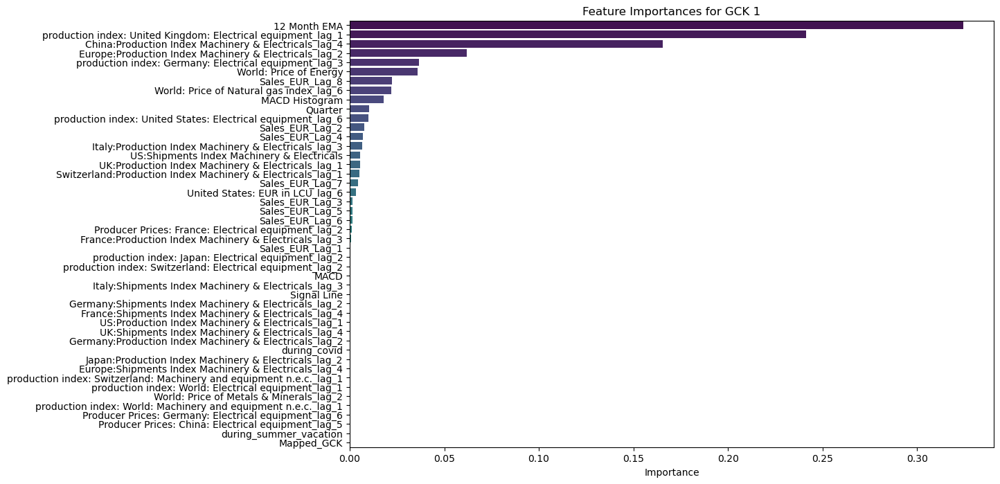

In [13]:
#Applying the XGBoost model to the GCK 1 data to see the feature importance based on RMSE
#Sepparate the features and the target
X_FI1 = df_gck1.drop('Sales_EUR', axis=1) # Features
y_FI1 = df_gck1['Sales_EUR'] #Target
#Train test split
X_train_FI1, X_test_FI1, y_train_FI1, y_test_FI1 = train_test_split(X_FI1, y_FI1, test_size=0.2, random_state=42) #Train-Test Split

#applying the model
model_FI1 = XGBRegressor(objective='reg:squarederror', random_state=42)
model_FI1.fit(X_train_FI1, y_train_FI1)

y_pred_FI1 = model_FI1.predict(X_test_FI1)

# Get the feature importances
importances_FI1 = model_FI1.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI1 = pd.DataFrame(importances_FI1, index=X_FI1.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI1 = feature_importances_FI1.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI1['Importance'], y=feature_importances_FI1.index, palette='viridis')
plt.title('Feature Importances for GCK 1')
plt.show()

In [14]:
#Get a list of the features with importance greater than 0.01, to get the ones that have at least this importance
important_features_FI1 = feature_importances_FI1[feature_importances_FI1['Importance'] > 0.01].index

important_features_FI1

Index(['12 Month EMA',
       'production index: United Kingdom: Electrical equipment_lag_1',
       'China:Production Index Machinery & Electricals_lag_4',
       'Europe:Production Index Machinery & Electricals_lag_2',
       'production index: Germany: Electrical equipment_lag_3',
       'World: Price of Energy', 'Sales_EUR_Lag_8',
       'World: Price of Natural gas index_lag_6', 'MACD Histogram', 'Quarter'],
      dtype='object')

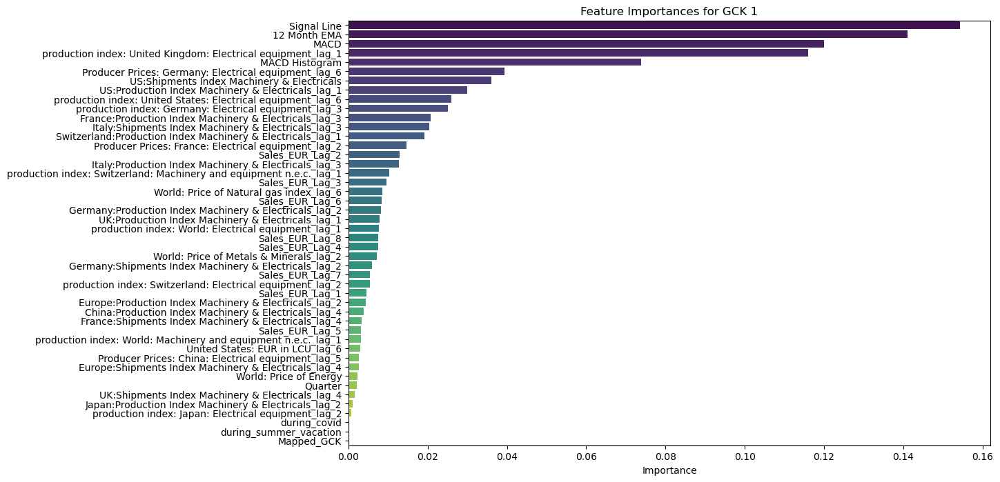

In [15]:
#Do the same with the random forest model
model_RF1 = RandomForestRegressor(random_state=10)

model_RF1.fit(X_train_FI1, y_train_FI1)

y_pred_RF1 = model_RF1.predict(X_test_FI1)
rmse_RF1 = mean_squared_error(y_test_FI1, y_pred_RF1, squared=False)

# Get the feature importances
importances_RF1 = model_RF1.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_RF1 = pd.DataFrame(importances_RF1, index=X_FI1.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_RF1 = feature_importances_RF1.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF1['Importance'], y=feature_importances_RF1.index, palette='viridis')
plt.title('Feature Importances for GCK 1')
plt.show()

In [16]:
#Get a list of the features with importance greater than 0.01
important_features_RF1 = feature_importances_RF1[feature_importances_RF1['Importance'] > 0.01].index

important_features_RF1

Index(['Signal Line', '12 Month EMA', 'MACD',
       'production index: United Kingdom: Electrical equipment_lag_1',
       'MACD Histogram',
       'Producer Prices: Germany: Electrical equipment_lag_6',
       'US:Shipments Index Machinery & Electricals',
       'US:Production Index Machinery & Electricals_lag_1',
       'production index: United States: Electrical equipment_lag_6',
       'production index: Germany: Electrical equipment_lag_3',
       'France:Production Index Machinery & Electricals_lag_3',
       'Italy:Shipments Index Machinery & Electricals_lag_3',
       'Switzerland:Production Index Machinery & Electricals_lag_1',
       'Producer Prices: France: Electrical equipment_lag_2',
       'Sales_EUR_Lag_2',
       'Italy:Production Index Machinery & Electricals_lag_3',
       'production index: Switzerland: Machinery and equipment n.e.c._lag_1'],
      dtype='object')

In [17]:
#Get the intersection of the important features from the XGBoost and Random Forest models, this way we can see which ones reduce the impurity and also improve the gain at the same time
important_features_gck1 = list(set(important_features_FI1).intersection(important_features_RF1))

important_features_gck1

['MACD Histogram',
 '12 Month EMA',
 'production index: United Kingdom: Electrical equipment_lag_1',
 'production index: Germany: Electrical equipment_lag_3']

In [18]:
#Filter the df_gck1 DataFrame to only include the important features and the target variable
df_gck1_filtered = df_gck1[important_features_gck1 + ['Sales_EUR']]

In [19]:
#Make a df for the target variable and the features
y1 = df_gck1_filtered['Sales_EUR']
X1 = df_gck1_filtered.drop('Sales_EUR', axis=1)

#Scale the features with minmaxscaler
scaler = MinMaxScaler()

X1_scaled = scaler.fit_transform(X1)

#Split the data into train and test
X1_train, X1_test, y1_train, y1_test = train_test_split(X1_scaled, y1, test_size=0.2, random_state=42)

In [20]:
#Apply the XGBoost model to the GCK 1 data
model1 = XGBRegressor(objective='reg:squarederror', random_state=42)

model1.fit(X1_train, y1_train)

y1_pred = model1.predict(X1_test)

rmse1 = mean_squared_error(y1_test, y1_pred, squared=False)

rmse1

3103321.0682241176

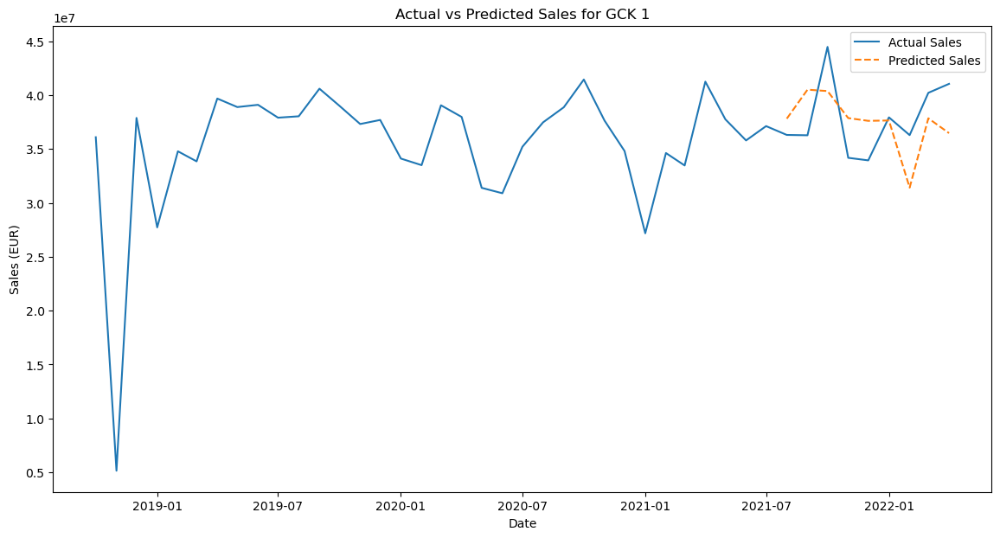

In [21]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck1.index, df_gck1['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck1.index[-len(y1_test):], y1_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 1')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


In [22]:
#Apply the Random Forest model to the GCK 1 data
model1_RF = RandomForestRegressor(random_state=42)

model1_RF.fit(X1_train, y1_train)

y1_pred_RF = model1_RF.predict(X1_test)

rmse1_RF = mean_squared_error(y1_test, y1_pred_RF, squared=False)

rmse1_RF


2855160.862921802

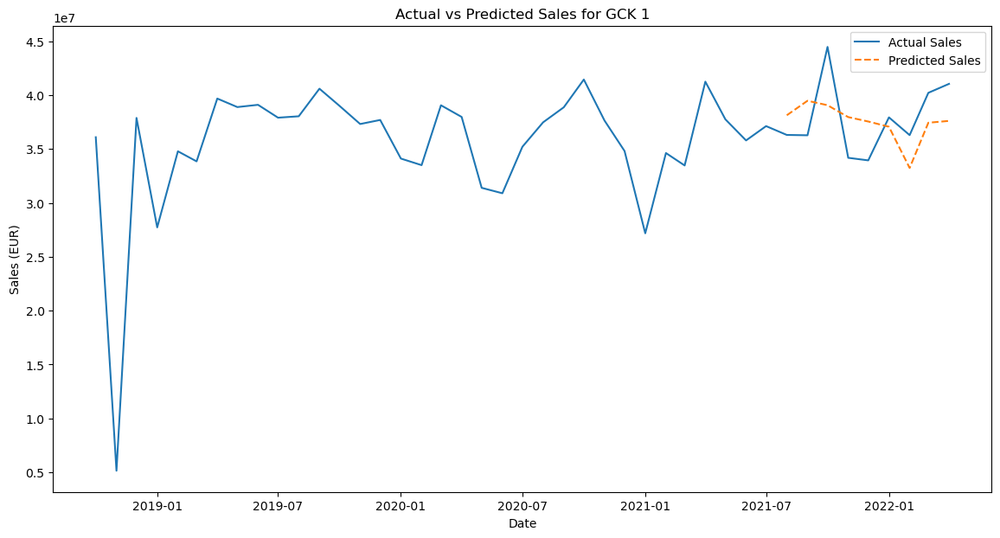

In [23]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck1.index, df_gck1['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck1.index[-len(y1_test):], y1_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 1')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [24]:
#make a linear regression
model1_LR = LinearRegression()

model1_LR.fit(X1_train, y1_train)

y1_pred_LR = model1_LR.predict(X1_test)

rmse1_LR = mean_squared_error(y1_test, y1_pred_LR, squared=False)

rmse1_LR

2989967.4133296

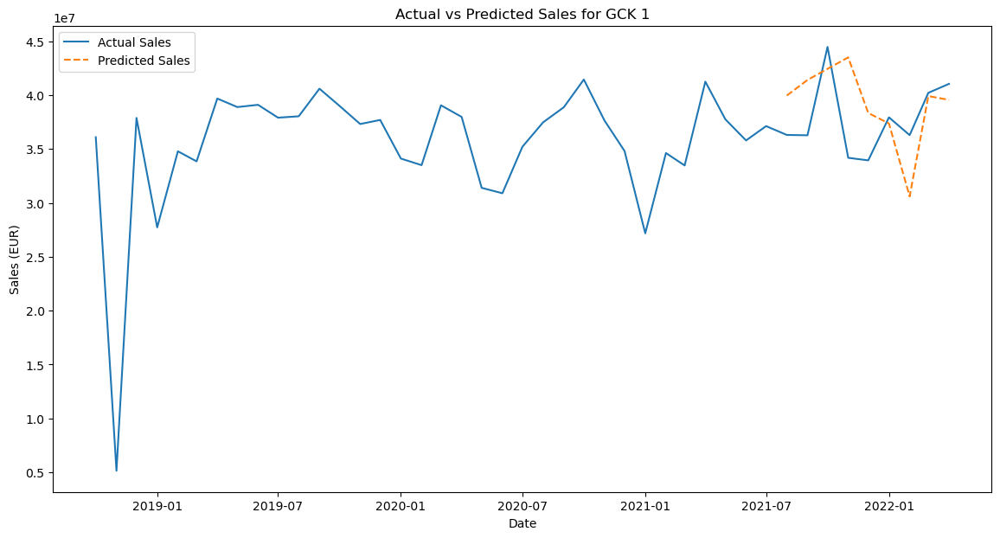

In [25]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck1.index, df_gck1['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck1.index[-len(y1_test):], y1_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 1')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [26]:
#make a knn model
from sklearn.neighbors import KNeighborsRegressor

model1_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model1_KNN.fit(X1_train, y1_train)

y1_pred_KNN = model1_KNN.predict(X1_test)

rmse1_KNN = mean_squared_error(y1_test, y1_pred_KNN, squared=False)

rmse1_KNN

2574299.845503248

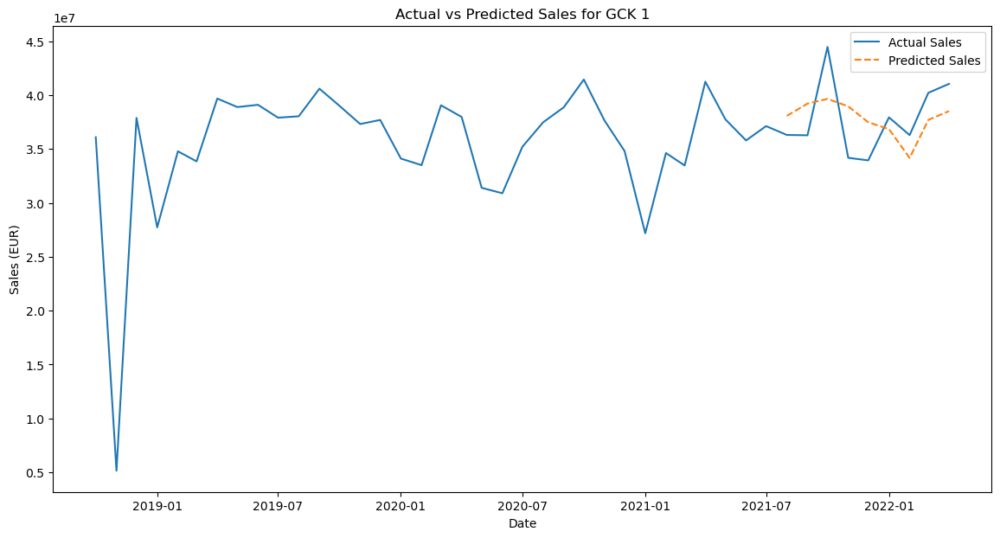

In [27]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck1.index, df_gck1['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck1.index[-len(y1_test):], y1_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 1')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [28]:
#making an ensemble model that runs these 4 models and selects the best one on voting
# Create an ensemble
model1_ensemble = VotingRegressor(estimators=[	
    ('xgb', model1),
    ('rf', model1_RF),
    ('lr', model1_LR),
    ('knn', model1_KNN)
])

model1_ensemble.fit(X1_train, y1_train)

y1_pred_ensemble = model1_ensemble.predict(X1_test)

rmse1_ensemble = mean_squared_error(y1_test, y1_pred_ensemble, squared=False)

rmse1_ensemble

2626833.2917442955

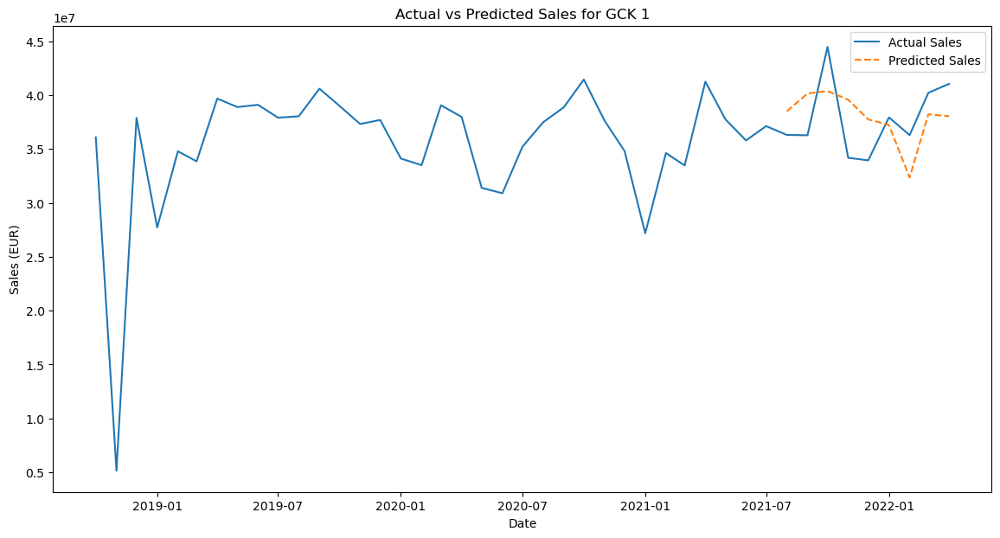

In [29]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck1.index, df_gck1['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck1.index[-len(y1_test):], y1_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 1')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [30]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse1, rmse1_RF, rmse1_LR, rmse1_KNN, rmse1_ensemble]

rmse_table1 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table1

,Model,RMSE
0,XGBoost,3.103321e+06
1,Random Forest,2.855161e+06
2,Linear Regression,2.989967e+06
3,KNN,2.574300e+06
4,Ensemble,2.626833e+06


In [31]:
#predicting the future
#Create a future DataFrame for the GCK 1 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df1 = pd.DataFrame(index=future_dates, columns=df_gck1_filtered.columns)

#Join the future DataFrame with the df_gck1_filtered DataFrame
final_df1 = pd.concat([df_gck1_filtered, future_df1])

final_df1

,MACD Histogram,12 Month EMA,production index: United Kingdom: Electrical equipment_lag_1,production index: Germany: Electrical equipment_lag_3,Sales_EUR
2018-10-01,0.000000,3.609892e+07,110.288394,111.181778,36098918.79
2018-11-01,-308699.589074,1.932992e+07,118.670791,111.284912,5140760.00
2018-12-01,304754.279079,2.657377e+07,120.467019,110.872368,37889612.12
2019-01-01,204951.053075,2.693816e+07,105.378705,118.298233,27728148.35
2019-02-01,341460.167832,2.907234e+07,107.174933,117.163727,34793163.53
2019-03-01,337183.500138,3.023521e+07,110.647640,89.626122,33856803.04
2019-04-01,500261.323346,3.234464e+07,126.214949,105.406097,39688292.01
2019-05-01,510262.834948,3.371222e+07,113.521605,103.652771,38897974.29
2019-06-01,479447.128100,3.477945e+07,117.593055,111.388054,39106750.23
2019-07-01,373567.942235,3.537317e+07,123.101487,102.518265,37912572.30


In [32]:
#Separate the target variable and the features from the final_df DataFrame
y_final1 = final_df1['Sales_EUR']
X_final1 = final_df1.drop('Sales_EUR', axis=1)

In [33]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final1.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df1[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [34]:
final_df1

,MACD Histogram,12 Month EMA,production index: United Kingdom: Electrical equipment_lag_1,production index: Germany: Electrical equipment_lag_3,Sales_EUR
2018-10-01,0.000000,3.609892e+07,110.288394,111.181778,36098918.79
2018-11-01,-308699.589074,1.932992e+07,118.670791,111.284912,5140760.00
2018-12-01,304754.279079,2.657377e+07,120.467019,110.872368,37889612.12
2019-01-01,204951.053075,2.693816e+07,105.378705,118.298233,27728148.35
2019-02-01,341460.167832,2.907234e+07,107.174933,117.163727,34793163.53
2019-03-01,337183.500138,3.023521e+07,110.647640,89.626122,33856803.04
2019-04-01,500261.323346,3.234464e+07,126.214949,105.406097,39688292.01
2019-05-01,510262.834948,3.371222e+07,113.521605,103.652771,38897974.29
2019-06-01,479447.128100,3.477945e+07,117.593055,111.388054,39106750.23
2019-07-01,373567.942235,3.537317e+07,123.101487,102.518265,37912572.30


In [35]:
#Split the target and features
y1_final = final_df1['Sales_EUR']
X1_final = final_df1.drop('Sales_EUR', axis=1)

#Train test split
X1_final_train = X1_final.loc['2018-01-01':'2022-04-01']
y1_final_train = y1_final.loc['2018-01-01':'2022-04-01']
X1_final_test = X1_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X1_final1_train_scaled = scaler.fit_transform(X1_final_train)

X1_final1_test_scaled = scaler.transform(X1_final_test)

#Apply the best model to the final data

model1_KNN.fit(X1_final1_train_scaled, y1_final_train)

y_final_pred = model1_KNN.predict(X1_final1_test_scaled)

y_final_pred

array([36552696.76511866, 35796961.24284899, 37122745.38009132,
       37231466.11393498, 39033638.11578546, 40377730.03854182,
       40187896.0137455 , 39877248.03486123, 36852394.89325295,
       36431251.21510046])

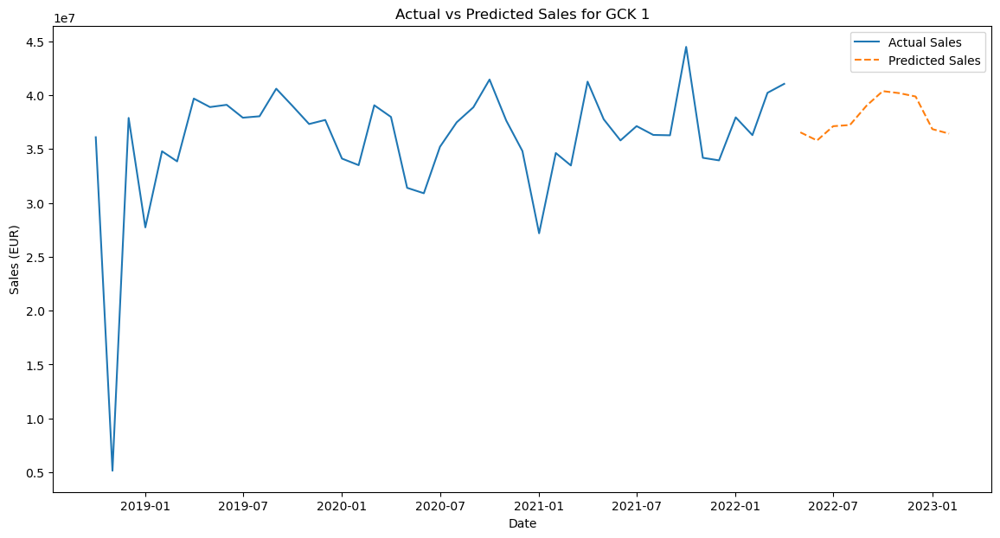

In [36]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df1.index, final_df1['Sales_EUR'], label='Actual Sales')
plt.plot(final_df1.index[-len(y_final_pred):], y_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 1')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 3

In [37]:
df_gck3

,Date,Mapped_GCK,Sales_EUR,Sales_EUR_Lag_1,Sales_EUR_Lag_2,Sales_EUR_Lag_3,Sales_EUR_Lag_4,Sales_EUR_Lag_5,Sales_EUR_Lag_6,Sales_EUR_Lag_7,...,production index: France: Electrical equipment_lag_3,production index: France: Electrical equipment_lag_4,production index: France: Electrical equipment_lag_5,production index: France: Electrical equipment_lag_6,production index: Germany: Electrical equipment_lag_1,production index: Germany: Electrical equipment_lag_2,production index: Germany: Electrical equipment_lag_3,production index: Germany: Electrical equipment_lag_4,production index: Germany: Electrical equipment_lag_5,production index: Germany: Electrical equipment_lag_6
1,2018-10-01,3,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,...,86.400002,95.119263,81.820183,83.933945,110.872368,111.284912,111.181778,116.751183,106.746880,108.706490
15,2018-11-01,3,11863001.51,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,...,64.293579,86.400002,95.119263,81.820183,118.298233,110.872368,111.284912,111.181778,116.751183,106.746880
29,2018-12-01,3,8736859.39,11863001.51,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,...,85.078896,64.293579,86.400002,95.119263,117.163727,118.298233,110.872368,111.284912,111.181778,116.751183
43,2019-01-01,3,10705300.63,8736859.39,11863001.51,8089465.96,8089465.96,8089465.96,8089465.96,8089465.96,...,97.849541,85.078896,64.293579,86.400002,89.626122,117.163727,118.298233,110.872368,111.284912,111.181778
57,2019-02-01,3,10167796.86,10705300.63,8736859.39,11863001.51,8089465.96,8089465.96,8089465.96,8089465.96,...,91.155960,97.849541,85.078896,64.293579,105.406097,89.626122,117.163727,118.298233,110.872368,111.284912
71,2019-03-01,3,11040544.57,10167796.86,10705300.63,8736859.39,11863001.51,8089465.96,8089465.96,8089465.96,...,78.033028,91.155960,97.849541,85.078896,103.652771,105.406097,89.626122,117.163727,118.298233,110.872368
85,2019-04-01,3,12317479.75,11040544.57,10167796.86,10705300.63,8736859.39,11863001.51,8089465.96,8089465.96,...,81.908257,78.033028,91.155960,97.849541,111.388054,103.652771,105.406097,89.626122,117.163727,118.298233
99,2019-05-01,3,12798945.18,12317479.75,11040544.57,10167796.86,10705300.63,8736859.39,11863001.51,8089465.96,...,80.322929,81.908257,78.033028,91.155960,102.518265,111.388054,103.652771,105.406097,89.626122,117.163727
113,2019-06-01,3,11546452.19,12798945.18,12317479.75,11040544.57,10167796.86,10705300.63,8736859.39,11863001.51,...,92.477066,80.322929,81.908257,78.033028,107.468842,102.518265,111.388054,103.652771,105.406097,89.626122
127,2019-07-01,3,13421550.83,11546452.19,12798945.18,12317479.75,11040544.57,10167796.86,10705300.63,8736859.39,...,85.519257,92.477066,80.322929,81.908257,95.814354,107.468842,102.518265,111.388054,103.652771,105.406097


In [38]:
#Set Date to datetime
df_gck3['Date'] = pd.to_datetime(df_gck3['Date'])
df_gck3.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\4217480977.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck3['Date'] = pd.to_datetime(df_gck3['Date'])


In [39]:
#Check the correlation of the features with the target
correlation = df_gck3.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                 1.000000
MACD Histogram                                            0.782381
MACD                                                      0.703741
12 Month EMA                                              0.604805
26 Month EMA                                              0.533946
                                                            ...   
production index: Italy: Electrical equipment_lag_3      -0.276698
production index: Japan: Electrical equipment_lag_1      -0.288663
Italy:Production Index Machinery & Electricals_lag_3     -0.293217
Germany:Production Index Machinery & Electricals_lag_1   -0.329216
Mapped_GCK                                                     NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [40]:
#Code generated with chatgpt

# Compute the correlation of each feature with the target variable
correlation_with_target = {}
for feature in market_features:
    correlation_with_target[feature] = df_gck3[feature].corr(df_gck3['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)


Selected features:
['China:Production Index Machinery & Electricals_lag_3', 'France:Production Index Machinery & Electricals_lag_3', 'France:Shipments Index Machinery & Electricals_lag_5', 'Germany:Production Index Machinery & Electricals_lag_1', 'Germany:Shipments Index Machinery & Electricals', 'Italy:Production Index Machinery & Electricals_lag_3', 'Italy:Shipments Index Machinery & Electricals_lag_4', 'Japan:Production Index Machinery & Electricals', 'Switzerland:Production Index Machinery & Electricals_lag_3', 'UK:Production Index Machinery & Electricals', 'UK:Shipments Index Machinery & Electricals_lag_3', 'US:Production Index Machinery & Electricals_lag_1', 'US:Shipments Index Machinery & Electricals_lag_3', 'Europe:Production Index Machinery & Electricals', 'Europe:Shipments Index Machinery & Electricals', 'World: Price of Energy', 'World: Price of Metals & Minerals_lag_6', 'World: Price of Natural gas index', 'United States: EUR in LCU_lag_6', 'Producer Prices: France: Electri

In [41]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck3 = df_gck3.drop(features_to_remove, axis=1)

In [42]:
#Create a list with the pairs features that are highly correlated (0.95) in df_gck3
correlated_features = set()
correlation_matrix = df_gck3.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features


{'26 Month EMA', 'production index: France: Electrical equipment_lag_3'}

In [43]:
to_drop = ['26 Month EMA','production index: France: Electrical equipment_lag_3']

df_gck3 = df_gck3.drop(to_drop, axis=1)

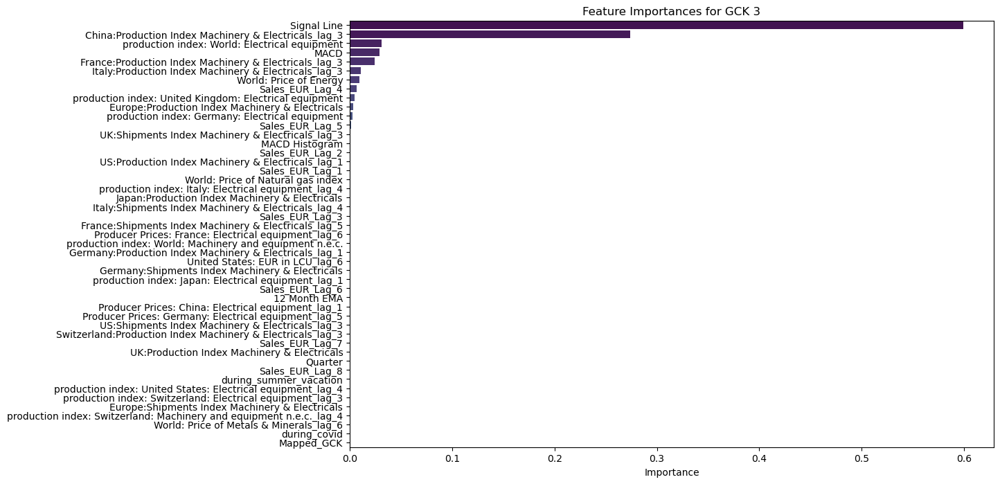

In [44]:
#Apply the XGBoost model to the GCK 3 data to see the feature importance based on RMSE
X_FI3 = df_gck3.drop('Sales_EUR', axis=1)
y_FI3 = df_gck3['Sales_EUR']

X_train_FI3, X_test_FI3, y_train_FI3, y_test_FI3 = train_test_split(X_FI3, y_FI3, test_size=0.2, random_state=42)

model_FI3 = XGBRegressor(objective='reg:squarederror', random_state=42)

model_FI3.fit(X_train_FI3, y_train_FI3)

y_pred_FI3 = model_FI3.predict(X_test_FI3)

rmse_FI3 = mean_squared_error(y_test_FI3, y_pred_FI3, squared=False)

# Get the feature importances
importances_FI3 = model_FI3.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI3 = pd.DataFrame(importances_FI3, index=X_FI3.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI3 = feature_importances_FI3.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI3['Importance'], y=feature_importances_FI3.index, palette='viridis')
plt.title('Feature Importances for GCK 3')
plt.show()


In [45]:
#Get a list of the features with importance greater than 0.01
important_features_FI3 = feature_importances_FI3[feature_importances_FI3['Importance'] > 0.01].index

important_features_FI3

Index(['Signal Line', 'China:Production Index Machinery & Electricals_lag_3',
       'production index: World: Electrical equipment', 'MACD',
       'France:Production Index Machinery & Electricals_lag_3',
       'Italy:Production Index Machinery & Electricals_lag_3'],
      dtype='object')

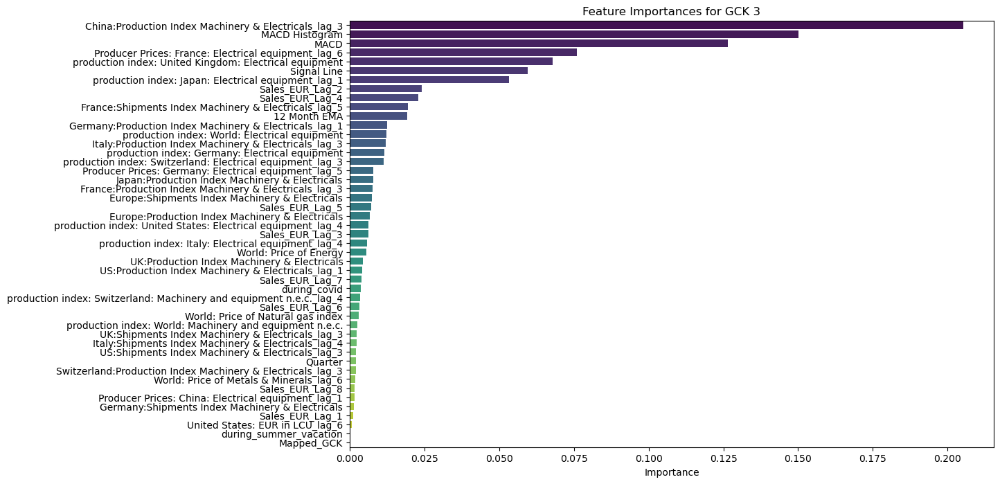

In [46]:
#Do the same with the random forest model
model_RF3 = RandomForestRegressor(random_state=42)

model_RF3.fit(X_train_FI3, y_train_FI3)

y_pred_RF3 = model_RF3.predict(X_test_FI3)
rmse_RF3 = mean_squared_error(y_test_FI3, y_pred_RF3, squared=False)

# Get the feature importances
importances_RF3 = model_RF3.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_RF3 = pd.DataFrame(importances_RF3, index=X_FI3.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_RF3 = feature_importances_RF3.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF3['Importance'], y=feature_importances_RF3.index, palette='viridis')
plt.title('Feature Importances for GCK 3')
plt.show()


In [47]:
#Get a list of the features with importance greater than 0.01
important_features_RF3 = feature_importances_RF3[feature_importances_RF3['Importance'] > 0.01].index

important_features_RF3

Index(['China:Production Index Machinery & Electricals_lag_3',
       'MACD Histogram', 'MACD',
       'Producer Prices: France: Electrical equipment_lag_6',
       'production index: United Kingdom: Electrical equipment', 'Signal Line',
       'production index: Japan: Electrical equipment_lag_1',
       'Sales_EUR_Lag_2', 'Sales_EUR_Lag_4',
       'France:Shipments Index Machinery & Electricals_lag_5', '12 Month EMA',
       'Germany:Production Index Machinery & Electricals_lag_1',
       'production index: World: Electrical equipment',
       'Italy:Production Index Machinery & Electricals_lag_3',
       'production index: Germany: Electrical equipment',
       'production index: Switzerland: Electrical equipment_lag_3'],
      dtype='object')

In [48]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck3 = list(set(important_features_FI3).intersection(important_features_RF3))

important_features_gck3

['Italy:Production Index Machinery & Electricals_lag_3',
 'production index: World: Electrical equipment',
 'Signal Line',
 'MACD',
 'China:Production Index Machinery & Electricals_lag_3']

In [49]:
#Filter the df_gck3 DataFrame to only include the important features and the target variable
df_gck3_filtered = df_gck3[important_features_gck3 + ['Sales_EUR']]

In [50]:
#Make a df for the target variable and the features
y3 = df_gck3_filtered['Sales_EUR']
X3 = df_gck3_filtered.drop('Sales_EUR', axis=1)

#Scale the features with minmaxscaler
X3_scaled = scaler.fit_transform(X3)

#Split the data into train and test
X3_train, X3_test, y3_train, y3_test = train_test_split(X3_scaled, y3, test_size=0.2, random_state=42)


In [51]:
#Apply the XGBoost model to the GCK 3 data
model3 = XGBRegressor(objective='reg:squarederror', random_state=42)

model3.fit(X3_train, y3_train)

y3_pred = model3.predict(X3_test)

rmse3 = mean_squared_error(y3_test, y3_pred, squared=False)

rmse3

2657732.1068129097

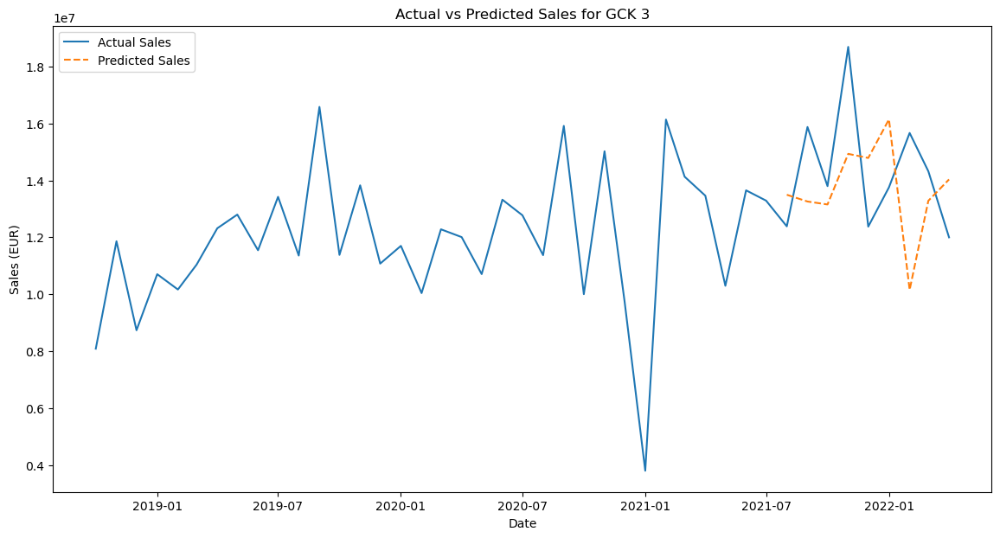

In [52]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck3.index, df_gck3['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck3.index[-len(y3_test):], y3_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 3')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [53]:
#Apply the Random Forest model to the GCK 3 data
model3_RF = RandomForestRegressor(random_state=42)

model3_RF.fit(X3_train, y3_train)

y3_pred_RF = model3_RF.predict(X3_test)

rmse3_RF = mean_squared_error(y3_test, y3_pred_RF, squared=False)

rmse3_RF

2572187.5841014637

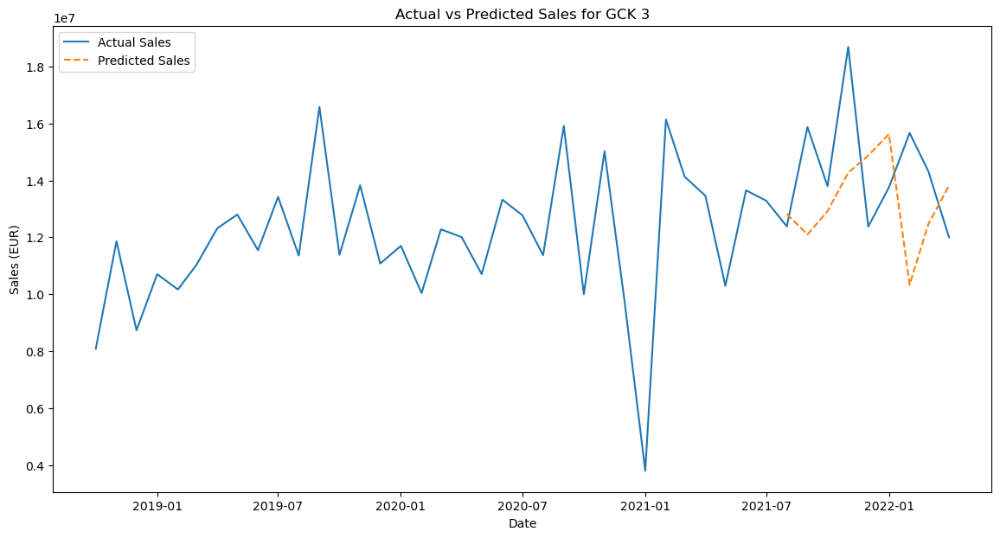

In [54]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck3.index, df_gck3['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck3.index[-len(y3_test):], y3_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 3')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


In [55]:
#apply the a linear regression model to the GCK 3 data
model3_LR = LinearRegression()

model3_LR.fit(X3_train, y3_train)

y3_pred_LR = model3_LR.predict(X3_test)

rmse3_LR = mean_squared_error(y3_test, y3_pred_LR, squared=False)

rmse3_LR



1071342.9966219293

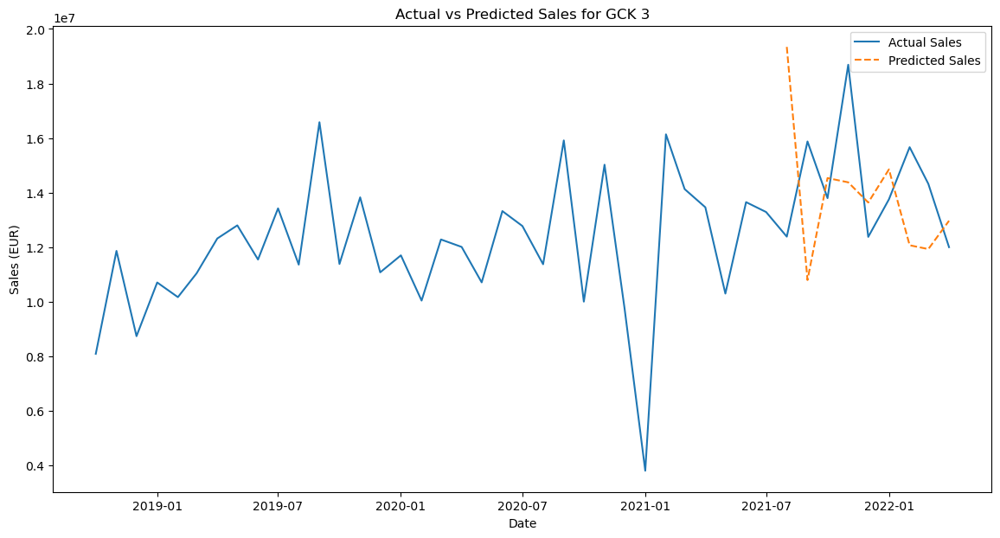

In [56]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck3.index, df_gck3['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck3.index[-len(y3_test):], y3_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 3')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()



In [57]:
#make a knn model
model3_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model3_KNN.fit(X3_train, y3_train)

y3_pred_KNN = model3_KNN.predict(X3_test)

rmse3_KNN = mean_squared_error(y3_test, y3_pred_KNN, squared=False)

rmse3_KNN




2150209.8905843734

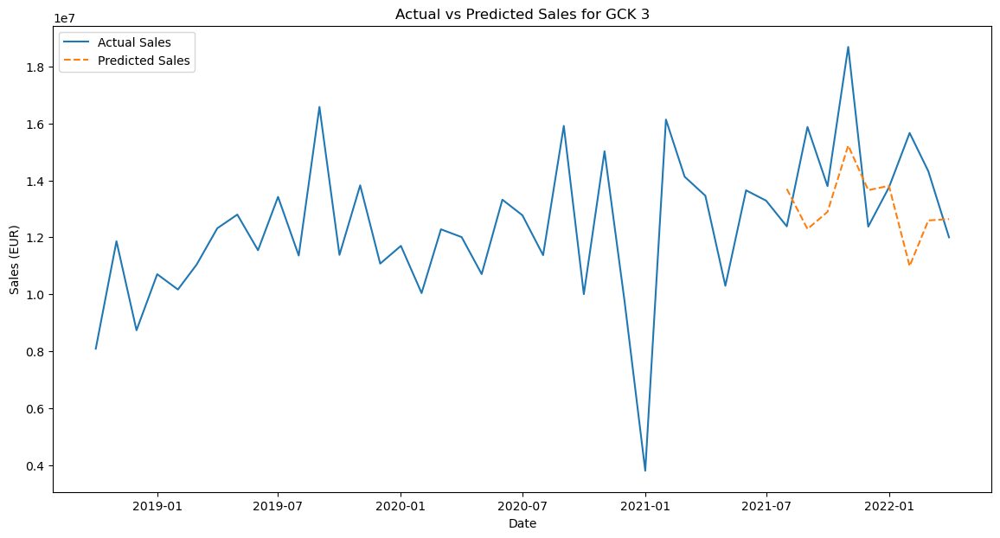

In [58]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck3.index, df_gck3['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck3.index[-len(y3_test):], y3_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 3')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


In [59]:
#make an ensemble with these 4 models
model3_ensemble = VotingRegressor(estimators=[
    ('xgb', model3),
    ('rf', model3_RF),
    ('lr', model3_LR),
    ('knn', model3_KNN)
])

model3_ensemble.fit(X3_train, y3_train)

y3_pred_ensemble = model3_ensemble.predict(X3_test)

rmse3_ensemble = mean_squared_error(y3_test, y3_pred_ensemble, squared=False)

rmse3_ensemble

1922539.2198051866

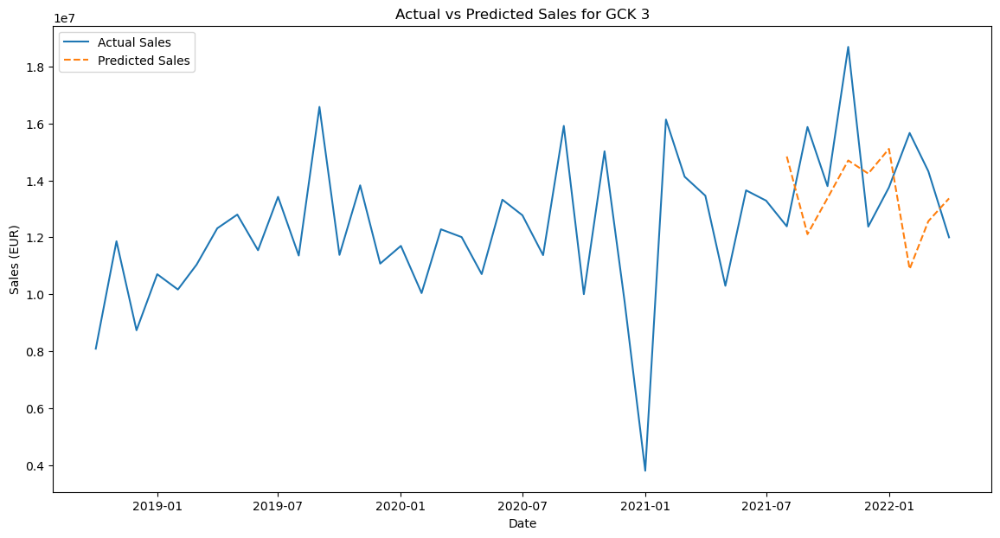

In [60]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck3.index, df_gck3['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck3.index[-len(y3_test):], y3_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 3')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [61]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse3, rmse3_RF, rmse3_LR, rmse3_KNN, rmse3_ensemble]

rmse_table3 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table3

,Model,RMSE
0,XGBoost,2.657732e+06
1,Random Forest,2.572188e+06
2,Linear Regression,1.071343e+06
3,KNN,2.150210e+06
4,Ensemble,1.922539e+06


In [62]:
#Create a future DataFrame for the GCK 3 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df3 = pd.DataFrame(index=future_dates, columns=df_gck3_filtered.columns)

#Join the future DataFrame with the df_gck1_filtered DataFrame
final_df3 = pd.concat([df_gck3_filtered, future_df3])

final_df3

,Italy:Production Index Machinery & Electricals_lag_3,production index: World: Electrical equipment,Signal Line,MACD,China:Production Index Machinery & Electricals_lag_3,Sales_EUR
2018-10-01,116.499514,129.325775,0.000000,0.000000,207.834743,8089465.96
2018-11-01,60.764542,128.236176,47034.809206,84662.656571,197.528665,11863001.51
2018-12-01,105.463832,117.043549,32240.030355,10935.548811,199.419203,8736859.39
2019-01-01,118.350514,111.522202,37648.161527,48204.833573,211.955755,10705300.63
2019-02-01,107.719260,112.666725,40148.428901,46053.060333,220.519655,10167796.86
2019-03-01,88.783181,131.456177,51279.241027,81213.111460,241.846854,11040544.57
2019-04-01,99.275113,119.415619,78846.720909,160210.042653,175.668147,12317479.75
2019-05-01,104.586684,122.786171,116013.376702,233502.349260,175.668147,12798945.18
2019-06-01,114.299549,125.168800,139702.691167,218562.319201,261.642802,11546452.19
2019-07-01,99.732969,125.639954,175925.447816,301369.530017,219.595813,13421550.83


In [63]:
#Separate the target variable and the features from the final_df DataFrame
y_final3 = final_df3['Sales_EUR']
X_final3 = final_df3.drop('Sales_EUR', axis=1)

In [64]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final3.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df3[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [65]:
final_df3

,Italy:Production Index Machinery & Electricals_lag_3,production index: World: Electrical equipment,Signal Line,MACD,China:Production Index Machinery & Electricals_lag_3,Sales_EUR
2018-10-01,116.499514,129.325775,0.000000,0.000000,207.834743,8089465.96
2018-11-01,60.764542,128.236176,47034.809206,84662.656571,197.528665,11863001.51
2018-12-01,105.463832,117.043549,32240.030355,10935.548811,199.419203,8736859.39
2019-01-01,118.350514,111.522202,37648.161527,48204.833573,211.955755,10705300.63
2019-02-01,107.719260,112.666725,40148.428901,46053.060333,220.519655,10167796.86
2019-03-01,88.783181,131.456177,51279.241027,81213.111460,241.846854,11040544.57
2019-04-01,99.275113,119.415619,78846.720909,160210.042653,175.668147,12317479.75
2019-05-01,104.586684,122.786171,116013.376702,233502.349260,175.668147,12798945.18
2019-06-01,114.299549,125.168800,139702.691167,218562.319201,261.642802,11546452.19
2019-07-01,99.732969,125.639954,175925.447816,301369.530017,219.595813,13421550.83


In [66]:
#Split the target and features
y3_final = final_df3['Sales_EUR']
X3_final = final_df3.drop('Sales_EUR', axis=1)

#Train test split
X3_final_train = X3_final.loc['2018-01-01':'2022-04-01']
y3_final_train = y3_final.loc['2018-01-01':'2022-04-01']
X3_final_test = X3_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X3_final3_train_scaled = scaler.fit_transform(X3_final_train)

X3_final3_test_scaled = scaler.transform(X3_final_test)

#Apply the Lr model to the final data
model3_LR.fit(X3_final3_train_scaled, y3_final_train)

y3_final_pred = model3_LR.predict(X3_final3_test_scaled)

y3_final_pred

array([ 9818221.39167327, 13014089.83889296, 13752142.76940657,
       12554285.14657241, 13977684.66178719, 11172365.30267587,
       14977898.07338111, 11142558.04340507,  7910121.15945687,
       10947178.56744054])

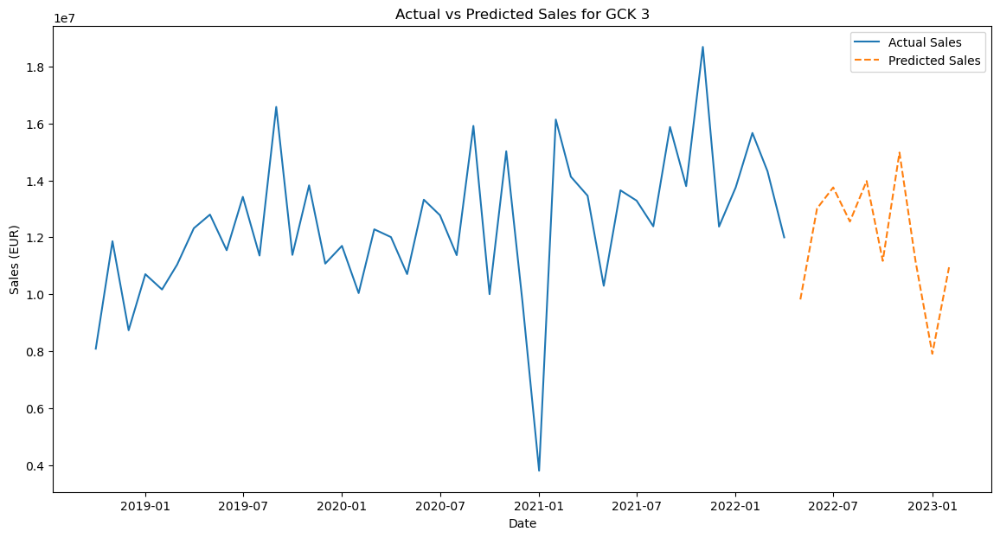

In [67]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df3.index, final_df3['Sales_EUR'], label='Actual Sales')
plt.plot(final_df3.index[-len(y3_final_pred):], y3_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 3')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


# GCK 4

In [68]:
df_gck4

,Date,Mapped_GCK,Sales_EUR,Sales_EUR_Lag_1,Sales_EUR_Lag_2,Sales_EUR_Lag_3,Sales_EUR_Lag_4,Sales_EUR_Lag_5,Sales_EUR_Lag_6,Sales_EUR_Lag_7,...,production index: France: Electrical equipment_lag_3,production index: France: Electrical equipment_lag_4,production index: France: Electrical equipment_lag_5,production index: France: Electrical equipment_lag_6,production index: Germany: Electrical equipment_lag_1,production index: Germany: Electrical equipment_lag_2,production index: Germany: Electrical equipment_lag_3,production index: Germany: Electrical equipment_lag_4,production index: Germany: Electrical equipment_lag_5,production index: Germany: Electrical equipment_lag_6
2,2018-10-01,4,397760.69,397760.69,397760.69,397760.69,397760.69,397760.69,397760.69,397760.69,...,86.400002,95.119263,81.820183,83.933945,110.872368,111.284912,111.181778,116.751183,106.746880,108.706490
16,2018-11-01,4,371322.42,397760.69,397760.69,397760.69,397760.69,397760.69,397760.69,397760.69,...,64.293579,86.400002,95.119263,81.820183,118.298233,110.872368,111.284912,111.181778,116.751183,106.746880
30,2018-12-01,4,430100.96,371322.42,397760.69,397760.69,397760.69,397760.69,397760.69,397760.69,...,85.078896,64.293579,86.400002,95.119263,117.163727,118.298233,110.872368,111.284912,111.181778,116.751183
44,2019-01-01,4,484173.88,430100.96,371322.42,397760.69,397760.69,397760.69,397760.69,397760.69,...,97.849541,85.078896,64.293579,86.400002,89.626122,117.163727,118.298233,110.872368,111.284912,111.181778
58,2019-02-01,4,620031.80,484173.88,430100.96,371322.42,397760.69,397760.69,397760.69,397760.69,...,91.155960,97.849541,85.078896,64.293579,105.406097,89.626122,117.163727,118.298233,110.872368,111.284912
72,2019-03-01,4,491643.59,620031.80,484173.88,430100.96,371322.42,397760.69,397760.69,397760.69,...,78.033028,91.155960,97.849541,85.078896,103.652771,105.406097,89.626122,117.163727,118.298233,110.872368
86,2019-04-01,4,426221.34,491643.59,620031.80,484173.88,430100.96,371322.42,397760.69,397760.69,...,81.908257,78.033028,91.155960,97.849541,111.388054,103.652771,105.406097,89.626122,117.163727,118.298233
100,2019-05-01,4,375671.57,426221.34,491643.59,620031.80,484173.88,430100.96,371322.42,397760.69,...,80.322929,81.908257,78.033028,91.155960,102.518265,111.388054,103.652771,105.406097,89.626122,117.163727
114,2019-06-01,4,190721.15,375671.57,426221.34,491643.59,620031.80,484173.88,430100.96,371322.42,...,92.477066,80.322929,81.908257,78.033028,107.468842,102.518265,111.388054,103.652771,105.406097,89.626122
128,2019-07-01,4,381274.96,190721.15,375671.57,426221.34,491643.59,620031.80,484173.88,430100.96,...,85.519257,92.477066,80.322929,81.908257,95.814354,107.468842,102.518265,111.388054,103.652771,105.406097


In [69]:
#Set Date to datetime
df_gck4['Date'] = pd.to_datetime(df_gck4['Date'])
df_gck4.set_index('Date', inplace = True)


C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\3538860384.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck4['Date'] = pd.to_datetime(df_gck4['Date'])


In [70]:
#Check the correlation of the features with the target
correlation = df_gck4.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                       1.000000
MACD Histogram                                                  0.718694
MACD                                                            0.656689
12 Month EMA                                                    0.551033
United States: EUR in LCU_lag_1                                 0.465472
                                                                  ...   
Italy:Production Index Machinery & Electricals_lag_6           -0.291348
Germany:Shipments Index Machinery & Electricals_lag_1          -0.297690
UK:Production Index Machinery & Electricals_lag_5              -0.304758
production index: United Kingdom: Electrical equipment_lag_5   -0.328474
Mapped_GCK                                                           NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [71]:
#Code generated with chatgpt
# Compute the correlation of each feature with the target variable
correlation_with_target = {}
for feature in market_features:
    correlation_with_target[feature] = df_gck4[feature].corr(df_gck4['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_6', 'France:Production Index Machinery & Electricals', 'France:Shipments Index Machinery & Electricals_lag_3', 'Germany:Production Index Machinery & Electricals_lag_1', 'Germany:Shipments Index Machinery & Electricals_lag_1', 'Italy:Production Index Machinery & Electricals', 'Italy:Shipments Index Machinery & Electricals_lag_1', 'Japan:Production Index Machinery & Electricals', 'Switzerland:Production Index Machinery & Electricals', 'UK:Production Index Machinery & Electricals_lag_5', 'UK:Shipments Index Machinery & Electricals_lag_5', 'US:Production Index Machinery & Electricals_lag_1', 'US:Shipments Index Machinery & Electricals_lag_5', 'Europe:Production Index Machinery & Electricals_lag_1', 'Europe:Shipments Index Machinery & Electricals_lag_1', 'World: Price of Energy_lag_6', 'World: Price of Metals & Minerals', 'World: Price of Natural gas index_lag_2', 'United States: EUR in LCU_lag_1', 'Producer Prices: Fra

In [72]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck4 = df_gck4.drop(features_to_remove, axis=1)

In [73]:
#Create a list with the pairs features that are highly correlated (0.95) in df_gck4
correlated_features = set()
correlation_matrix = df_gck4.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'production index: France: Electrical equipment',
 'production index: Italy: Electrical equipment'}

In [74]:
to_drop = ['production index: France: Electrical equipment','production index: Italy: Electrical equipment']

df_gck4 = df_gck4.drop(to_drop, axis=1)

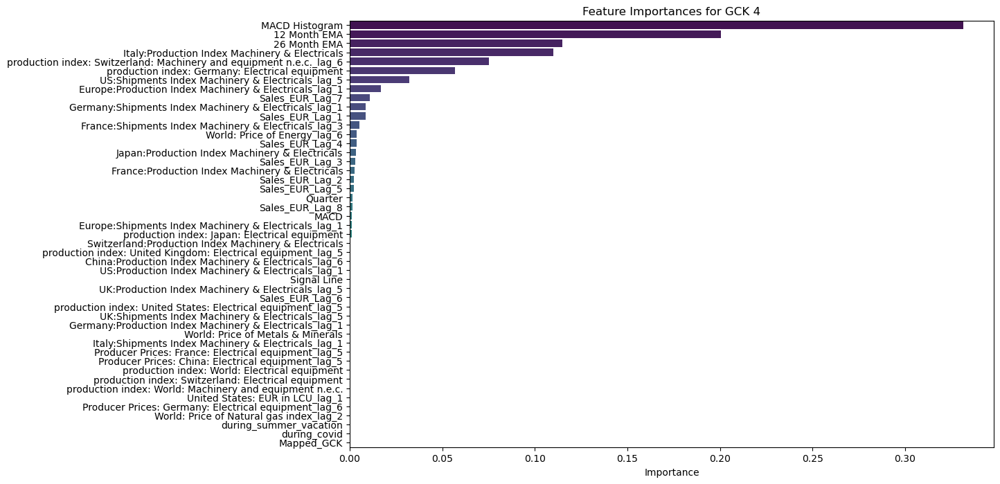

In [75]:
#Apply the XGBoost model to the GCK 4 data to see the feature importance based on RMSE
X_FI4 = df_gck4.drop('Sales_EUR', axis=1)
y_FI4 = df_gck4['Sales_EUR']

X_train_FI4, X_test_FI4, y_train_FI4, y_test_FI4 = train_test_split(X_FI4, y_FI4, test_size=0.2, random_state=42)

model_FI4 = XGBRegressor(objective='reg:squarederror', random_state=10)

model_FI4.fit(X_train_FI4, y_train_FI4)

y_pred_FI4 = model_FI4.predict(X_test_FI4)

rmse_FI4 = mean_squared_error(y_test_FI4, y_pred_FI4, squared=False)

# Get the feature importances
importances_FI4 = model_FI4.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI4 = pd.DataFrame(importances_FI4, index=X_FI4.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI4 = feature_importances_FI4.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI4['Importance'], y=feature_importances_FI4.index, palette='viridis')
plt.title('Feature Importances for GCK 4')
plt.show()

In [76]:
#Get a list of the features with importance greater than 0.01
important_features_FI4 = feature_importances_FI4[feature_importances_FI4['Importance'] > 0.01].index

important_features_FI4

Index(['MACD Histogram', '12 Month EMA', '26 Month EMA',
       'Italy:Production Index Machinery & Electricals',
       'production index: Switzerland: Machinery and equipment n.e.c._lag_6',
       'production index: Germany: Electrical equipment',
       'US:Shipments Index Machinery & Electricals_lag_5',
       'Europe:Production Index Machinery & Electricals_lag_1',
       'Sales_EUR_Lag_7'],
      dtype='object')

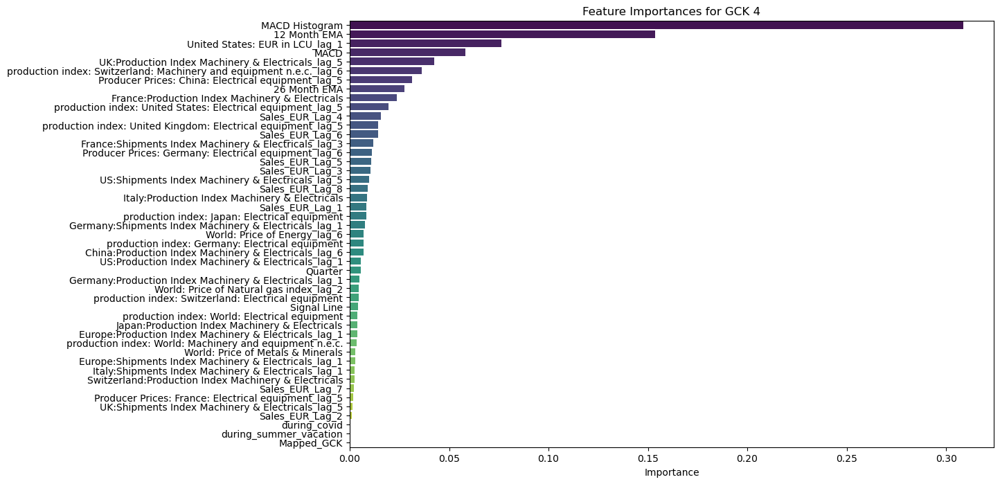

In [77]:
#Do the same with Random Forest model 
model_RF4 = RandomForestRegressor(random_state=100)

model_RF4.fit(X_train_FI4, y_train_FI4)

y_pred_RF4 = model_RF4.predict(X_test_FI4)
rmse_RF4 = mean_squared_error(y_test_FI4, y_pred_RF4, squared=False)

# Get the feature importances
importances_RF4 = model_RF4.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_RF4 = pd.DataFrame(importances_RF4, index=X_FI4.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_RF4 = feature_importances_RF4.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF4['Importance'], y=feature_importances_RF4.index, palette='viridis')
plt.title('Feature Importances for GCK 4')
plt.show()

In [78]:
#Get a list of the features with importance greater than 0.01
important_features_RF4 = feature_importances_RF4[feature_importances_RF4['Importance'] > 0.01].index

important_features_RF4


Index(['MACD Histogram', '12 Month EMA', 'United States: EUR in LCU_lag_1',
       'MACD', 'UK:Production Index Machinery & Electricals_lag_5',
       'production index: Switzerland: Machinery and equipment n.e.c._lag_6',
       'Producer Prices: China: Electrical equipment_lag_5', '26 Month EMA',
       'France:Production Index Machinery & Electricals',
       'production index: United States: Electrical equipment_lag_5',
       'Sales_EUR_Lag_4',
       'production index: United Kingdom: Electrical equipment_lag_5',
       'Sales_EUR_Lag_6',
       'France:Shipments Index Machinery & Electricals_lag_3',
       'Producer Prices: Germany: Electrical equipment_lag_6',
       'Sales_EUR_Lag_5', 'Sales_EUR_Lag_3'],
      dtype='object')

In [79]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck4 = list(set(important_features_FI4).intersection(important_features_RF4))

important_features_gck4

['MACD Histogram',
 '12 Month EMA',
 'production index: Switzerland: Machinery and equipment n.e.c._lag_6',
 '26 Month EMA']

In [80]:
#Filter the df_gck4 DataFrame to only include the important features and the target variable
df_gck4_filtered = df_gck4[important_features_gck4 + ['Sales_EUR']]

In [81]:
df_gck4_filtered

,MACD Histogram,12 Month EMA,production index: Switzerland: Machinery and equipment n.e.c._lag_6,26 Month EMA,Sales_EUR
Date,,,,,
2018-10-01,0.000000,397760.690000,98.646005,397760.690000,397760.69
2018-11-01,-263.629473,383439.960417,99.804336,384033.126731,371322.42
2018-12-01,824.131021,401651.759330,100.962667,400584.851942,430100.96
2019-01-01,2317.867800,427700.767823,101.588792,423952.691382,484173.88
2019-02-01,6394.338173,479956.421879,102.214917,469424.245418,620031.80
2019-03-01,3487.690894,482797.018592,102.841042,473874.602922,491643.59
2019-04-01,-494.531234,470172.353857,106.816937,465399.717140,426221.34
2019-05-01,-4374.214280,450451.496817,110.792831,450942.289322,375671.57
2019-06-01,-13217.206808,399067.589641,114.768725,412371.803856,190721.15


In [82]:
#Make a df for the target variable and the features
y4 = df_gck4_filtered['Sales_EUR']
X4 = df_gck4_filtered.drop('Sales_EUR', axis=1)

#Scale the features with minmaxscaler
X4_scaled = scaler.fit_transform(X4)

#Split the data into train and test
X4_train, X4_test, y4_train, y4_test = train_test_split(X4_scaled, y4, test_size=0.2, random_state=42)


In [83]:
#Apply the XGBoost model to the GCK 4 data
model4 = XGBRegressor(objective='reg:squarederror', random_state=42)

model4.fit(X4_train, y4_train)

y4_pred = model4.predict(X4_test)

rmse4 = mean_squared_error(y4_test, y4_pred, squared=False)

rmse4

135192.61603316074

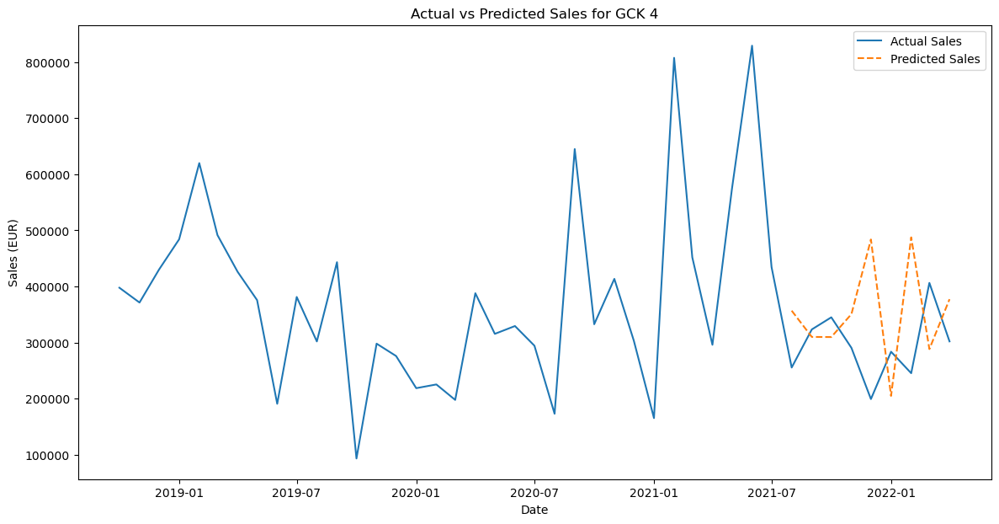

In [84]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck4.index, df_gck4['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck4.index[-len(y4_test):], y4_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 4')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [85]:
#Apply the Random Forest model to the GCK 4 data
model4_RF = RandomForestRegressor(random_state=42)

model4_RF.fit(X4_train, y4_train)

y4_pred_RF = model4_RF.predict(X4_test)

rmse4_RF = mean_squared_error(y4_test, y4_pred_RF, squared=False)

rmse4_RF

142395.2845366154

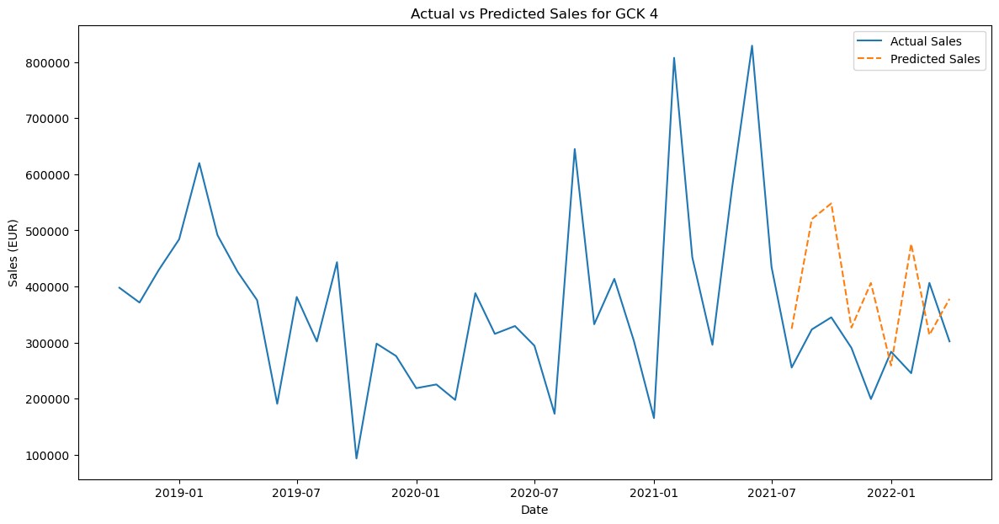

In [86]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck4.index, df_gck4['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck4.index[-len(y4_test):], y4_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 4')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [87]:
#Apply the SARIMA model to the GCK 4 data
model4_SARIMA = SARIMAX(y4, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))

results = model4_SARIMA.fit()

#Get the predictions
start = len(y4_train)
end = len(y4_train) + len(y4_test) - 1

y4_pred_SARIMA = results.predict(start=start, end=end, typ='levels')

rmse4_SARIMA = mean_squared_error(y4_test, y4_pred_SARIMA, squared=False)

rmse4_SARIMA

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


150360.26061042774

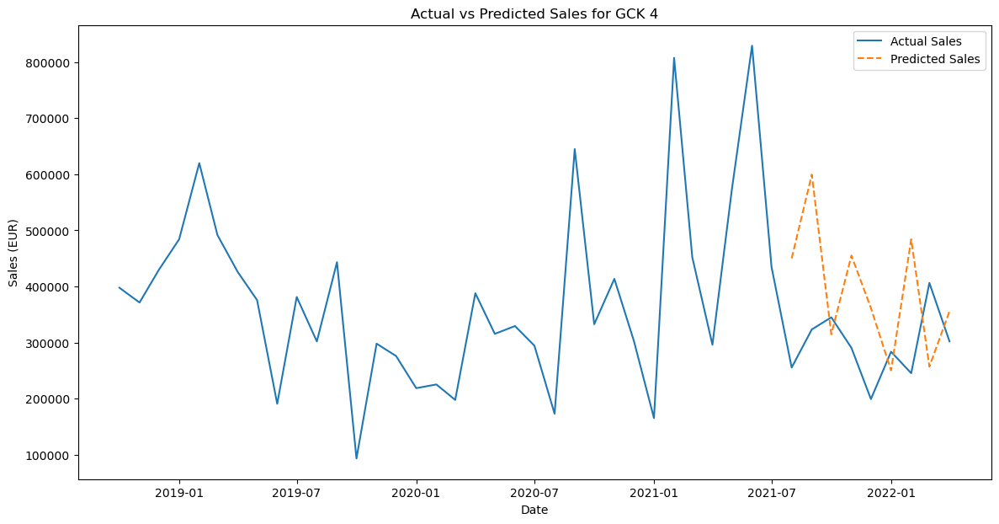

In [88]:
#Plot the sales 
plt.figure(figsize=(14, 7))
plt.plot(df_gck4.index, df_gck4['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck4.index[-len(y4_test):], y4_pred_SARIMA, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 4')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [89]:
#apply the a linear regression model to the GCK 4 data
model4_LR = LinearRegression()

model4_LR.fit(X4_train, y4_train)

y4_pred_LR = model4_LR.predict(X4_test)

rmse4_LR = mean_squared_error(y4_test, y4_pred_LR, squared=False)

rmse4_LR

111325.62456421161

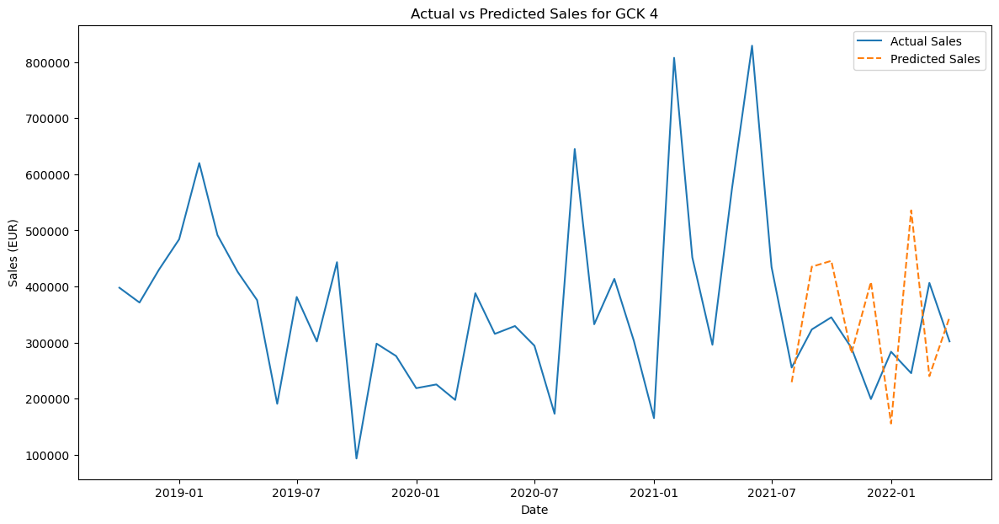

In [90]:
#plot the sales 
plt.figure(figsize=(14, 7))
plt.plot(df_gck4.index, df_gck4['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck4.index[-len(y4_test):], y4_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 4')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [91]:
#make a knn model
model4_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model4_KNN.fit(X4_train, y4_train)

y4_pred_KNN = model4_KNN.predict(X4_test)

rmse4_KNN = mean_squared_error(y4_test, y4_pred_KNN, squared=False)

rmse4_KNN

135676.4004632216

In [92]:
#Make an ensemble model that runs these 4 models and selects the best one
model4_ensemble = VotingRegressor(estimators=[
    ('xgb', model4),
    ('rf', model4_RF),
    ('lr', model4_LR),
    ('knn', model4_KNN)
])

model4_ensemble.fit(X4_train, y4_train)

y4_pred_ensemble = model4_ensemble.predict(X4_test)

rmse4_ensemble = mean_squared_error(y4_test, y4_pred_ensemble, squared=False)

rmse4_ensemble

121943.51597623313

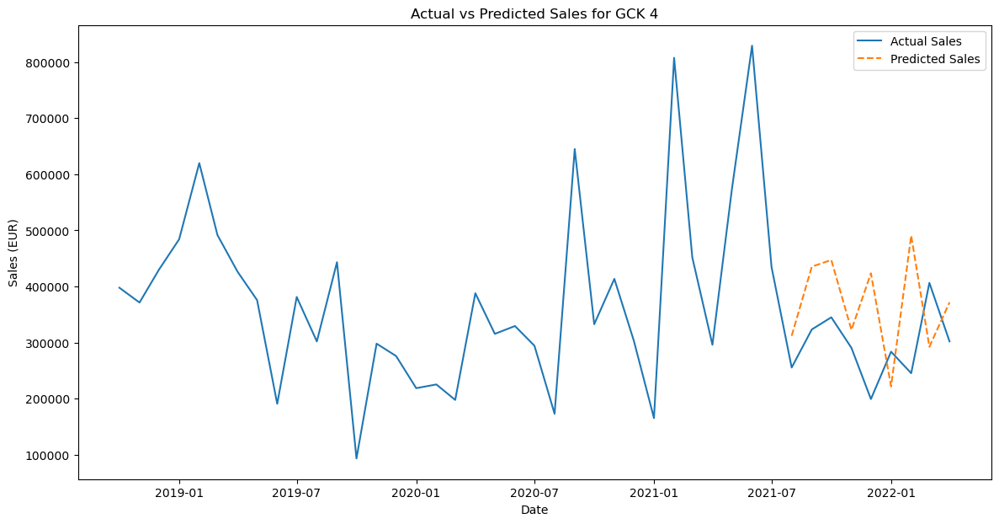

In [93]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck4.index, df_gck4['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck4.index[-len(y4_test):], y4_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 4')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [94]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'SARIMA', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse4, rmse4_RF, rmse4_SARIMA, rmse4_LR, rmse4_KNN, rmse4_ensemble]

rmse_table4 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table4


,Model,RMSE
0,XGBoost,135192.616033
1,Random Forest,142395.284537
2,SARIMA,150360.260610
3,Linear Regression,111325.624564
4,KNN,135676.400463
5,Ensemble,121943.515976


In [95]:
df_gck4_filtered

,MACD Histogram,12 Month EMA,production index: Switzerland: Machinery and equipment n.e.c._lag_6,26 Month EMA,Sales_EUR
Date,,,,,
2018-10-01,0.000000,397760.690000,98.646005,397760.690000,397760.69
2018-11-01,-263.629473,383439.960417,99.804336,384033.126731,371322.42
2018-12-01,824.131021,401651.759330,100.962667,400584.851942,430100.96
2019-01-01,2317.867800,427700.767823,101.588792,423952.691382,484173.88
2019-02-01,6394.338173,479956.421879,102.214917,469424.245418,620031.80
2019-03-01,3487.690894,482797.018592,102.841042,473874.602922,491643.59
2019-04-01,-494.531234,470172.353857,106.816937,465399.717140,426221.34
2019-05-01,-4374.214280,450451.496817,110.792831,450942.289322,375671.57
2019-06-01,-13217.206808,399067.589641,114.768725,412371.803856,190721.15


In [96]:
#Create a future DataFrame for the GCK 4 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df4 = pd.DataFrame(index=future_dates, columns=df_gck4_filtered.columns)

#Join the future DataFrame with the df_gck1_filtered DataFrame
final_df4 = pd.concat([df_gck4_filtered, future_df4])

final_df4

,MACD Histogram,12 Month EMA,production index: Switzerland: Machinery and equipment n.e.c._lag_6,26 Month EMA,Sales_EUR
2018-10-01,0.000000,397760.690000,98.646005,397760.690000,397760.69
2018-11-01,-263.629473,383439.960417,99.804336,384033.126731,371322.42
2018-12-01,824.131021,401651.759330,100.962667,400584.851942,430100.96
2019-01-01,2317.867800,427700.767823,101.588792,423952.691382,484173.88
2019-02-01,6394.338173,479956.421879,102.214917,469424.245418,620031.80
2019-03-01,3487.690894,482797.018592,102.841042,473874.602922,491643.59
2019-04-01,-494.531234,470172.353857,106.816937,465399.717140,426221.34
2019-05-01,-4374.214280,450451.496817,110.792831,450942.289322,375671.57
2019-06-01,-13217.206808,399067.589641,114.768725,412371.803856,190721.15
2019-07-01,-9542.411049,395695.893239,109.196212,408080.742060,381274.96


In [97]:
#Separate the target variable and the features from the final_df DataFrame
y_final4 = final_df4['Sales_EUR']
X_final4 = final_df4.drop('Sales_EUR', axis=1)

In [98]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final4.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df4[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]


c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

In [99]:
final_df4

,MACD Histogram,12 Month EMA,production index: Switzerland: Machinery and equipment n.e.c._lag_6,26 Month EMA,Sales_EUR
2018-10-01,0.000000,397760.690000,98.646005,397760.690000,397760.69
2018-11-01,-263.629473,383439.960417,99.804336,384033.126731,371322.42
2018-12-01,824.131021,401651.759330,100.962667,400584.851942,430100.96
2019-01-01,2317.867800,427700.767823,101.588792,423952.691382,484173.88
2019-02-01,6394.338173,479956.421879,102.214917,469424.245418,620031.80
2019-03-01,3487.690894,482797.018592,102.841042,473874.602922,491643.59
2019-04-01,-494.531234,470172.353857,106.816937,465399.717140,426221.34
2019-05-01,-4374.214280,450451.496817,110.792831,450942.289322,375671.57
2019-06-01,-13217.206808,399067.589641,114.768725,412371.803856,190721.15
2019-07-01,-9542.411049,395695.893239,109.196212,408080.742060,381274.96


In [100]:
#Split the target and features
y4_final = final_df4['Sales_EUR']
X4_final = final_df4.drop('Sales_EUR', axis=1)

#Train test split
X4_final_train = X4_final.loc['2018-01-01':'2022-04-01']
y4_final_train = y4_final.loc['2018-01-01':'2022-04-01']
X4_final_test = X4_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X4_final4_train_scaled = scaler.fit_transform(X4_final_train)

X4_final4_test_scaled = scaler.transform(X4_final_test)

#Apply the Lr model to the final data

model4_LR.fit(X4_final4_train_scaled, y4_final_train)

y4_final_pred = model4_LR.predict(X4_final4_test_scaled)

y4_final_pred

array([275353.96039263, 336599.95128465, 337234.46931103, 274897.23021533,
       381364.38608189, 371831.5213139 , 378848.02862539, 334001.65633536,
       269512.73418271, 343958.39300705])

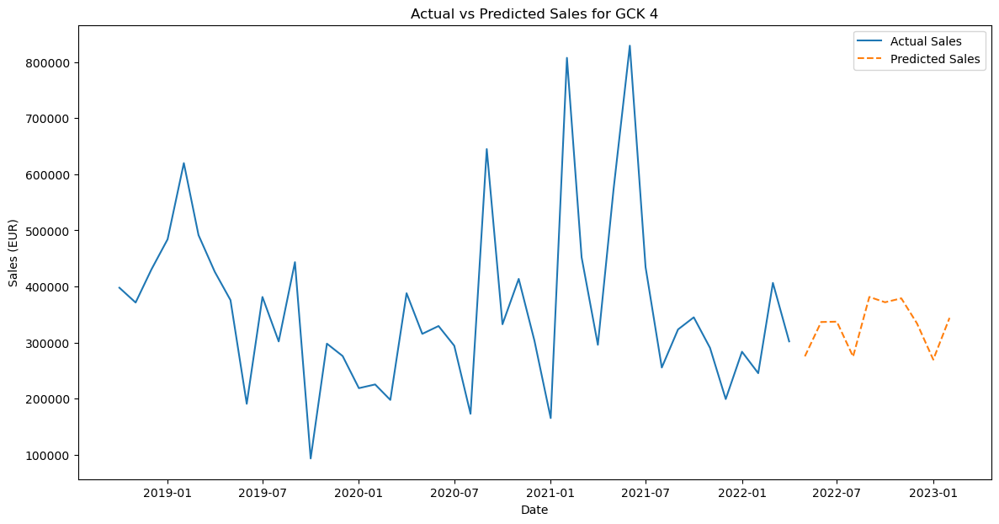

In [101]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df4.index, final_df4['Sales_EUR'], label='Actual Sales')
plt.plot(final_df4.index[-len(y4_final_pred):], y4_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 4')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 5

In [102]:
#Set Date to datetime
df_gck5['Date'] = pd.to_datetime(df_gck5['Date'])
df_gck5.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\2965480427.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck5['Date'] = pd.to_datetime(df_gck5['Date'])


In [103]:
#Check the correlation of the features with the target
correlation = df_gck5.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                 1.000000
MACD Histogram                                            0.696578
MACD                                                      0.628165
12 Month EMA                                              0.524025
Sales_EUR_Lag_6                                           0.453461
                                                            ...   
Germany:Shipments Index Machinery & Electricals_lag_1    -0.433726
Germany:Production Index Machinery & Electricals_lag_1   -0.440443
production index: Japan: Electrical equipment_lag_1      -0.452577
France:Shipments Index Machinery & Electricals_lag_1     -0.478455
Mapped_GCK                                                     NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [104]:
#Code generated with chatgpt

# Compute the correlation of each feature with the target variable
correlation_with_target = {}
for feature in market_features:
    correlation_with_target[feature] = df_gck5[feature].corr(df_gck5['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_3', 'France:Production Index Machinery & Electricals_lag_1', 'France:Shipments Index Machinery & Electricals_lag_1', 'Germany:Production Index Machinery & Electricals_lag_1', 'Germany:Shipments Index Machinery & Electricals_lag_1', 'Italy:Production Index Machinery & Electricals_lag_1', 'Italy:Shipments Index Machinery & Electricals_lag_1', 'Japan:Production Index Machinery & Electricals_lag_1', 'Switzerland:Production Index Machinery & Electricals_lag_2', 'UK:Production Index Machinery & Electricals_lag_1', 'UK:Shipments Index Machinery & Electricals_lag_1', 'US:Production Index Machinery & Electricals_lag_6', 'US:Shipments Index Machinery & Electricals_lag_3', 'Europe:Production Index Machinery & Electricals_lag_1', 'Europe:Shipments Index Machinery & Electricals_lag_1', 'World: Price of Energy', 'World: Price of Metals & Minerals_lag_3', 'World: Price of Natural gas index', 'United States: EUR in LCU_lag_4', 'Pr

In [105]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck5 = df_gck5.drop(features_to_remove, axis=1)

In [106]:
#Create a list with the pairs features that are highly correlated (0.95) in df_gck4
correlated_features = set()
correlation_matrix = df_gck5.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA', 'production index: France: Electrical equipment_lag_1'}

In [107]:
to_drop = ['26 Month EMA','production index: France: Electrical equipment_lag_1']

df_gck5 = df_gck5.drop(to_drop, axis=1)

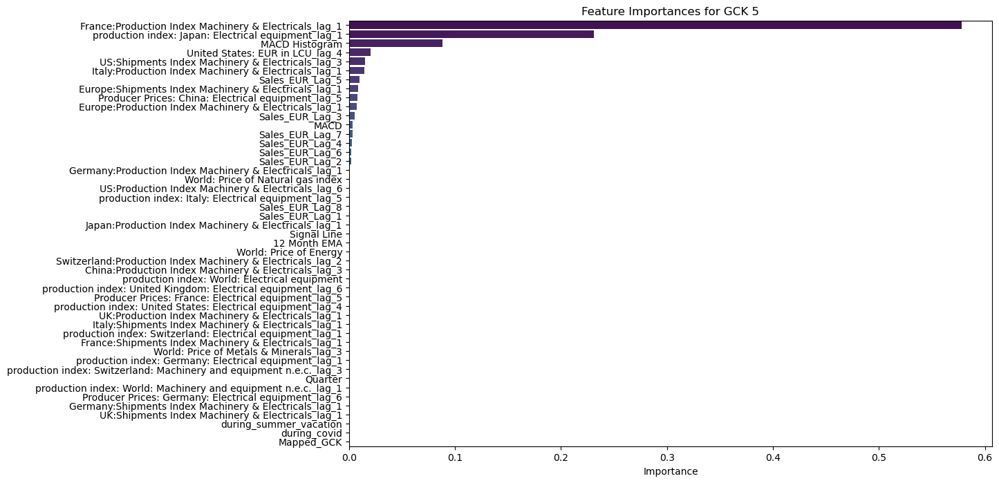

In [108]:
#Apply the XGBoost model to the GCK 5 data to see the feature importance based on RMSE
X_FI5 = df_gck5.drop('Sales_EUR', axis=1)
y_FI5 = df_gck5['Sales_EUR']

X_train_FI5, X_test_FI5, y_train_FI5, y_test_FI5 = train_test_split(X_FI5, y_FI5, test_size=0.2, random_state=42)

model_FI5 = XGBRegressor(objective='reg:squarederror', random_state=42)

model_FI5.fit(X_train_FI5, y_train_FI5)

y_pred_FI5 = model_FI5.predict(X_test_FI5)

rmse_FI5 = mean_squared_error(y_test_FI5, y_pred_FI5, squared=False)

# Get the feature importances
importances_FI5 = model_FI5.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI5 = pd.DataFrame(importances_FI5, index=X_FI5.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI5 = feature_importances_FI5.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI5['Importance'], y=feature_importances_FI5.index, palette='viridis')
plt.title('Feature Importances for GCK 5')
plt.show()

In [109]:
#Get a list of the features with importance greater than 0.01
important_features_FI5 = feature_importances_FI5[feature_importances_FI5['Importance'] > 0.01].index

important_features_FI5

Index(['France:Production Index Machinery & Electricals_lag_1',
       'production index: Japan: Electrical equipment_lag_1', 'MACD Histogram',
       'United States: EUR in LCU_lag_4',
       'US:Shipments Index Machinery & Electricals_lag_3',
       'Italy:Production Index Machinery & Electricals_lag_1'],
      dtype='object')

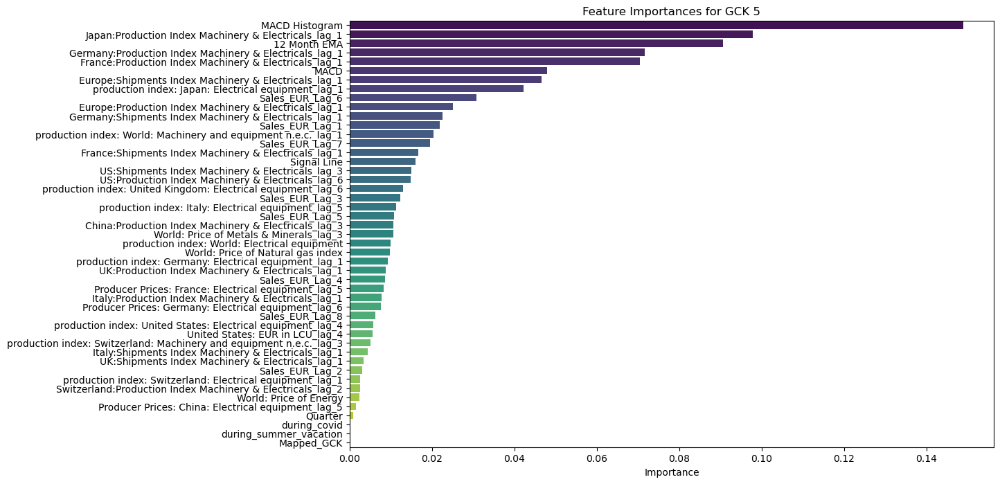

In [110]:
#Do the same with Random Forest model 
model_RF5 = RandomForestRegressor(random_state=42)

model_RF5.fit(X_train_FI5, y_train_FI5)

y_pred_RF5 = model_RF5.predict(X_test_FI5)
rmse_RF5 = mean_squared_error(y_test_FI5, y_pred_RF5, squared=False)

# Get the feature importances
importances_RF5 = model_RF5.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_RF5 = pd.DataFrame(importances_RF5, index=X_FI5.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_RF5 = feature_importances_RF5.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF5['Importance'], y=feature_importances_RF5.index, palette='viridis')
plt.title('Feature Importances for GCK 5')
plt.show()

In [111]:
#Get a list of the features with importance greater than 0.01
important_features_RF5 = feature_importances_RF5[feature_importances_RF5['Importance'] > 0.01].index

important_features_RF5

Index(['MACD Histogram',
       'Japan:Production Index Machinery & Electricals_lag_1', '12 Month EMA',
       'Germany:Production Index Machinery & Electricals_lag_1',
       'France:Production Index Machinery & Electricals_lag_1', 'MACD',
       'Europe:Shipments Index Machinery & Electricals_lag_1',
       'production index: Japan: Electrical equipment_lag_1',
       'Sales_EUR_Lag_6',
       'Europe:Production Index Machinery & Electricals_lag_1',
       'Germany:Shipments Index Machinery & Electricals_lag_1',
       'Sales_EUR_Lag_1',
       'production index: World: Machinery and equipment n.e.c._lag_1',
       'Sales_EUR_Lag_7',
       'France:Shipments Index Machinery & Electricals_lag_1', 'Signal Line',
       'US:Shipments Index Machinery & Electricals_lag_3',
       'US:Production Index Machinery & Electricals_lag_6',
       'production index: United Kingdom: Electrical equipment_lag_6',
       'Sales_EUR_Lag_3',
       'production index: Italy: Electrical equipment_lag_5',


In [112]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck5 = list(set(important_features_FI5).intersection(important_features_RF5))

important_features_gck5

['MACD Histogram',
 'France:Production Index Machinery & Electricals_lag_1',
 'US:Shipments Index Machinery & Electricals_lag_3',
 'production index: Japan: Electrical equipment_lag_1']

In [113]:
#Filter the df_gck5 DataFrame to only include the important features and the target variable
df_gck5_filtered = df_gck5[important_features_gck5 + ['Sales_EUR']]

In [114]:
#Make a df for the target variable and the features
y5 = df_gck5_filtered['Sales_EUR']
X5 = df_gck5_filtered.drop('Sales_EUR', axis=1)

#Scale the features with minmaxscaler

X5_scaled = scaler.fit_transform(X5)

#Split the data into train and test
X5_train, X5_test, y5_train, y5_test = train_test_split(X5_scaled, y5, test_size=0.2, random_state=42)


In [115]:
#Apply the XGBoost model to the GCK 5 data
model5 = XGBRegressor(objective='reg:squarederror', random_state=42)

model5.fit(X5_train, y5_train)

y5_pred = model5.predict(X5_test)

rmse5 = mean_squared_error(y5_test, y5_pred, squared=False)

rmse5

4069609.240652602

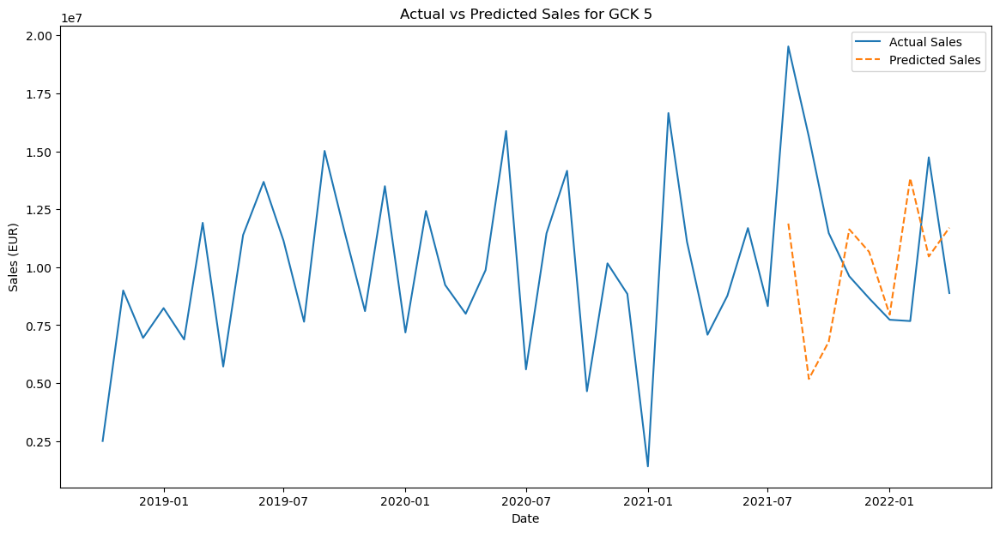

In [116]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck5.index, df_gck5['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck5.index[-len(y5_test):], y5_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 5')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [117]:
#Apply the Random Forest model to the GCK 5 data
model5_RF = RandomForestRegressor(random_state=42)

model5_RF.fit(X5_train, y5_train)

y5_pred_RF = model5_RF.predict(X5_test)

rmse5_RF = mean_squared_error(y5_test, y5_pred_RF, squared=False)

rmse5_RF

3801265.112127089

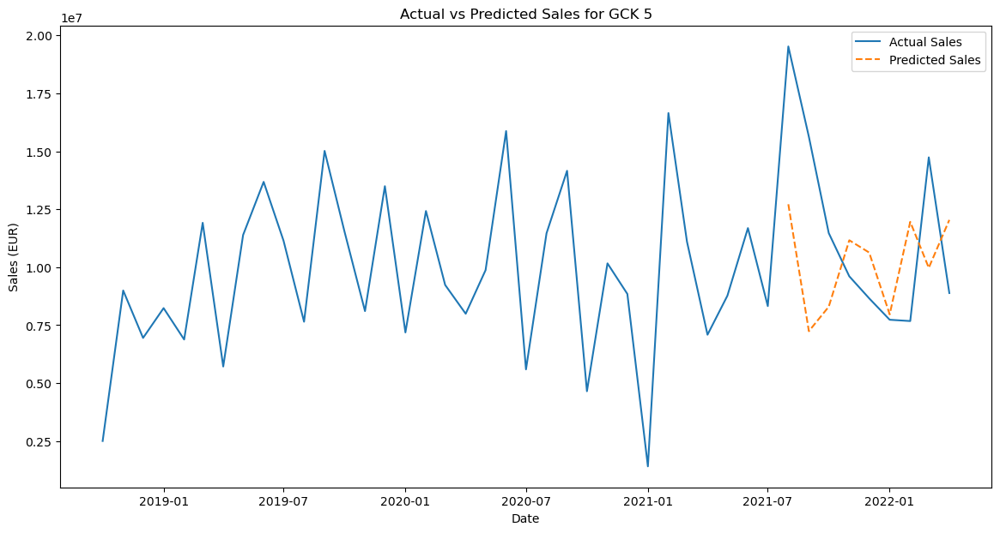

In [118]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck5.index, df_gck5['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck5.index[-len(y5_test):], y5_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 5')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [119]:
#Apply the SARIMA model to the GCK 4 data
model5_SARIMA = SARIMAX(y5, order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))

results = model5_SARIMA.fit()

#Get the predictions
start = len(y5_train)
end = len(y5_train) + len(y5_test) - 1

y5_pred_SARIMA = results.predict(start=start, end=end, typ='levels')

rmse5_SARIMA = mean_squared_error(y5_test, y5_pred_SARIMA, squared=False)

rmse5_SARIMA

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'


5273175.611209233

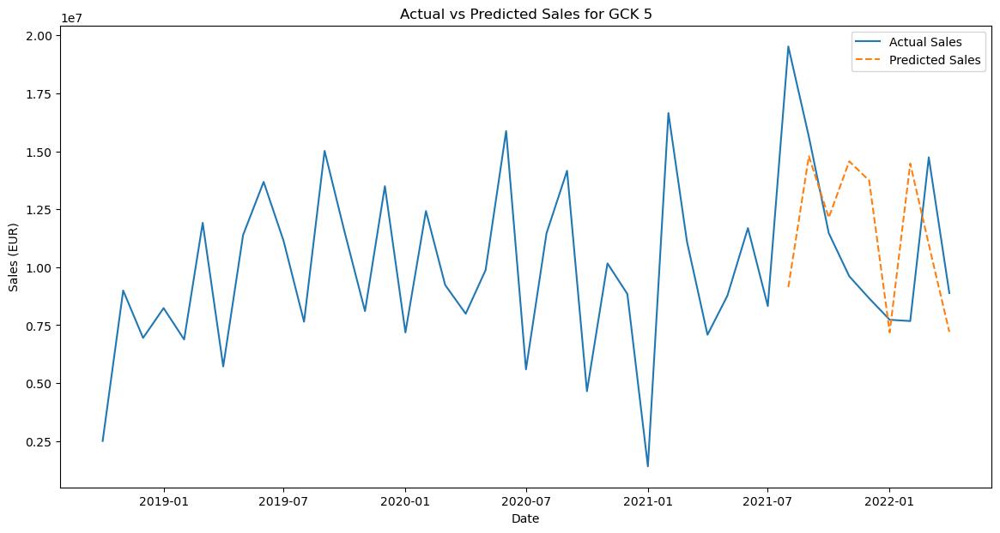

In [120]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck5.index, df_gck5['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck5.index[-len(y5_test):], y5_pred_SARIMA, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 5')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [121]:
#apply the a linear regression model to the GCK 5 data
model5_LR = LinearRegression()

model5_LR.fit(X5_train, y5_train)

y5_pred_LR = model5_LR.predict(X5_test)

rmse5_LR = mean_squared_error(y5_test, y5_pred_LR, squared=False)

rmse5_LR

2718332.0284502096

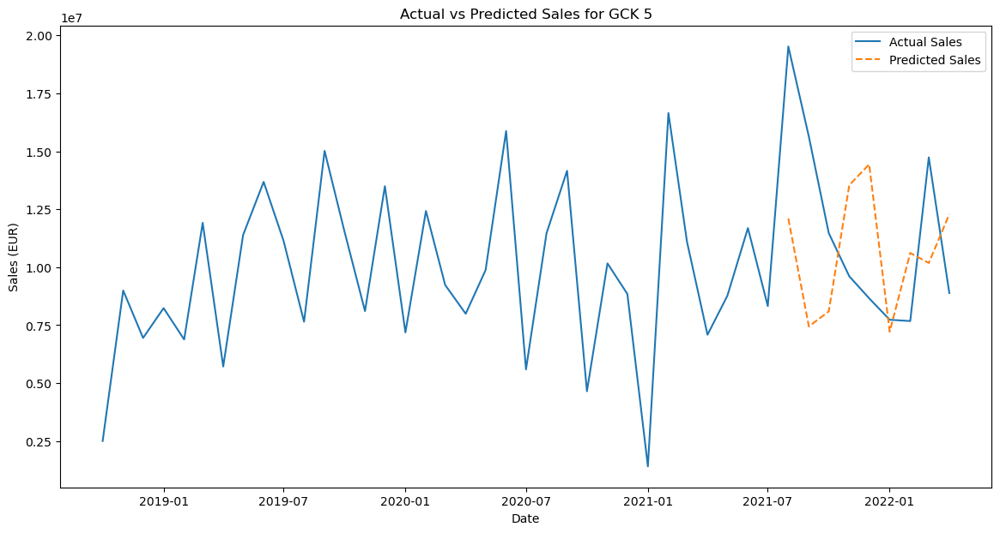

In [122]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck5.index, df_gck5['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck5.index[-len(y5_test):], y5_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 5')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [123]:
#make a knn model
model5_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model5_KNN.fit(X5_train, y5_train)

y5_pred_KNN = model5_KNN.predict(X5_test)

rmse5_KNN = mean_squared_error(y5_test, y5_pred_KNN, squared=False)

rmse5_KNN

4126459.600870322

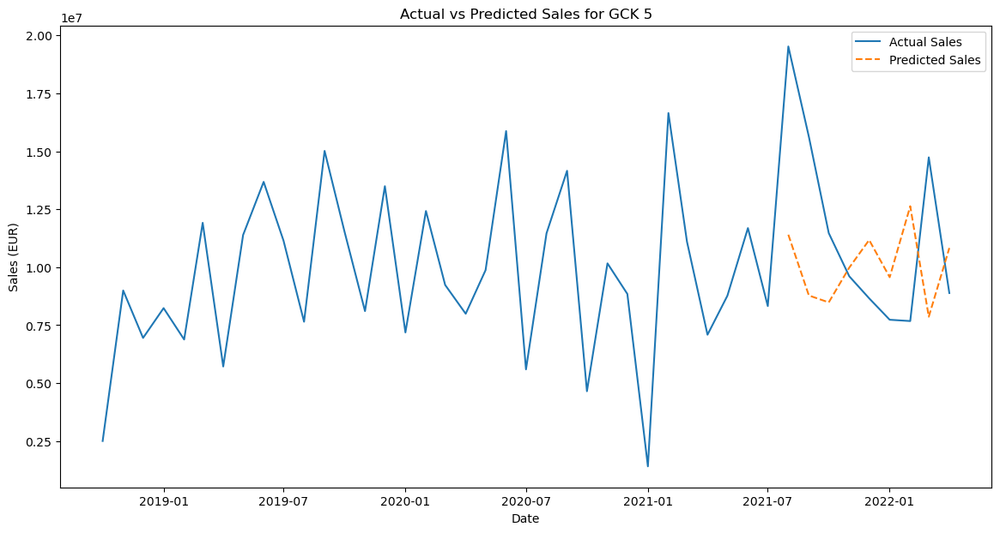

In [124]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck5.index, df_gck5['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck5.index[-len(y5_test):], y5_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 5')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [125]:
#Make an ensemble model that runs these 4 models and selects the best one
model5_ensemble = VotingRegressor(estimators=[
    ('xgb', model5),
    ('rf', model5_RF),
    ('lr', model5_LR),
    ('knn', model5_KNN)
])

model5_ensemble.fit(X5_train, y5_train)

y5_pred_ensemble = model5_ensemble.predict(X5_test)

rmse5_ensemble = mean_squared_error(y5_test, y5_pred_ensemble, squared=False)

rmse5_ensemble

3571334.430288729

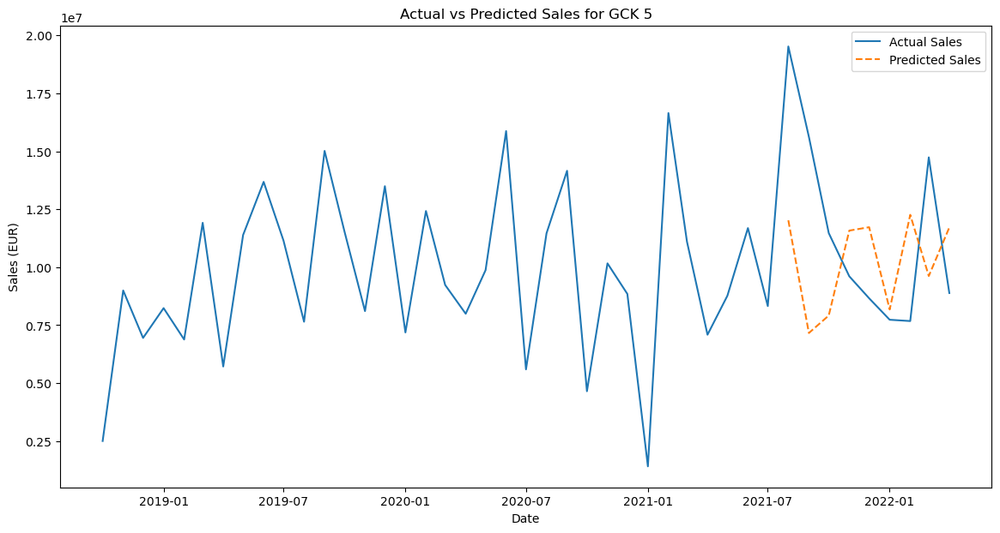

In [126]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck5.index, df_gck5['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck5.index[-len(y5_test):], y5_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 5')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [127]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'SARIMA', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse5, rmse5_RF, rmse5_SARIMA, rmse5_LR, rmse5_KNN, rmse5_ensemble]

rmse_table5 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table5

,Model,RMSE
0,XGBoost,4.069609e+06
1,Random Forest,3.801265e+06
2,SARIMA,5.273176e+06
3,Linear Regression,2.718332e+06
4,KNN,4.126460e+06
5,Ensemble,3.571334e+06


In [128]:
#Create a future DataFrame for the GCK 5 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df5 = pd.DataFrame(index=future_dates, columns=df_gck5_filtered.columns)

#Join the future DataFrame with the df_gck1_filtered DataFrame
final_df5 = pd.concat([df_gck5_filtered, future_df5])

final_df5

,MACD Histogram,France:Production Index Machinery & Electricals_lag_1,US:Shipments Index Machinery & Electricals_lag_3,production index: Japan: Electrical equipment_lag_1,Sales_EUR
2018-10-01,0.000000,97.630983,117.733911,114.521361,2499061.19
2018-11-01,64763.789103,108.280608,128.232758,112.376774,8993944.04
2018-12-01,24349.991458,99.636911,126.013347,111.907535,6947507.31
2019-01-01,37746.824255,94.690312,127.808839,112.524242,8233205.07
2019-02-01,-1127.431530,90.143775,117.675874,95.957352,6879250.99
2019-03-01,137293.959357,92.551521,123.280134,107.309956,11914313.63
2019-04-01,-20400.922819,107.861788,111.043755,131.450762,5714462.48
2019-05-01,103983.964068,98.677844,116.736921,101.308407,11389673.26
2019-06-01,247686.645889,94.779550,133.231664,101.892947,13681879.16
2019-07-01,205027.265730,98.978105,125.214414,112.251279,11145039.03


In [129]:
#Separate the target variable and the features from the final_df DataFrame
y_final5 = final_df5['Sales_EUR']
X_final5 = final_df5.drop('Sales_EUR', axis=1)

In [130]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final5.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df5[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [131]:
#Split the target and features
y5_final = final_df5['Sales_EUR']
X5_final = final_df5.drop('Sales_EUR', axis=1)

#Train test split
X5_final_train = X5_final.loc['2018-01-01':'2022-04-01']
y5_final_train = y5_final.loc['2018-01-01':'2022-04-01']
X5_final_test = X5_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X5_final5_train_scaled = scaler.fit_transform(X5_final_train)

X5_final5_test_scaled = scaler.transform(X5_final_test)

#Apply the Lr model to the final data

model5_LR.fit(X5_final5_train_scaled, y5_final_train)

y5_final_pred = model5_LR.predict(X5_final5_test_scaled)

y5_final_pred

array([ 9449834.53401832, 12202731.40898383,  8221505.44875267,
       10997777.11470748, 15932764.65528836, 10030513.5794162 ,
        9155456.94837999,  8825384.93519576,  5921270.55690014,
        8813357.54338582])

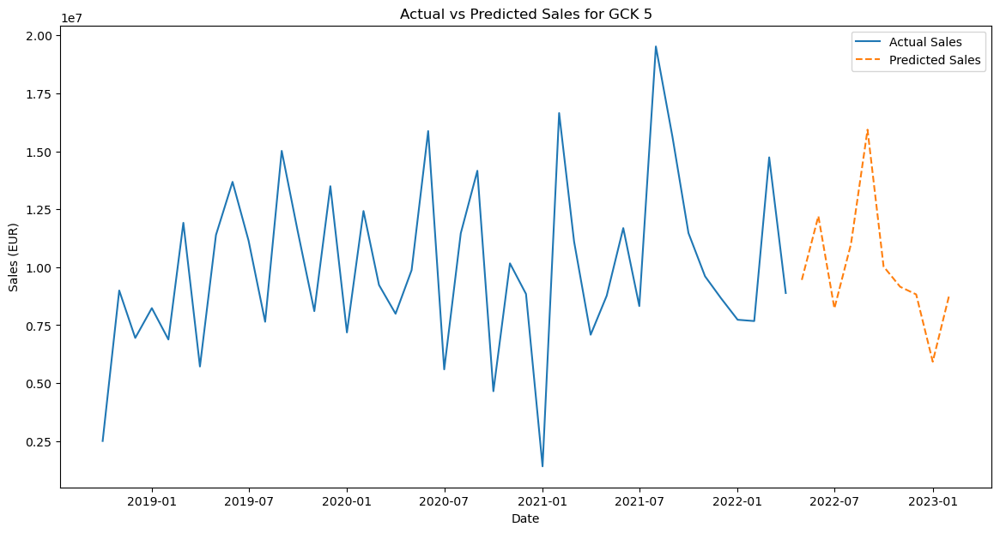

In [132]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df5.index, final_df5['Sales_EUR'], label='Actual Sales')
plt.plot(final_df5.index[-len(y5_final_pred):], y5_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 5')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


# GCK 6

In [133]:
#Set Date to datetime
df_gck6['Date'] = pd.to_datetime(df_gck6['Date'])
df_gck6.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\681798164.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck6['Date'] = pd.to_datetime(df_gck6['Date'])


In [134]:
#Check the correlation of the features with the target
correlation = df_gck6.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                1.000000
MACD Histogram                                           0.773432
MACD                                                     0.671558
12 Month EMA                                             0.597947
26 Month EMA                                             0.496247
                                                           ...   
production index: United States: Electrical equipment   -0.323847
France:Shipments Index Machinery & Electricals_lag_1    -0.360103
Europe:Shipments Index Machinery & Electricals_lag_1    -0.386968
Italy:Shipments Index Machinery & Electricals_lag_1     -0.430657
Mapped_GCK                                                    NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [135]:
#Code generated with chatgpt

# Compute the correlation of each feature with the target variable
correlation_with_target = {}
for feature in market_features:
    correlation_with_target[feature] = df_gck6[feature].corr(df_gck6['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_1', 'France:Production Index Machinery & Electricals_lag_5', 'France:Shipments Index Machinery & Electricals_lag_1', 'Germany:Production Index Machinery & Electricals_lag_5', 'Germany:Shipments Index Machinery & Electricals_lag_1', 'Italy:Production Index Machinery & Electricals_lag_5', 'Italy:Shipments Index Machinery & Electricals_lag_1', 'Japan:Production Index Machinery & Electricals_lag_5', 'Switzerland:Production Index Machinery & Electricals_lag_6', 'UK:Production Index Machinery & Electricals_lag_5', 'UK:Shipments Index Machinery & Electricals', 'US:Production Index Machinery & Electricals', 'US:Shipments Index Machinery & Electricals_lag_1', 'Europe:Production Index Machinery & Electricals_lag_1', 'Europe:Shipments Index Machinery & Electricals_lag_1', 'World: Price of Energy', 'World: Price of Metals & Minerals', 'World: Price of Natural gas index_lag_1', 'United States: EUR in LCU_lag_1', 'Producer Price

In [136]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck6 = df_gck6.drop(features_to_remove, axis=1)

In [137]:
# Create a list with the pairs features that are highly correlated (0.95) in df_gck6
correlated_features = set()
correlation_matrix = df_gck6.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)
            

correlated_features

{'26 Month EMA',
 'Producer Prices: Germany: Electrical equipment_lag_3',
 'production index: Italy: Electrical equipment_lag_5',
 'production index: Japan: Electrical equipment_lag_5'}

In [138]:
to_drop = ['26 Month EMA',
 'Producer Prices: Germany: Electrical equipment_lag_3',
 'production index: Italy: Electrical equipment_lag_5',
 'production index: Japan: Electrical equipment_lag_5']

df_gck6 = df_gck6.drop(to_drop, axis=1)


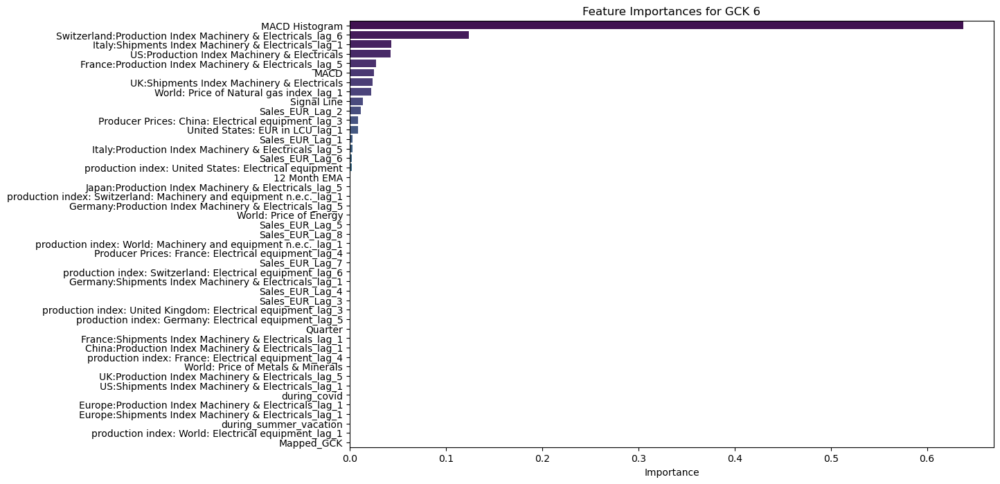

In [139]:
# Apply the XGBoost model to the GCK 6 data to see the feature importance based on RMSE
X_FI6 = df_gck6.drop('Sales_EUR', axis=1)
y_FI6 = df_gck6['Sales_EUR']

X_train_FI6, X_test_FI6, y_train_FI6, y_test_FI6 = train_test_split(X_FI6, y_FI6, test_size=0.2, random_state=42)

model_FI6 = XGBRegressor(objective='reg:squarederror', random_state=42)

model_FI6.fit(X_train_FI6, y_train_FI6)

y_pred_FI6 = model_FI6.predict(X_test_FI6)

rmse_FI6 = mean_squared_error(y_test_FI6, y_pred_FI6, squared=False)

# Get the feature importances
importances_FI6 = model_FI6.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI6 = pd.DataFrame(importances_FI6, index=X_FI6.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI6 = feature_importances_FI6.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI6['Importance'], y=feature_importances_FI6.index, palette='viridis')
plt.title('Feature Importances for GCK 6')
plt.show()

In [140]:
# Get a list of the features with importance greater than 0.01
important_features_FI6 = feature_importances_FI6[feature_importances_FI6['Importance'] > 0.01].index

important_features_FI6

Index(['MACD Histogram',
       'Switzerland:Production Index Machinery & Electricals_lag_6',
       'Italy:Shipments Index Machinery & Electricals_lag_1',
       'US:Production Index Machinery & Electricals',
       'France:Production Index Machinery & Electricals_lag_5', 'MACD',
       'UK:Shipments Index Machinery & Electricals',
       'World: Price of Natural gas index_lag_1', 'Signal Line',
       'Sales_EUR_Lag_2'],
      dtype='object')

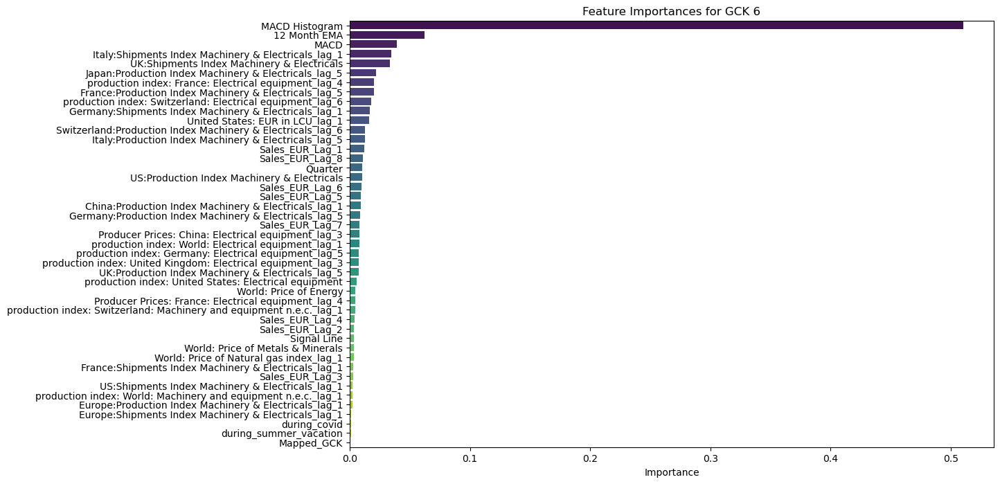

In [141]:
# Do the same with Random Forest model
model_RF6 = RandomForestRegressor(random_state=42)

model_RF6.fit(X_train_FI6, y_train_FI6)

y_pred_RF6 = model_RF6.predict(X_test_FI6)
rmse_RF6 = mean_squared_error(y_test_FI6, y_pred_RF6, squared=False)

# Get the feature importances
importances_RF6 = model_RF6.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_RF6 = pd.DataFrame(importances_RF6, index=X_FI6.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_RF6 = feature_importances_RF6.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF6['Importance'], y=feature_importances_RF6.index, palette='viridis')
plt.title('Feature Importances for GCK 6')
plt.show()

In [142]:
#Get a list of the features with importance greater than 0.01
important_features_RF6 = feature_importances_RF6[feature_importances_RF6['Importance'] > 0.01].index

important_features_RF6

Index(['MACD Histogram', '12 Month EMA', 'MACD',
       'Italy:Shipments Index Machinery & Electricals_lag_1',
       'UK:Shipments Index Machinery & Electricals',
       'Japan:Production Index Machinery & Electricals_lag_5',
       'production index: France: Electrical equipment_lag_4',
       'France:Production Index Machinery & Electricals_lag_5',
       'production index: Switzerland: Electrical equipment_lag_6',
       'Germany:Shipments Index Machinery & Electricals_lag_1',
       'United States: EUR in LCU_lag_1',
       'Switzerland:Production Index Machinery & Electricals_lag_6',
       'Italy:Production Index Machinery & Electricals_lag_5',
       'Sales_EUR_Lag_1', 'Sales_EUR_Lag_8', 'Quarter',
       'US:Production Index Machinery & Electricals'],
      dtype='object')

In [143]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck6 = list(set(important_features_FI6).intersection(important_features_RF6))

important_features_gck6

['MACD Histogram',
 'Italy:Shipments Index Machinery & Electricals_lag_1',
 'US:Production Index Machinery & Electricals',
 'UK:Shipments Index Machinery & Electricals',
 'Switzerland:Production Index Machinery & Electricals_lag_6',
 'MACD',
 'France:Production Index Machinery & Electricals_lag_5']

In [144]:
#Filter the df_gck6 DataFrame to only include the important features and the target variable
df_gck6_filtered = df_gck6[important_features_gck6 + ['Sales_EUR']]

In [145]:
#Make a df for the target variable and the features
y6 = df_gck6_filtered['Sales_EUR']
X6 = df_gck6_filtered.drop('Sales_EUR', axis=1)

#Scale the features with minmaxscaler
X6_scaled = scaler.fit_transform(X6)

#Split the data into train and test
X6_train, X6_test, y6_train, y6_test = train_test_split(X6_scaled, y6, test_size=0.2, random_state=42)


In [146]:
#Apply the XGBoost model to the GCK 6 data
model6 = XGBRegressor(objective='reg:squarederror', random_state=42)

model6.fit(X6_train, y6_train)

y6_pred = model6.predict(X6_test)

rmse6 = mean_squared_error(y6_test, y6_pred, squared=False)

rmse6

163763.83931989942

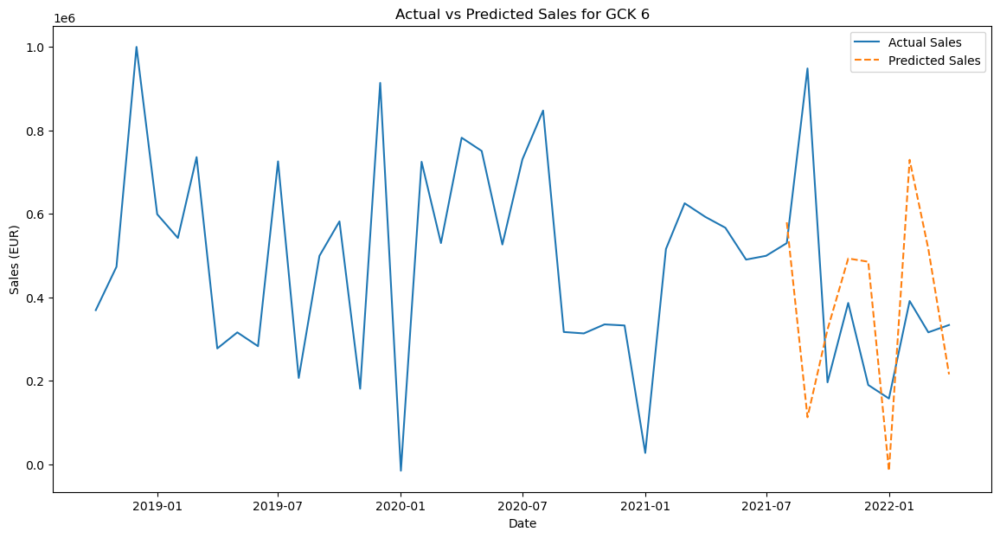

In [147]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck6.index, df_gck6['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck6.index[-len(y6_test):], y6_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 6')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


In [148]:
#Apply the Random Forest model to the GCK 6 data
model6_RF = RandomForestRegressor(random_state=42)

model6_RF.fit(X6_train, y6_train)

y6_pred_RF = model6_RF.predict(X6_test)

rmse6_RF = mean_squared_error(y6_test, y6_pred_RF, squared=False)

rmse6_RF

113122.56675025512

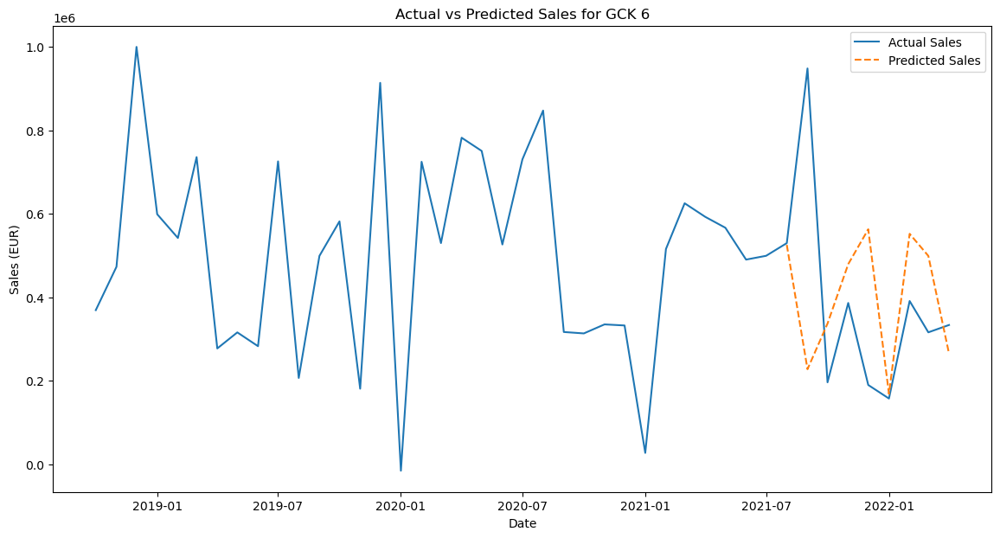

In [149]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck6.index, df_gck6['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck6.index[-len(y6_test):], y6_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 6')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [150]:
#apply the a linear regression model to the GCK 6 data
model6_LR = LinearRegression()

model6_LR.fit(X6_train, y6_train)

y6_pred_LR = model6_LR.predict(X6_test)

rmse6_LR = mean_squared_error(y6_test, y6_pred_LR, squared=False)

rmse6_LR

187980.3870006846

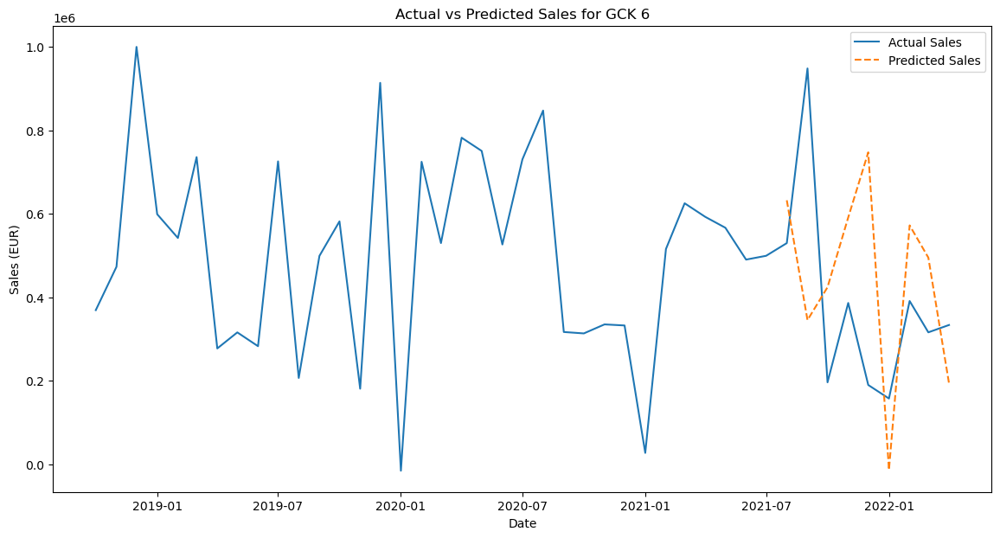

In [151]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck6.index, df_gck6['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck6.index[-len(y6_test):], y6_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 6')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [152]:
#make a knn model
model6_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model6_KNN.fit(X6_train, y6_train)

y6_pred_KNN = model6_KNN.predict(X6_test)

rmse6_KNN = mean_squared_error(y6_test, y6_pred_KNN, squared=False)

rmse6_KNN

135426.5788045505

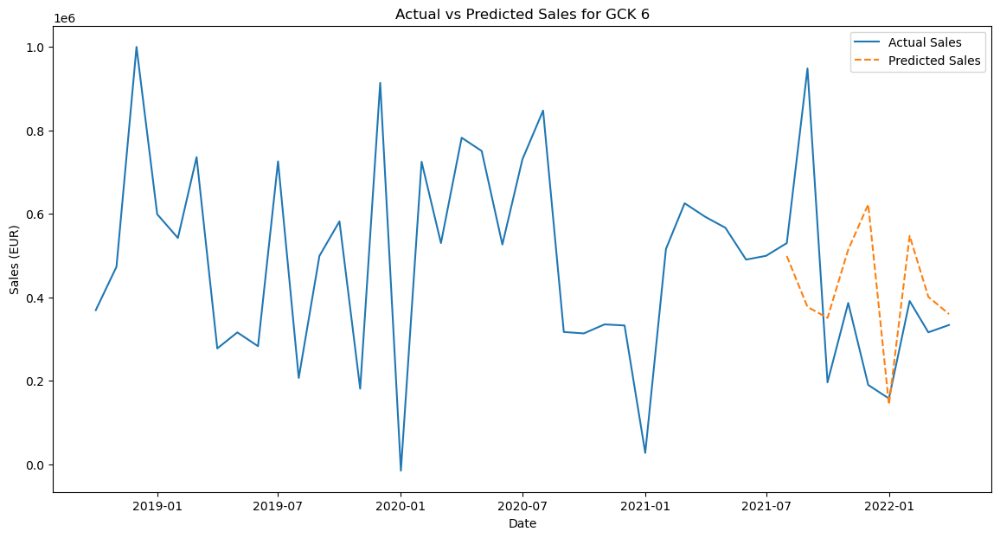

In [153]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck6.index, df_gck6['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck6.index[-len(y6_test):], y6_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 6')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [154]:
#Make an ensemble model that runs these 4 models and selects the best one
model6_ensemble = VotingRegressor(estimators=[
    ('xgb', model6),
    ('rf', model6_RF),
    ('lr', model6_LR),
    ('knn', model6_KNN)
])

model6_ensemble.fit(X6_train, y6_train)

y6_pred_ensemble = model6_ensemble.predict(X6_test)

rmse6_ensemble = mean_squared_error(y6_test, y6_pred_ensemble, squared=False)

rmse6_ensemble

135311.76606974742

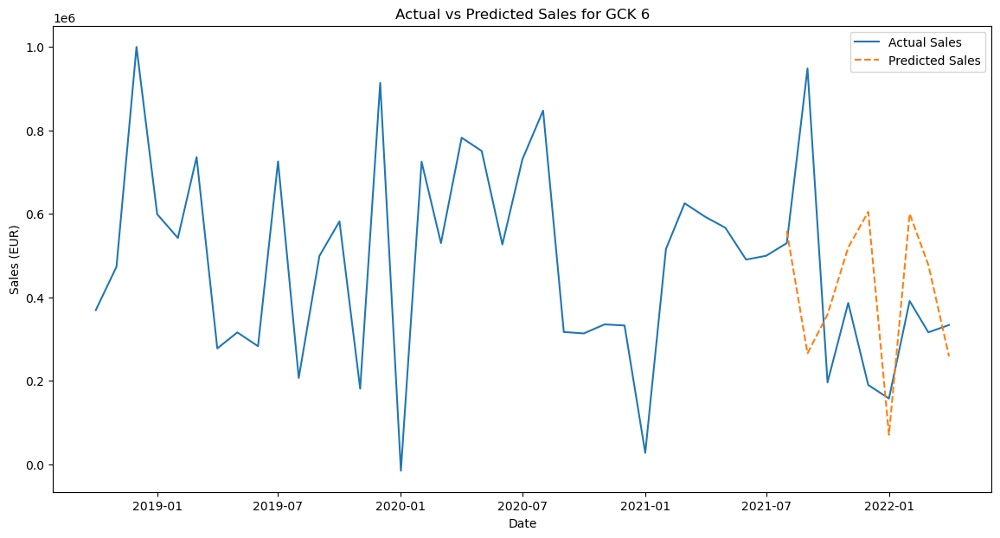

In [155]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck6.index, df_gck6['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck6.index[-len(y6_test):], y6_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 6')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [156]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse6, rmse6_RF, rmse6_LR, rmse6_KNN, rmse6_ensemble]

rmse_table6 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table6

,Model,RMSE
0,XGBoost,163763.839320
1,Random Forest,113122.566750
2,Linear Regression,187980.387001
3,KNN,135426.578805
4,Ensemble,135311.766070


In [157]:
#Create a future DataFrame for the GCK 6 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df6 = pd.DataFrame(index=future_dates, columns=df_gck6_filtered.columns)

#Join the future DataFrame with the df_gck1_filtered DataFrame
final_df6 = pd.concat([df_gck6_filtered, future_df6])

final_df6

,MACD Histogram,Italy:Shipments Index Machinery & Electricals_lag_1,US:Production Index Machinery & Electricals,UK:Shipments Index Machinery & Electricals,Switzerland:Production Index Machinery & Electricals_lag_6,MACD,France:Production Index Machinery & Electricals_lag_5,Sales_EUR
2018-10-01,0.000000,115.289962,111.902540,112.318030,98.442835,0.000000,88.478162,369231.60
2018-11-01,1035.195897,122.456894,110.880401,112.801011,98.075490,2329.190769,109.749147,473046.96
2018-12-01,10621.939792,120.132032,106.257796,94.503733,97.708145,19292.281741,100.834345,999472.69
2019-01-01,2248.781860,131.936099,107.510808,99.659210,100.443454,12071.163697,68.229708,598874.10
2019-02-01,-2944.168543,92.418842,109.817608,100.589459,103.178762,5631.529459,97.630983,542037.52
2019-03-01,988.382847,103.214212,111.664057,118.184131,105.914071,9931.607789,108.280608,735604.23
2019-04-01,-12828.087771,122.454318,109.276379,103.934375,109.077781,-8231.269096,99.636911,277575.12
2019-05-01,-17509.159681,106.279804,110.063707,106.899415,112.241491,-18451.217523,94.690312,315978.77
2019-06-01,-19950.470278,123.261639,111.717569,108.958677,115.405201,-26885.619591,90.143775,282963.19
2019-07-01,-2135.552171,121.312004,103.461891,107.342877,109.621788,-9687.355416,92.551521,725411.99


In [158]:
#Separate the target variable and the features from the final_df DataFrame
y_final6 = final_df6['Sales_EUR']
X_final6 = final_df6.drop('Sales_EUR', axis=1)

In [159]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final6.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df6[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [160]:
#Split the target and features
y6_final = final_df6['Sales_EUR']
X6_final = final_df6.drop('Sales_EUR', axis=1)

#Train test split
X6_final_train = X6_final.loc['2018-01-01':'2022-04-01']
y6_final_train = y6_final.loc['2018-01-01':'2022-04-01']
X6_final_test = X6_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X6_final6_train_scaled = scaler.fit_transform(X6_final_train)

X6_final6_test_scaled = scaler.transform(X6_final_test)

#Apply the Rf model to the final data

model6_RF.fit(X6_final6_train_scaled, y6_final_train)

y6_final_pred = model6_RF.predict(X6_final6_test_scaled)

y6_final_pred

array([271440.6307, 269992.1662, 270045.5374, 253056.0374, 301725.0996,
       213046.9152, 239378.713 , 245210.1993, 132966.8749, 230532.9097])

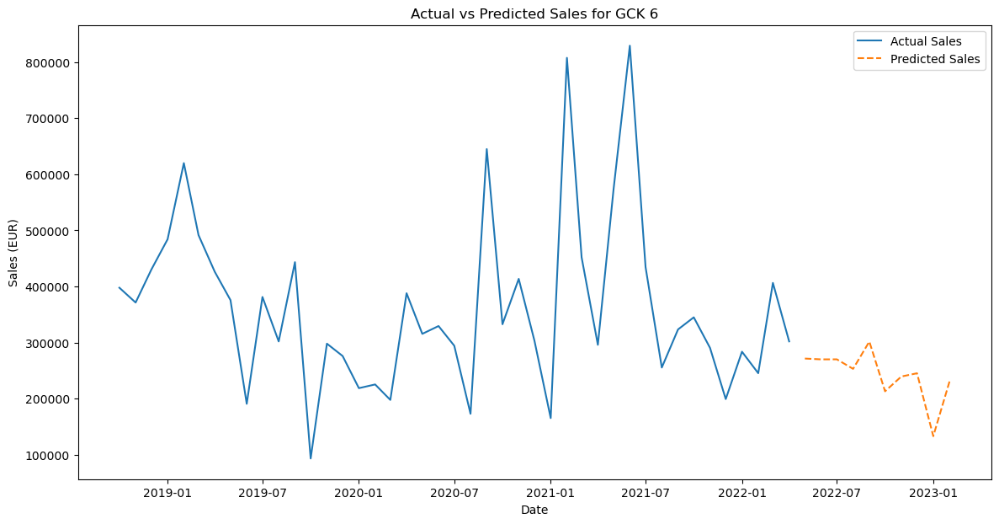

In [161]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df6.index, final_df4['Sales_EUR'], label='Actual Sales')
plt.plot(final_df6.index[-len(y6_final_pred):], y6_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 6')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 8

In [162]:
df_gck8


,Date,Mapped_GCK,Sales_EUR,Sales_EUR_Lag_1,Sales_EUR_Lag_2,Sales_EUR_Lag_3,Sales_EUR_Lag_4,Sales_EUR_Lag_5,Sales_EUR_Lag_6,Sales_EUR_Lag_7,...,production index: France: Electrical equipment_lag_3,production index: France: Electrical equipment_lag_4,production index: France: Electrical equipment_lag_5,production index: France: Electrical equipment_lag_6,production index: Germany: Electrical equipment_lag_1,production index: Germany: Electrical equipment_lag_2,production index: Germany: Electrical equipment_lag_3,production index: Germany: Electrical equipment_lag_4,production index: Germany: Electrical equipment_lag_5,production index: Germany: Electrical equipment_lag_6
5,2018-10-01,8,586052.74,586052.74,586052.74,586052.74,586052.74,586052.74,586052.74,586052.74,...,86.400002,95.119263,81.820183,83.933945,110.872368,111.284912,111.181778,116.751183,106.746880,108.706490
19,2018-11-01,8,526292.77,586052.74,586052.74,586052.74,586052.74,586052.74,586052.74,586052.74,...,64.293579,86.400002,95.119263,81.820183,118.298233,110.872368,111.284912,111.181778,116.751183,106.746880
33,2018-12-01,8,271490.71,526292.77,586052.74,586052.74,586052.74,586052.74,586052.74,586052.74,...,85.078896,64.293579,86.400002,95.119263,117.163727,118.298233,110.872368,111.284912,111.181778,116.751183
47,2019-01-01,8,381400.15,271490.71,526292.77,586052.74,586052.74,586052.74,586052.74,586052.74,...,97.849541,85.078896,64.293579,86.400002,89.626122,117.163727,118.298233,110.872368,111.284912,111.181778
61,2019-02-01,8,368475.57,381400.15,271490.71,526292.77,586052.74,586052.74,586052.74,586052.74,...,91.155960,97.849541,85.078896,64.293579,105.406097,89.626122,117.163727,118.298233,110.872368,111.284912
75,2019-03-01,8,591288.36,368475.57,381400.15,271490.71,526292.77,586052.74,586052.74,586052.74,...,78.033028,91.155960,97.849541,85.078896,103.652771,105.406097,89.626122,117.163727,118.298233,110.872368
89,2019-04-01,8,418899.90,591288.36,368475.57,381400.15,271490.71,526292.77,586052.74,586052.74,...,81.908257,78.033028,91.155960,97.849541,111.388054,103.652771,105.406097,89.626122,117.163727,118.298233
103,2019-05-01,8,298806.84,418899.90,591288.36,368475.57,381400.15,271490.71,526292.77,586052.74,...,80.322929,81.908257,78.033028,91.155960,102.518265,111.388054,103.652771,105.406097,89.626122,117.163727
117,2019-06-01,8,420707.73,298806.84,418899.90,591288.36,368475.57,381400.15,271490.71,526292.77,...,92.477066,80.322929,81.908257,78.033028,107.468842,102.518265,111.388054,103.652771,105.406097,89.626122
131,2019-07-01,8,366980.26,420707.73,298806.84,418899.90,591288.36,368475.57,381400.15,271490.71,...,85.519257,92.477066,80.322929,81.908257,95.814354,107.468842,102.518265,111.388054,103.652771,105.406097


In [163]:
#Set Date to datetime
df_gck8['Date'] = pd.to_datetime(df_gck8['Date'])
df_gck8.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\3058495166.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck8['Date'] = pd.to_datetime(df_gck8['Date'])


In [164]:
#Check the correlation of the features with the target
correlation = df_gck8.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                              1.000000
MACD Histogram                                                         0.914127
MACD                                                                   0.841218
12 Month EMA                                                           0.783933
26 Month EMA                                                           0.757956
                                                                         ...   
production index: Switzerland: Machinery and equipment n.e.c._lag_5   -0.318232
production index: Japan: Electrical equipment_lag_4                   -0.343140
Switzerland:Production Index Machinery & Electricals_lag_6            -0.366766
production index: Switzerland: Machinery and equipment n.e.c._lag_6   -0.387410
Mapped_GCK                                                                  NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [165]:
#Code generated with chatgpt

# Compute the correlation of each feature with the target variable
correlation_with_target = {}
for feature in market_features:
    correlation_with_target[feature] = df_gck8[feature].corr(df_gck8['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_3', 'France:Production Index Machinery & Electricals_lag_4', 'France:Shipments Index Machinery & Electricals', 'Germany:Production Index Machinery & Electricals_lag_4', 'Germany:Shipments Index Machinery & Electricals', 'Italy:Production Index Machinery & Electricals_lag_2', 'Italy:Shipments Index Machinery & Electricals', 'Japan:Production Index Machinery & Electricals', 'Switzerland:Production Index Machinery & Electricals_lag_6', 'UK:Production Index Machinery & Electricals_lag_4', 'UK:Shipments Index Machinery & Electricals_lag_4', 'US:Production Index Machinery & Electricals_lag_1', 'US:Shipments Index Machinery & Electricals', 'Europe:Production Index Machinery & Electricals', 'Europe:Shipments Index Machinery & Electricals', 'World: Price of Energy', 'World: Price of Metals & Minerals_lag_2', 'World: Price of Natural gas index', 'United States: EUR in LCU_lag_6', 'Producer Prices: France: Electrical equipmen

In [166]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck8 = df_gck8.drop(features_to_remove, axis=1)

In [167]:
# Create a list with the pairs features that are highly correlated (0.95) in df_gck8
correlated_features = set()
correlation_matrix = df_gck8.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features




{'26 Month EMA',
 'MACD',
 'Producer Prices: Germany: Electrical equipment_lag_4',
 'Signal Line',
 'production index: France: Electrical equipment_lag_4',
 'production index: Italy: Electrical equipment_lag_2'}

In [168]:
to_drop = ['26 Month EMA',
 'MACD','Signal Line',
 'Producer Prices: Germany: Electrical equipment_lag_4',
 'production index: France: Electrical equipment_lag_4',
 'production index: Italy: Electrical equipment_lag_2']

df_gck8 = df_gck8.drop(to_drop, axis=1)

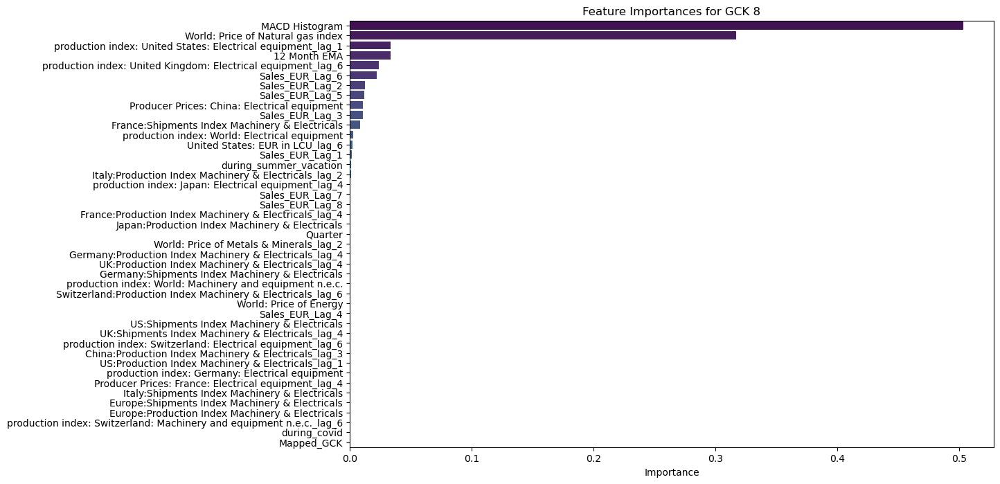

In [169]:
# Apply the XGBoost model to the GCK 8 data to see the feature importance based on RMSE
X_FI8 = df_gck8.drop('Sales_EUR', axis=1)
y_FI8 = df_gck8['Sales_EUR']

X_train_FI8, X_test_FI8, y_train_FI8, y_test_FI8 = train_test_split(X_FI8, y_FI8, test_size=0.2, random_state=42)

model_FI8 = XGBRegressor(objective='reg:squarederror', random_state=42)

model_FI8.fit(X_train_FI8, y_train_FI8)

y_pred_FI8 = model_FI8.predict(X_test_FI8)

rmse_FI8 = mean_squared_error(y_test_FI8, y_pred_FI8, squared=False)

# Get the feature importances
importances_FI8 = model_FI8.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI8 = pd.DataFrame(importances_FI8, index=X_FI8.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI8 = feature_importances_FI8.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI8['Importance'], y=feature_importances_FI8.index, palette='viridis')

plt.title('Feature Importances for GCK 8')
plt.show()

In [170]:
# Get a list of the features with importance greater than 0.01
important_features_FI8 = feature_importances_FI8[feature_importances_FI8['Importance'] > 0.01].index

important_features_FI8

Index(['MACD Histogram', 'World: Price of Natural gas index',
       'production index: United States: Electrical equipment_lag_1',
       '12 Month EMA',
       'production index: United Kingdom: Electrical equipment_lag_6',
       'Sales_EUR_Lag_6', 'Sales_EUR_Lag_2', 'Sales_EUR_Lag_5',
       'Producer Prices: China: Electrical equipment', 'Sales_EUR_Lag_3'],
      dtype='object')

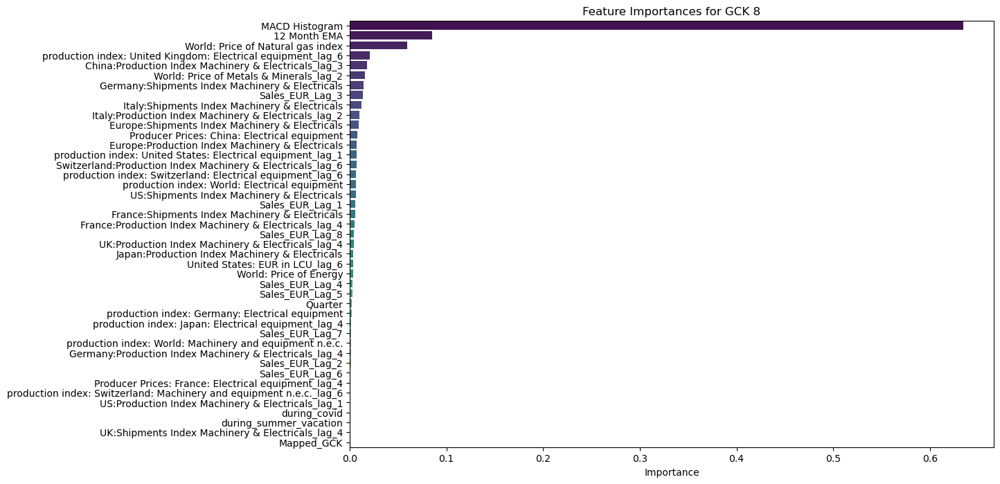

In [171]:
# Do the same with Random Forest model

model_RF8 = RandomForestRegressor(random_state=42)

model_RF8.fit(X_train_FI8, y_train_FI8)

y_pred_RF8 = model_RF8.predict(X_test_FI8)

rmse_RF8 = mean_squared_error(y_test_FI8, y_pred_RF8, squared=False)

# Get the feature importances

importances_RF8 = model_RF8.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_RF8 = pd.DataFrame(importances_RF8, index=X_FI8.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_RF8 = feature_importances_RF8.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF8['Importance'], y=feature_importances_RF8.index, palette='viridis')
plt.title('Feature Importances for GCK 8')
plt.show()

In [172]:
# Get a list of the features with importance greater than 0.01
important_features_RF8 = feature_importances_RF8[feature_importances_RF8['Importance'] > 0.01].index

important_features_RF8

Index(['MACD Histogram', '12 Month EMA', 'World: Price of Natural gas index',
       'production index: United Kingdom: Electrical equipment_lag_6',
       'China:Production Index Machinery & Electricals_lag_3',
       'World: Price of Metals & Minerals_lag_2',
       'Germany:Shipments Index Machinery & Electricals', 'Sales_EUR_Lag_3',
       'Italy:Shipments Index Machinery & Electricals'],
      dtype='object')

In [173]:
# Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck8 = list(set(important_features_FI8).intersection(important_features_RF8))

important_features_gck8

['MACD Histogram',
 'World: Price of Natural gas index',
 '12 Month EMA',
 'production index: United Kingdom: Electrical equipment_lag_6',
 'Sales_EUR_Lag_3']

In [174]:
# Filter the df_gck8 DataFrame to only include the important features and the target variable
df_gck8_filtered = df_gck8[important_features_gck8 + ['Sales_EUR']]
df_gck8_filtered

,MACD Histogram,World: Price of Natural gas index,12 Month EMA,production index: United Kingdom: Electrical equipment_lag_6,Sales_EUR_Lag_3,Sales_EUR
Date,,,,,,
2018-10-01,0.000000,89.570796,5.860527e+05,99.391278,586052.74,586052.74
2018-11-01,-595.897137,97.362468,5.536828e+05,102.504740,586052.74,526292.77
2018-12-01,-5231.762251,94.406578,4.435431e+05,105.139208,586052.74,271490.71
2019-01-01,-3166.664007,80.055366,4.239270e+05,103.462728,586052.74,381400.15
2019-02-01,-2281.334539,69.545042,4.088611e+05,105.737950,526292.77,368475.57
2019-03-01,5373.482651,67.912111,4.532005e+05,110.288394,271490.71,591288.36
2019-04-01,2799.131403,62.486066,4.455464e+05,118.670791,381400.15,418899.90
2019-05-01,-3025.882174,59.422335,4.149241e+05,120.467019,368475.57,298806.84
2019-06-01,-1194.043068,52.962529,4.160683e+05,105.378705,591288.36,420707.73


In [175]:
# Make a df for the target variable and the features
y8 = df_gck8_filtered['Sales_EUR']
X8 = df_gck8_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X8_scaled = scaler.fit_transform(X8)

# Split the data into train and test

X8_train, X8_test, y8_train, y8_test = train_test_split(X8_scaled, y8, test_size=0.2, random_state=42)

In [176]:
# Apply the XGBoost model to the GCK 8 data
model8 = XGBRegressor(objective='reg:squarederror')

model8.fit(X8_train, y8_train)

y8_pred = model8.predict(X8_test)

rmse8 = mean_squared_error(y8_test, y8_pred, squared=False)

rmse8

377585.0953164728

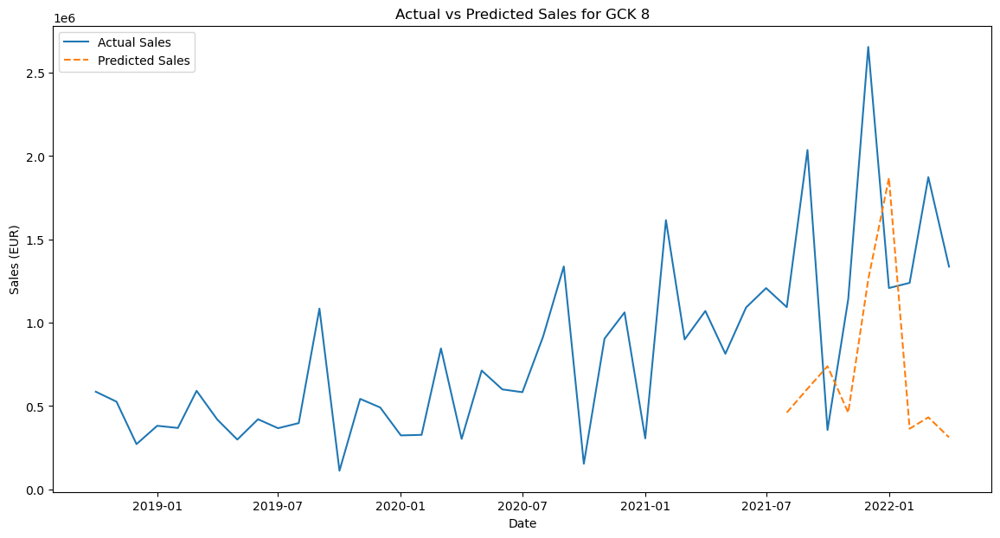

In [177]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck8.index, df_gck8['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck8.index[-len(y8_test):], y8_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 8')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [178]:
#apply the Random Forest model to the GCK 8 data
model8_RF = RandomForestRegressor()

model8_RF.fit(X8_train, y8_train)

y8_pred_RF = model8_RF.predict(X8_test)

rmse8_RF = mean_squared_error(y8_test, y8_pred_RF, squared=False)

rmse8_RF

303534.0264578794

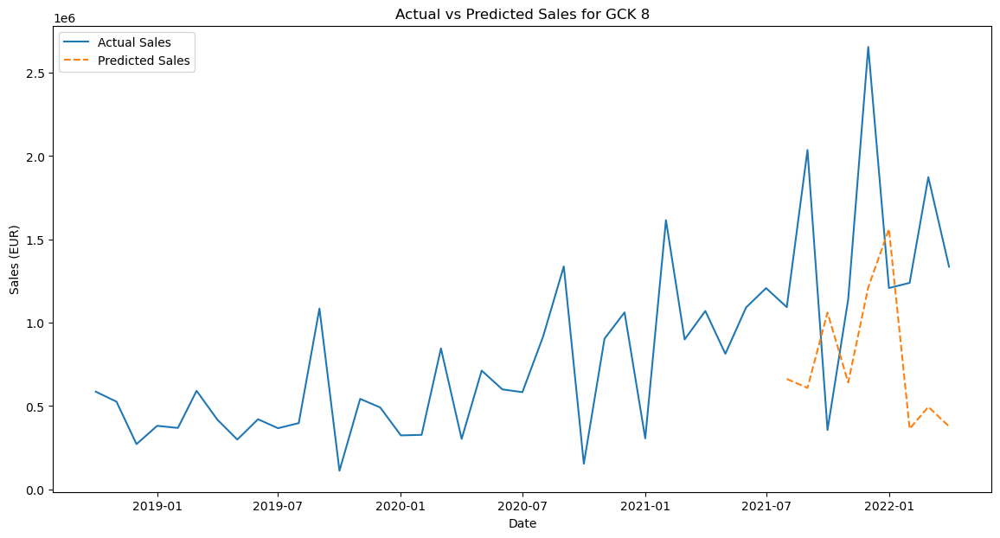

In [179]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck8.index, df_gck8['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck8.index[-len(y8_test):], y8_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 8')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()


In [180]:
#apply the a linear regression model to the GCK 8 data
model8_LR = LinearRegression()

model8_LR.fit(X8_train, y8_train)

y8_pred_LR = model8_LR.predict(X8_test)

rmse8_LR = mean_squared_error(y8_test, y8_pred_LR, squared=False)

rmse8_LR

348167.6418945704

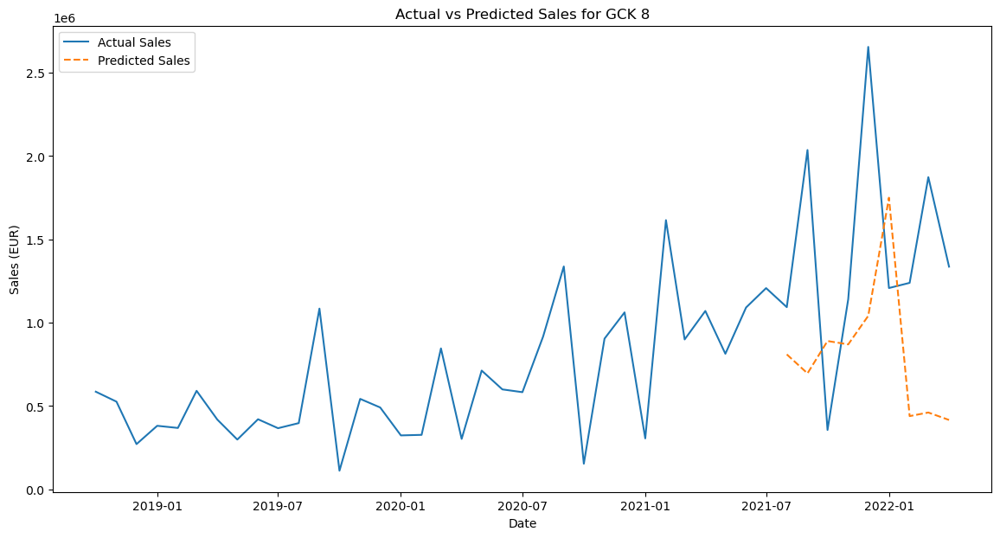

In [181]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck8.index, df_gck8['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck8.index[-len(y8_test):], y8_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 8')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [182]:
#make a knn model
model8_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model8_KNN.fit(X8_train, y8_train)

y8_pred_KNN = model8_KNN.predict(X8_test)

rmse8_KNN = mean_squared_error(y8_test, y8_pred_KNN, squared=False)

rmse8_KNN

333257.71546555235

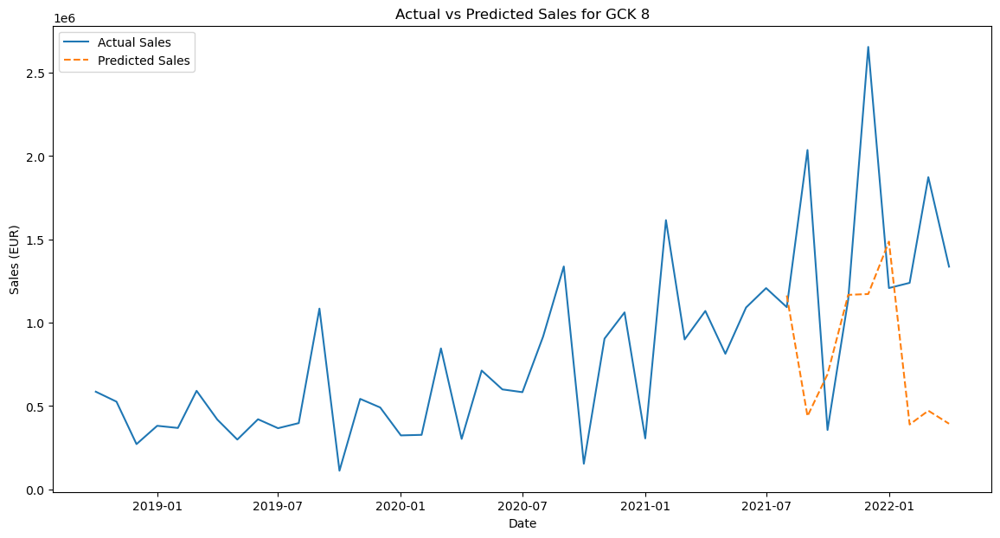

In [183]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck8.index, df_gck8['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck8.index[-len(y8_test):], y8_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 8')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [184]:
#Make an ensemble model that runs these 4 models and selects the best one
model8_ensemble = VotingRegressor(estimators=[
    ('xgb', model8),
    ('rf', model8_RF),
    ('lr', model8_LR),
    ('knn', model8_KNN)
])

model8_ensemble.fit(X8_train, y8_train)

y8_pred_ensemble = model8_ensemble.predict(X8_test)

rmse8_ensemble = mean_squared_error(y8_test, y8_pred_ensemble, squared=False)

rmse8_ensemble


308728.6772110124

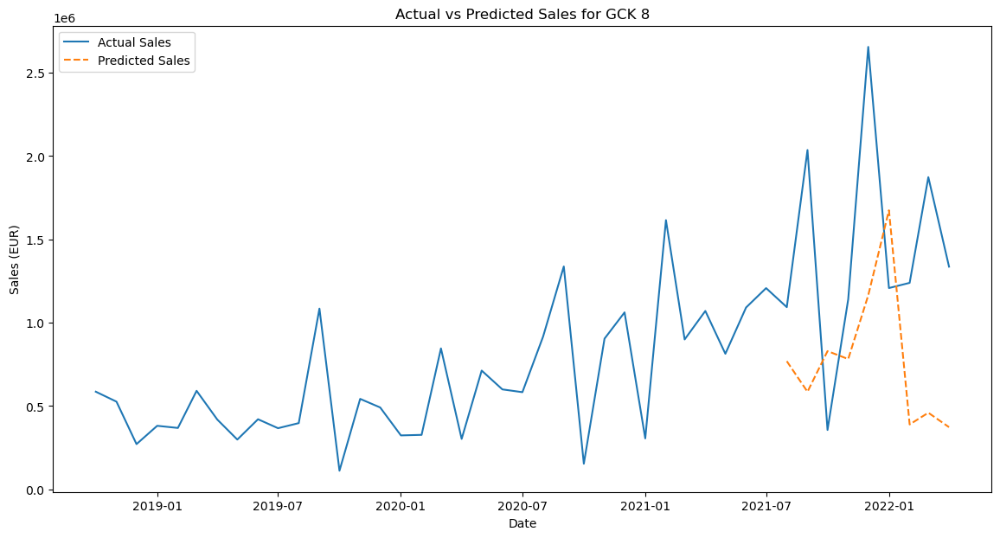

In [185]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck8.index, df_gck8['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck8.index[-len(y8_test):], y8_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 8')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [186]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse8, rmse8_RF, rmse8_LR, rmse8_KNN, rmse8_ensemble]

rmse_table8 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table8

,Model,RMSE
0,XGBoost,377585.095316
1,Random Forest,303534.026458
2,Linear Regression,348167.641895
3,KNN,333257.715466
4,Ensemble,308728.677211


In [187]:
#Create a future DataFrame for the GCK 8 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df8 = pd.DataFrame(index=future_dates, columns=df_gck8_filtered.columns)

#Join the future DataFrame with the df_gck1_filtered DataFrame
final_df8 = pd.concat([df_gck8_filtered, future_df8])

final_df8

,MACD Histogram,World: Price of Natural gas index,12 Month EMA,production index: United Kingdom: Electrical equipment_lag_6,Sales_EUR_Lag_3,Sales_EUR
2018-10-01,0.000000,89.570796,5.860527e+05,99.391278,586052.74,586052.74
2018-11-01,-595.897137,97.362468,5.536828e+05,102.504740,586052.74,526292.77
2018-12-01,-5231.762251,94.406578,4.435431e+05,105.139208,586052.74,271490.71
2019-01-01,-3166.664007,80.055366,4.239270e+05,103.462728,586052.74,381400.15
2019-02-01,-2281.334539,69.545042,4.088611e+05,105.737950,526292.77,368475.57
2019-03-01,5373.482651,67.912111,4.532005e+05,110.288394,271490.71,591288.36
2019-04-01,2799.131403,62.486066,4.455464e+05,118.670791,381400.15,418899.90
2019-05-01,-3025.882174,59.422335,4.149241e+05,120.467019,368475.57,298806.84
2019-06-01,-1194.043068,52.962529,4.160683e+05,105.378705,591288.36,420707.73
2019-07-01,-2189.317119,52.731038,4.067662e+05,107.174933,418899.90,366980.26


In [188]:
#Separate the target variable and the features from the final_df DataFrame
y_final8 = final_df8['Sales_EUR']
X_final8 = final_df8.drop('Sales_EUR', axis=1)

In [189]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final8.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df8[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [190]:
final_df8

,MACD Histogram,World: Price of Natural gas index,12 Month EMA,production index: United Kingdom: Electrical equipment_lag_6,Sales_EUR_Lag_3,Sales_EUR
2018-10-01,0.000000,89.570796,5.860527e+05,99.391278,5.860527e+05,586052.74
2018-11-01,-595.897137,97.362468,5.536828e+05,102.504740,5.860527e+05,526292.77
2018-12-01,-5231.762251,94.406578,4.435431e+05,105.139208,5.860527e+05,271490.71
2019-01-01,-3166.664007,80.055366,4.239270e+05,103.462728,5.860527e+05,381400.15
2019-02-01,-2281.334539,69.545042,4.088611e+05,105.737950,5.262928e+05,368475.57
2019-03-01,5373.482651,67.912111,4.532005e+05,110.288394,2.714907e+05,591288.36
2019-04-01,2799.131403,62.486066,4.455464e+05,118.670791,3.814002e+05,418899.90
2019-05-01,-3025.882174,59.422335,4.149241e+05,120.467019,3.684756e+05,298806.84
2019-06-01,-1194.043068,52.962529,4.160683e+05,105.378705,5.912884e+05,420707.73
2019-07-01,-2189.317119,52.731038,4.067662e+05,107.174933,4.188999e+05,366980.26


In [191]:
#Split the target and features
y8_final = final_df8['Sales_EUR']
X8_final = final_df8.drop('Sales_EUR', axis=1)

#Train test split
X8_final_train = X8_final.loc['2018-01-01':'2022-04-01']
y8_final_train = y8_final.loc['2018-01-01':'2022-04-01']
X8_final_test = X8_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X8_final8_train_scaled = scaler.fit_transform(X8_final_train)

X8_final8_test_scaled = scaler.transform(X8_final_test)

#Apply the rf model to the final data

model8_ensemble.fit(X8_final8_train_scaled, y8_final_train)

y8_final_pred = model8_ensemble.predict(X8_final8_test_scaled)

y8_final_pred

array([1496980.89465746, 1436135.62964441, 1499146.0246804 ,
       1719348.39188189, 2247270.94748706, 1384169.11760891,
       1472686.07747016, 2162847.5315091 , 1570363.98761226,
       1863183.84838577])

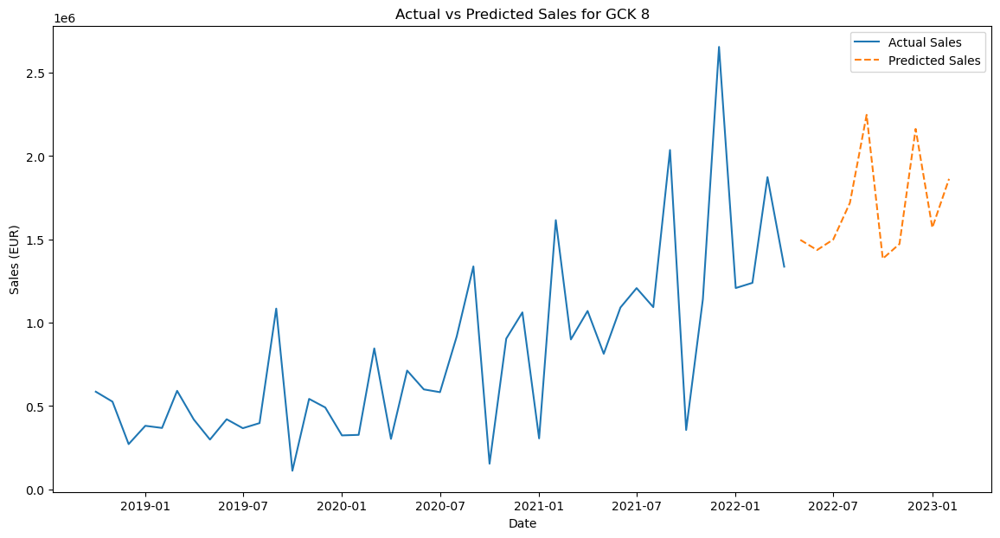

In [192]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df8.index, final_df8['Sales_EUR'], label='Actual Sales')
plt.plot(final_df8.index[-len(y8_final_pred):], y8_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 8')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 9

In [193]:
#Set Date to datetime
df_gck9['Date'] = pd.to_datetime(df_gck9['Date'])
df_gck9.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\2004432027.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck9['Date'] = pd.to_datetime(df_gck9['Date'])


In [194]:
#Check the correlation of the features with the target
correlation = df_gck9.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                 1.000000
MACD Histogram                                            0.740008
MACD                                                      0.686449
12 Month EMA                                              0.514284
26 Month EMA                                              0.384131
                                                            ...   
World: Price of Energy_lag_5                             -0.297771
World: Price of Energy_lag_6                             -0.312427
Germany:Production Index Machinery & Electricals_lag_2   -0.314456
Germany:Shipments Index Machinery & Electricals_lag_2    -0.317648
Mapped_GCK                                                     NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [195]:
#Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}
for feature in market_features:
    correlation_with_target[feature] = df_gck9[feature].corr(df_gck9['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals', 'France:Production Index Machinery & Electricals', 'France:Shipments Index Machinery & Electricals', 'Germany:Production Index Machinery & Electricals_lag_2', 'Germany:Shipments Index Machinery & Electricals_lag_2', 'Italy:Production Index Machinery & Electricals', 'Italy:Shipments Index Machinery & Electricals', 'Japan:Production Index Machinery & Electricals_lag_2', 'Switzerland:Production Index Machinery & Electricals_lag_4', 'UK:Production Index Machinery & Electricals', 'UK:Shipments Index Machinery & Electricals_lag_6', 'US:Production Index Machinery & Electricals_lag_6', 'US:Shipments Index Machinery & Electricals', 'Europe:Production Index Machinery & Electricals', 'Europe:Shipments Index Machinery & Electricals', 'World: Price of Energy_lag_6', 'World: Price of Metals & Minerals_lag_2', 'World: Price of Natural gas index_lag_6', 'United States: EUR in LCU_lag_2', 'Producer Prices: France: Electrical equipmen

In [196]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck9 = df_gck9.drop(features_to_remove, axis=1)

In [197]:
# Create a list with the pairs features that are highly correlated (0.95) in df_gck9
correlated_features = set()
correlation_matrix = df_gck9.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA',
 'Producer Prices: France: Electrical equipment_lag_6',
 'production index: France: Electrical equipment',
 'production index: Italy: Electrical equipment'}

In [198]:
to_drop =['26 Month EMA',
 'Producer Prices: France: Electrical equipment_lag_6',
 'production index: France: Electrical equipment',
 'production index: Italy: Electrical equipment']

df_gck9 = df_gck9.drop(to_drop, axis=1)

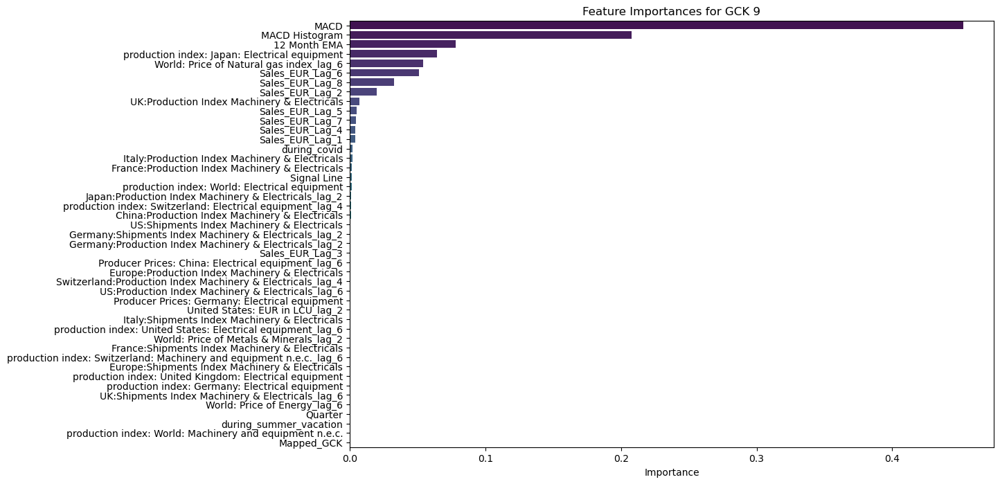

In [199]:
# Apply the XGBoost model to the GCK 9 data to see the feature importance based on RMSE
X_FI9 = df_gck9.drop('Sales_EUR', axis=1)
y_FI9 = df_gck9['Sales_EUR']

X_train_FI9, X_test_FI9, y_train_FI9, y_test_FI9 = train_test_split(X_FI9, y_FI9, test_size=0.2, random_state=42)

model_FI9 = XGBRegressor(objective='reg:squarederror', random_state=42)

model_FI9.fit(X_train_FI9, y_train_FI9)

y_pred_FI9 = model_FI9.predict(X_test_FI9)

rmse_FI9 = mean_squared_error(y_test_FI9, y_pred_FI9, squared=False)

# Get the feature importances
importances_FI9 = model_FI9.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI9 = pd.DataFrame(importances_FI9, index=X_FI9.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI9 = feature_importances_FI9.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI9['Importance'], y=feature_importances_FI9.index, palette='viridis')
plt.title('Feature Importances for GCK 9')
plt.show()


In [200]:
# Get a list of the features with importance greater than 0.01
important_features_FI9 = feature_importances_FI9[feature_importances_FI9['Importance'] > 0.01].index

important_features_FI9

Index(['MACD', 'MACD Histogram', '12 Month EMA',
       'production index: Japan: Electrical equipment',
       'World: Price of Natural gas index_lag_6', 'Sales_EUR_Lag_6',
       'Sales_EUR_Lag_8', 'Sales_EUR_Lag_2'],
      dtype='object')

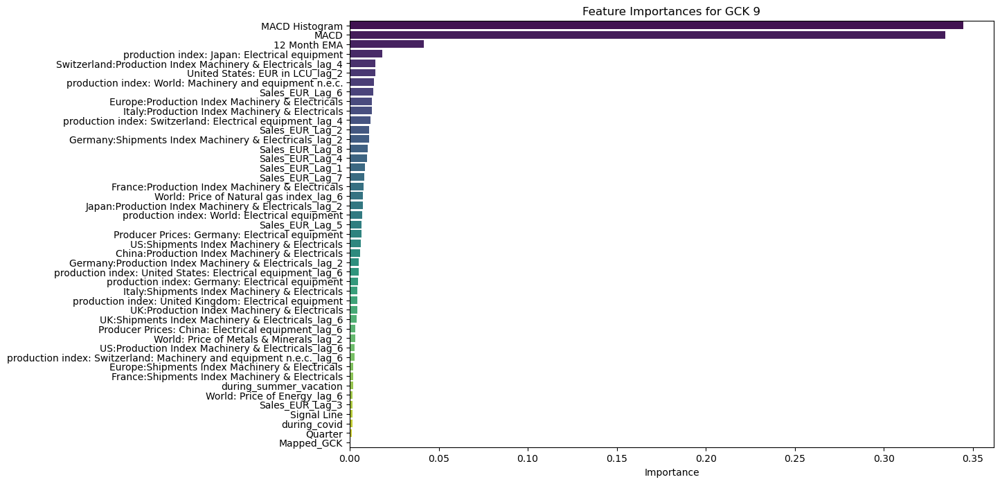

In [201]:
# Do the same with Random Forest model
model_RF9 = RandomForestRegressor(random_state=42)

model_RF9.fit(X_train_FI9, y_train_FI9)

y_pred_RF9 = model_RF9.predict(X_test_FI9)

rmse_RF9 = mean_squared_error(y_test_FI9, y_pred_RF9, squared=False)

# Get the feature importances
importances_RF9 = model_RF9.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_RF9 = pd.DataFrame(importances_RF9, index=X_FI9.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_RF9 = feature_importances_RF9.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))

sns.barplot(x=feature_importances_RF9['Importance'], y=feature_importances_RF9.index, palette='viridis')
plt.title('Feature Importances for GCK 9')
plt.show()

In [202]:
# Get a list of the features with importance greater than 0.01
important_features_RF9 = feature_importances_RF9[feature_importances_RF9['Importance'] > 0.01].index

important_features_RF9

Index(['MACD Histogram', 'MACD', '12 Month EMA',
       'production index: Japan: Electrical equipment',
       'Switzerland:Production Index Machinery & Electricals_lag_4',
       'United States: EUR in LCU_lag_2',
       'production index: World: Machinery and equipment n.e.c.',
       'Sales_EUR_Lag_6', 'Europe:Production Index Machinery & Electricals',
       'Italy:Production Index Machinery & Electricals',
       'production index: Switzerland: Electrical equipment_lag_4',
       'Sales_EUR_Lag_2',
       'Germany:Shipments Index Machinery & Electricals_lag_2',
       'Sales_EUR_Lag_8'],
      dtype='object')

In [203]:
# Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck9 = list(set(important_features_FI9).intersection(important_features_RF9))

important_features_gck9

['MACD Histogram',
 'production index: Japan: Electrical equipment',
 'Sales_EUR_Lag_8',
 'MACD',
 '12 Month EMA',
 'Sales_EUR_Lag_6',
 'Sales_EUR_Lag_2']

In [204]:
# Filter the df_gck9 DataFrame to only include the important features and the target variable
df_gck9_filtered = df_gck9[important_features_gck9 + ['Sales_EUR']]

df_gck9_filtered


,MACD Histogram,production index: Japan: Electrical equipment,Sales_EUR_Lag_8,MACD,12 Month EMA,Sales_EUR_Lag_6,Sales_EUR_Lag_2,Sales_EUR
Date,,,,,,,,
2018-10-01,0.000000,112.376774,3219.32,0.000000,3219.320000,3219.32,3219.32,3219.32
2018-11-01,-13.395926,111.907535,3219.32,-30.140833,2491.634167,3219.32,3219.32,1875.90
2018-12-01,-47.113993,112.524242,3219.32,-96.576951,1519.148776,3219.32,3219.32,0.00
2019-01-01,-14.068694,95.957352,3219.32,-70.738975,1509.000664,3219.32,1875.90,1487.00
2019-02-01,49.871238,107.309956,3219.32,14.318520,1977.752893,3219.32,0.00,3234.28
2019-03-01,379.404776,131.450762,3219.32,484.932488,4669.039711,3219.32,1487.00,13050.61
2019-04-01,369.566020,101.308407,3219.32,600.309905,5662.177826,3219.32,3234.28,9119.65
2019-05-01,169.404263,101.892947,3219.32,453.737773,5443.455964,1875.90,13050.61,4614.08
2019-06-01,42.103387,112.251279,3219.32,339.084691,5254.450572,0.00,9119.65,4488.09


In [205]:
# Make a df for the target variable and the features
y9 = df_gck9_filtered['Sales_EUR']
X9 = df_gck9_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X9_scaled = scaler.fit_transform(X9)

# Split the data into train and test
X9_train, X9_test, y9_train, y9_test = train_test_split(X9_scaled, y9, test_size=0.2, random_state=42)


In [206]:
# Apply the XGBoost model to the GCK 9 data
model9 = XGBRegressor(objective='reg:squarederror', random_state=42)

model9.fit(X9_train, y9_train)

y9_pred = model9.predict(X9_test)

rmse9 = mean_squared_error(y9_test, y9_pred, squared=False)

rmse9

10107.870360123308

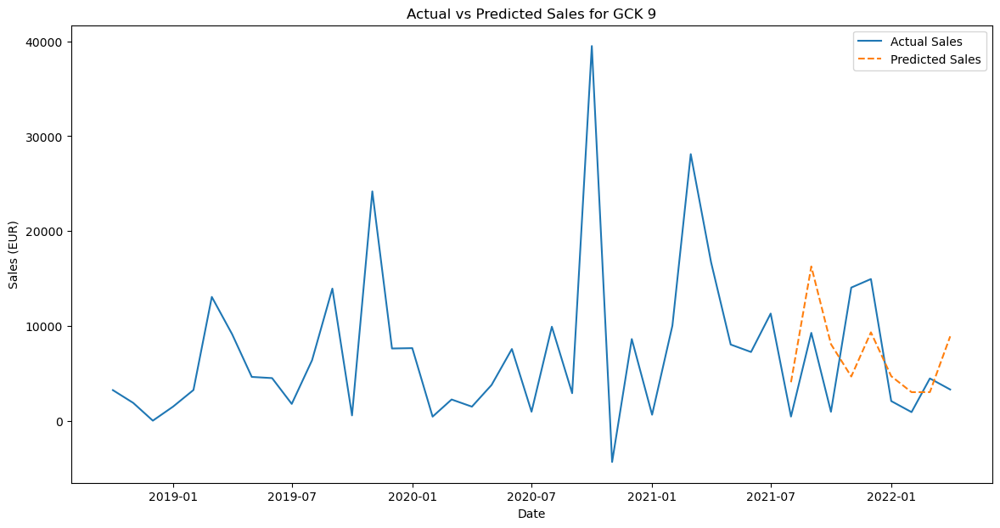

In [207]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck9.index, df_gck9['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck9.index[-len(y9_test):], y9_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 9')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [208]:
#apply the Random Forest model to the GCK 9 data
model9_RF = RandomForestRegressor(random_state=42)

model9_RF.fit(X9_train, y9_train)

y9_pred_RF = model9_RF.predict(X9_test)

rmse9_RF = mean_squared_error(y9_test, y9_pred_RF, squared=False)

rmse9_RF

9301.024869851926

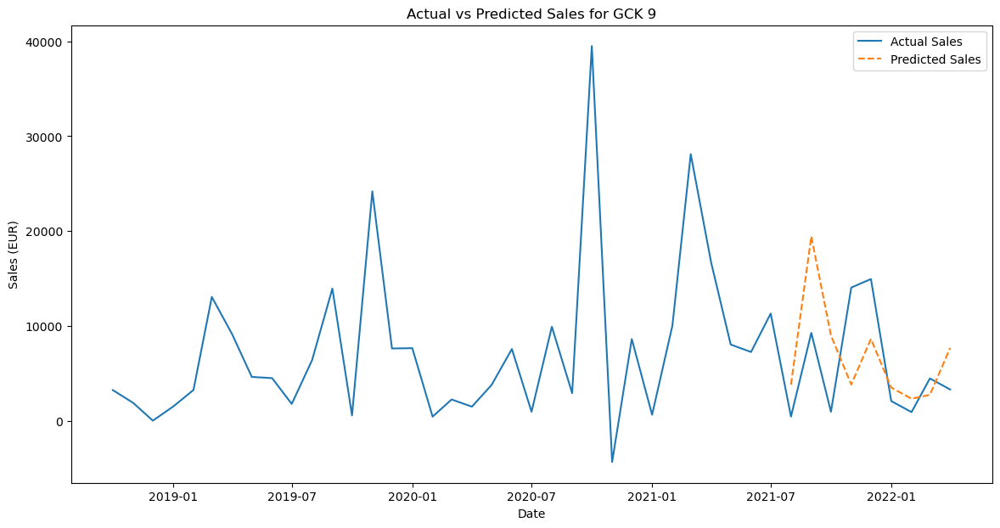

In [209]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck9.index, df_gck9['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck9.index[-len(y9_test):], y9_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 9')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [210]:
#apply the a linear regression model to the GCK 9 data
model9_LR = LinearRegression()

model9_LR.fit(X9_train, y9_train)

y9_pred_LR = model9_LR.predict(X9_test)

rmse9_LR = mean_squared_error(y9_test, y9_pred_LR, squared=False)

rmse9_LR

7575.820849909104

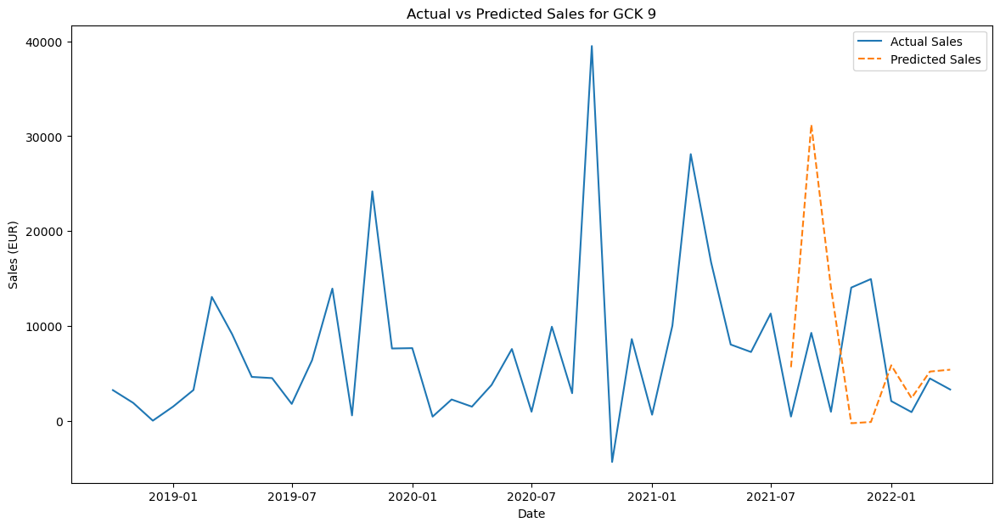

In [211]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck9.index, df_gck9['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck9.index[-len(y9_test):], y9_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 9')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [212]:
#make a knn model
model9_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model9_KNN.fit(X9_train, y9_train)

y9_pred_KNN = model9_KNN.predict(X9_test)

rmse9_KNN = mean_squared_error(y9_test, y9_pred_KNN, squared=False)

rmse9_KNN

9550.688387298691

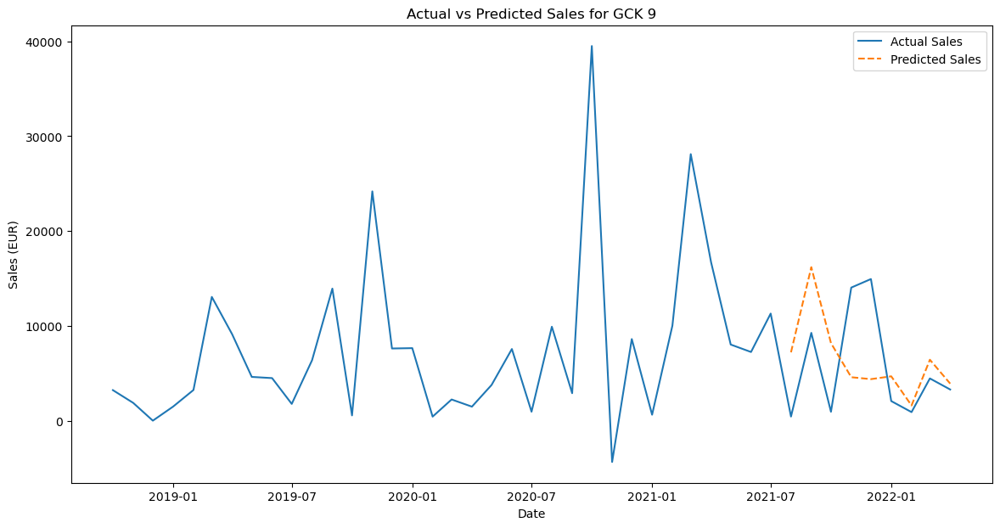

In [213]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck9.index, df_gck9['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck9.index[-len(y9_test):], y9_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 9')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [214]:
#Make an ensemble model that runs these 4 models and selects the best one
model9_ensemble = VotingRegressor(estimators=[
    ('xgb', model9),
    ('rf', model9_RF),
    ('lr', model9_LR),
    ('knn', model9_KNN)
])

model9_ensemble.fit(X9_train, y9_train)

y9_pred_ensemble = model9_ensemble.predict(X9_test)

rmse9_ensemble = mean_squared_error(y9_test, y9_pred_ensemble, squared=False)

rmse9_ensemble

8739.665957697785

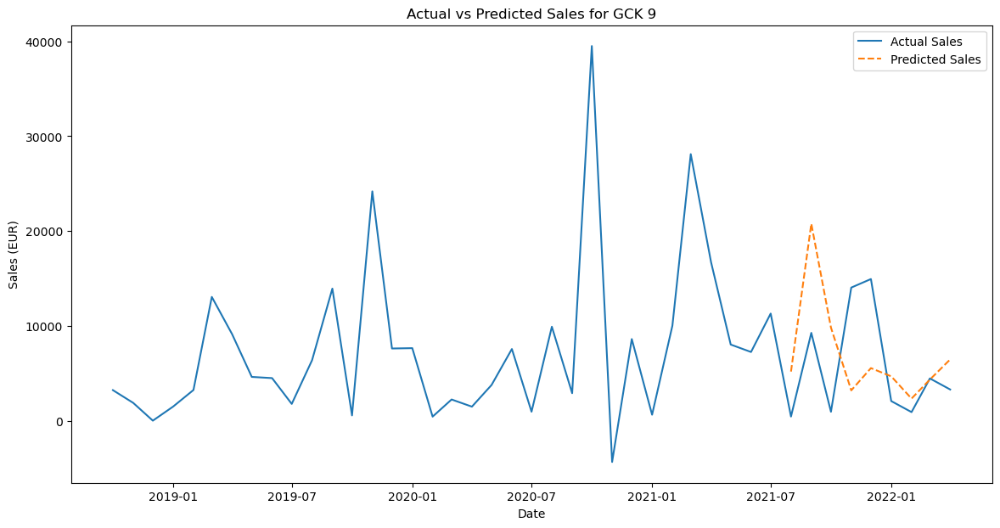

In [215]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck9.index, df_gck9['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck9.index[-len(y9_test):], y9_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 9')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()    
plt.show()

In [216]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse9, rmse9_RF, rmse9_LR, rmse9_KNN, rmse9_ensemble]

rmse_table9 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table9

,Model,RMSE
0,XGBoost,10107.870360
1,Random Forest,9301.024870
2,Linear Regression,7575.820850
3,KNN,9550.688387
4,Ensemble,8739.665958


In [217]:
#Create a future DataFrame for the GCK 9 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df9 = pd.DataFrame(index=future_dates, columns=df_gck9_filtered.columns)

#Join the future DataFrame with the df_gck1_filtered DataFrame
final_df9 = pd.concat([df_gck9_filtered, future_df9])

final_df9

,MACD Histogram,production index: Japan: Electrical equipment,Sales_EUR_Lag_8,MACD,12 Month EMA,Sales_EUR_Lag_6,Sales_EUR_Lag_2,Sales_EUR
2018-10-01,0.000000,112.376774,3219.32,0.000000,3219.320000,3219.32,3219.32,3219.32
2018-11-01,-13.395926,111.907535,3219.32,-30.140833,2491.634167,3219.32,3219.32,1875.90
2018-12-01,-47.113993,112.524242,3219.32,-96.576951,1519.148776,3219.32,3219.32,0.00
2019-01-01,-14.068694,95.957352,3219.32,-70.738975,1509.000664,3219.32,1875.90,1487.00
2019-02-01,49.871238,107.309956,3219.32,14.318520,1977.752893,3219.32,0.00,3234.28
2019-03-01,379.404776,131.450762,3219.32,484.932488,4669.039711,3219.32,1487.00,13050.61
2019-04-01,369.566020,101.308407,3219.32,600.309905,5662.177826,3219.32,3234.28,9119.65
2019-05-01,169.404263,101.892947,3219.32,453.737773,5443.455964,1875.90,13050.61,4614.08
2019-06-01,42.103387,112.251279,3219.32,339.084691,5254.450572,0.00,9119.65,4488.09
2019-07-01,-143.048155,114.830812,1875.90,112.627107,4593.466344,1487.00,4614.08,1766.40


In [218]:
#Separate the target variable and the features from the final_df DataFrame
y_final9 = final_df9['Sales_EUR']
X_final9 = final_df9.drop('Sales_EUR', axis=1)

In [219]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final9.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df9[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

In [220]:
#Split the target and features
y9_final = final_df9['Sales_EUR']
X9_final = final_df9.drop('Sales_EUR', axis=1)

#Train test split
X9_final_train = X9_final.loc['2018-01-01':'2022-04-01']
y9_final_train = y9_final.loc['2018-01-01':'2022-04-01']
X9_final_test = X9_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X9_final9_train_scaled = scaler.fit_transform(X9_final_train)

X9_final9_test_scaled = scaler.transform(X9_final_test)

#Apply the Lr model to the final data
model9_LR.fit(X9_final9_train_scaled, y9_final_train)

y9_final_pred = model9_LR.predict(X9_final9_test_scaled)

y9_final_pred

array([10742.93506417, 13357.45961041, 12002.14649372, 14369.83128427,
       14601.08480257, 32698.63892876, 26377.25128314, 15229.27302855,
       15716.38809306, 51607.9900295 ])

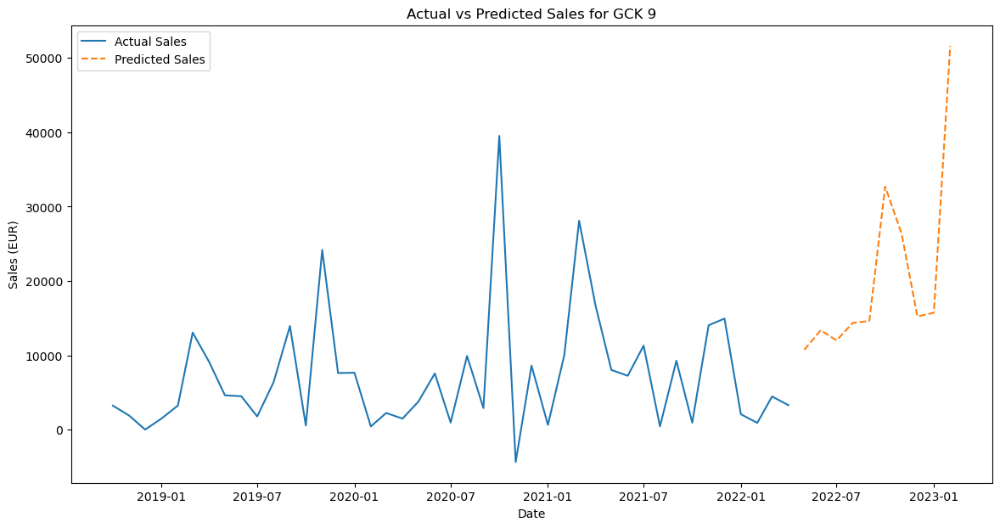

In [221]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df9.index, final_df9['Sales_EUR'], label='Actual Sales')
plt.plot(final_df9.index[-len(y9_final_pred):], y9_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 9')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


# GCK 11

In [222]:
#Set Date to datetime
df_gck11['Date'] = pd.to_datetime(df_gck11['Date'])

df_gck11.set_index('Date', inplace = True)


C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\1392174068.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck11['Date'] = pd.to_datetime(df_gck11['Date'])


In [223]:
#Check the correlation of the features with the target
correlation = df_gck11.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                1.000000
MACD Histogram                                           0.788985
MACD                                                     0.686430
12 Month EMA                                             0.562963
production index: Japan: Electrical equipment_lag_6      0.485801
                                                           ...   
Italy:Production Index Machinery & Electricals_lag_1    -0.330881
production index: Japan: Electrical equipment_lag_1     -0.331302
France:Shipments Index Machinery & Electricals_lag_1    -0.331768
France:Production Index Machinery & Electricals_lag_1   -0.396197
Mapped_GCK                                                    NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [224]:
#Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}

for feature in market_features:
    correlation_with_target[feature] = df_gck11[feature].corr(df_gck11['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_3', 'France:Production Index Machinery & Electricals_lag_1', 'France:Shipments Index Machinery & Electricals_lag_1', 'Germany:Production Index Machinery & Electricals_lag_1', 'Germany:Shipments Index Machinery & Electricals', 'Italy:Production Index Machinery & Electricals_lag_1', 'Italy:Shipments Index Machinery & Electricals_lag_1', 'Japan:Production Index Machinery & Electricals_lag_6', 'Switzerland:Production Index Machinery & Electricals_lag_3', 'UK:Production Index Machinery & Electricals_lag_6', 'UK:Shipments Index Machinery & Electricals_lag_4', 'US:Production Index Machinery & Electricals_lag_6', 'US:Shipments Index Machinery & Electricals_lag_3', 'Europe:Production Index Machinery & Electricals_lag_1', 'Europe:Shipments Index Machinery & Electricals_lag_1', 'World: Price of Energy_lag_2', 'World: Price of Metals & Minerals_lag_2', 'World: Price of Natural gas index', 'United States: EUR in LCU_lag_6', 'Pr

In [225]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck11 = df_gck11.drop(features_to_remove, axis=1)

# Create a list with the pairs features that are highly correlated (0.95) in df_gck11
correlated_features = set()
correlation_matrix = df_gck11.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA',
 'production index: France: Electrical equipment_lag_1',
 'production index: Italy: Electrical equipment_lag_1',
 'production index: Japan: Electrical equipment_lag_6'}

In [226]:
to_drop = ['26 Month EMA',
 'production index: France: Electrical equipment_lag_1',
 'production index: Italy: Electrical equipment_lag_1',
 'production index: Japan: Electrical equipment_lag_6']

df_gck11 = df_gck11.drop(to_drop, axis=1)

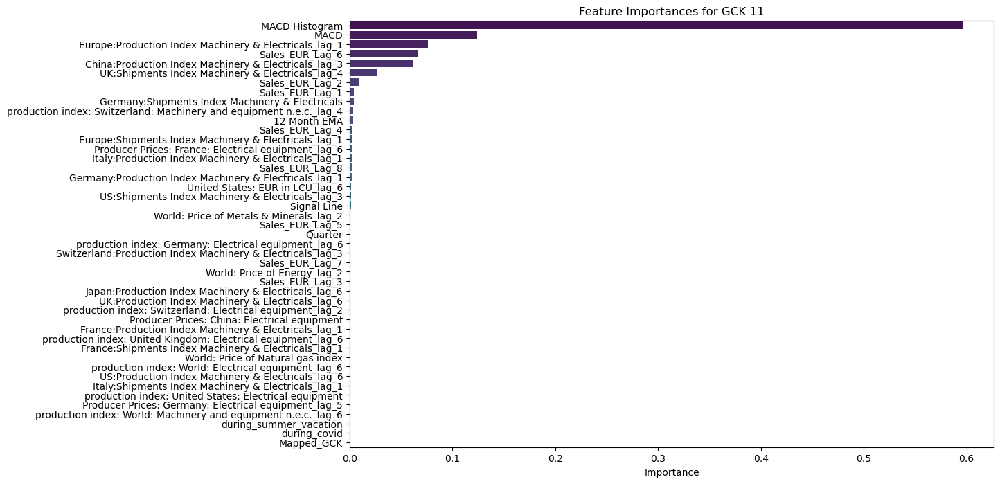

In [227]:
# Apply the XGBoost model to the GCK 11 data to see the feature importance based on RMSE
X_FI11 = df_gck11.drop('Sales_EUR', axis=1)
y_FI11 = df_gck11['Sales_EUR']

X_train_FI11, X_test_FI11, y_train_FI11, y_test_FI11 = train_test_split(X_FI11, y_FI11, test_size=0.2, random_state=42)

model_FI11 = XGBRegressor(objective='reg:squarederror', random_state = 42)

model_FI11.fit(X_train_FI11, y_train_FI11)

y_pred_FI11 = model_FI11.predict(X_test_FI11)

rmse_FI11 = mean_squared_error(y_test_FI11, y_pred_FI11, squared=False)

# Get the feature importances
importances_FI11 = model_FI11.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI11 = pd.DataFrame(importances_FI11, index=X_FI11.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI11 = feature_importances_FI11.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI11['Importance'], y=feature_importances_FI11.index, palette='viridis')

plt.title('Feature Importances for GCK 11')
plt.show()

In [228]:
# Get a list of the features with importance greater than 0.01
important_features_FI11 = feature_importances_FI11[feature_importances_FI11['Importance'] > 0.01].index

important_features_FI11

Index(['MACD Histogram', 'MACD',
       'Europe:Production Index Machinery & Electricals_lag_1',
       'Sales_EUR_Lag_6',
       'China:Production Index Machinery & Electricals_lag_3',
       'UK:Shipments Index Machinery & Electricals_lag_4'],
      dtype='object')

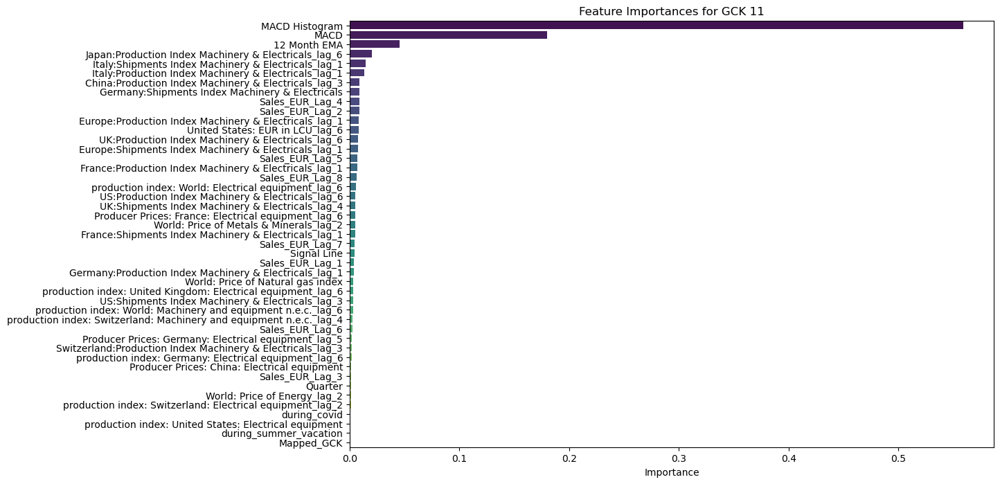

In [229]:
# Do the same with Random Forest model

model_RF11 = RandomForestRegressor(random_state = 42)

model_RF11.fit(X_train_FI11, y_train_FI11)

y_pred_RF11 = model_RF11.predict(X_test_FI11)

rmse_RF11 = mean_squared_error(y_test_FI11, y_pred_RF11, squared=False)

# Get the feature importances

importances_RF11 = model_RF11.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_RF11 = pd.DataFrame(importances_RF11, index=X_FI11.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_RF11 = feature_importances_RF11.sort_values(by='Importance', ascending=False)

# Plot the feature importances

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF11['Importance'], y=feature_importances_RF11.index, palette='viridis')
plt.title('Feature Importances for GCK 11')
plt.show()

In [230]:
# Get a list of the features with importance greater than 0.01
important_features_RF11 = feature_importances_RF11[feature_importances_RF11['Importance'] > 0.01].index

important_features_RF11

Index(['MACD Histogram', 'MACD', '12 Month EMA',
       'Japan:Production Index Machinery & Electricals_lag_6',
       'Italy:Shipments Index Machinery & Electricals_lag_1',
       'Italy:Production Index Machinery & Electricals_lag_1'],
      dtype='object')

In [231]:
# Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck11 = list(set(important_features_FI11).intersection(important_features_RF11))

important_features_gck11

['MACD Histogram', 'MACD']

In [232]:
# Filter the df_gck11 DataFrame to only include the important features and the target variable
df_gck11_filtered = df_gck11[important_features_gck11 + ['Sales_EUR']]

df_gck11_filtered

# Make a df for the target variable and the features
y11 = df_gck11_filtered['Sales_EUR']
X11 = df_gck11_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X11_scaled = scaler.fit_transform(X11)

# Split the data into train and test
X11_train, X11_test, y11_train, y11_test = train_test_split(X11_scaled, y11, test_size=0.2, random_state=42)

In [233]:
# Apply the XGBoost model to the GCK 11 data
model11 = XGBRegressor(objective='reg:squarederror', random_state = 42)

model11.fit(X11_train, y11_train)

y11_pred = model11.predict(X11_test)

rmse11 = mean_squared_error(y11_test, y11_pred, squared=False)

rmse11

1114129.7258195889

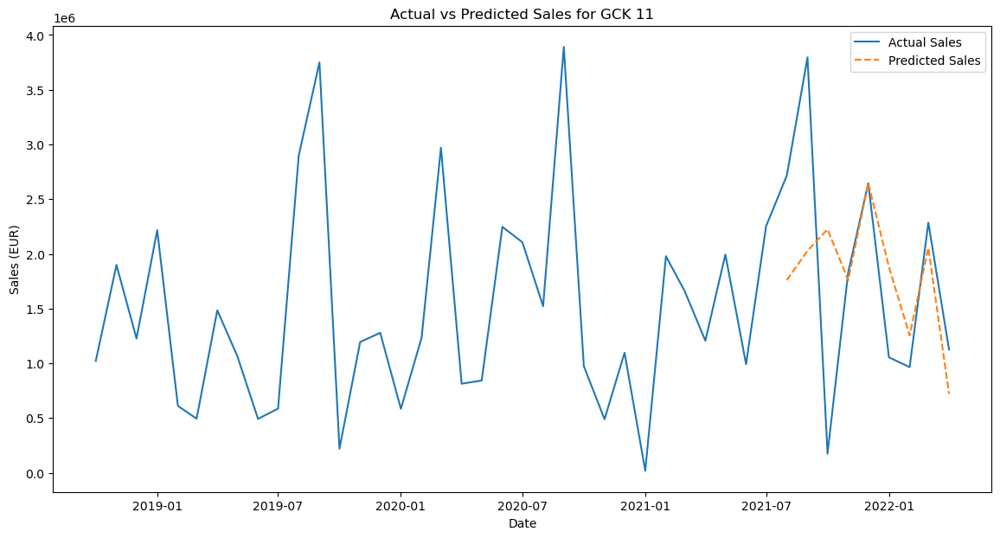

In [234]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck11.index, df_gck11['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck11.index[-len(y11_test):], y11_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 11')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [235]:
#apply the Random Forest model to the GCK 11 data
model11_RF = RandomForestRegressor(random_state = 42)

model11_RF.fit(X11_train, y11_train)

y11_pred_RF = model11_RF.predict(X11_test)

rmse11_RF = mean_squared_error(y11_test, y11_pred_RF, squared=False)

rmse11_RF

1094146.1218815825

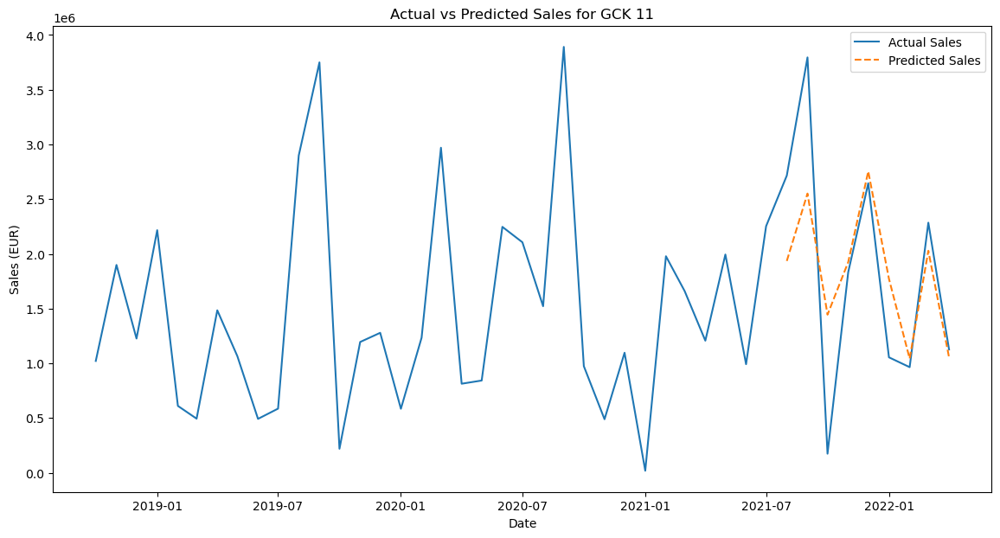

In [236]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck11.index, df_gck11['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck11.index[-len(y11_test):], y11_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 11')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [237]:
#apply the a linear regression model to the GCK 11 data
model11_LR = LinearRegression()

model11_LR.fit(X11_train, y11_train)

y11_pred_LR = model11_LR.predict(X11_test)

rmse11_LR = mean_squared_error(y11_test, y11_pred_LR, squared=False)

rmse11_LR

1136570.836509821

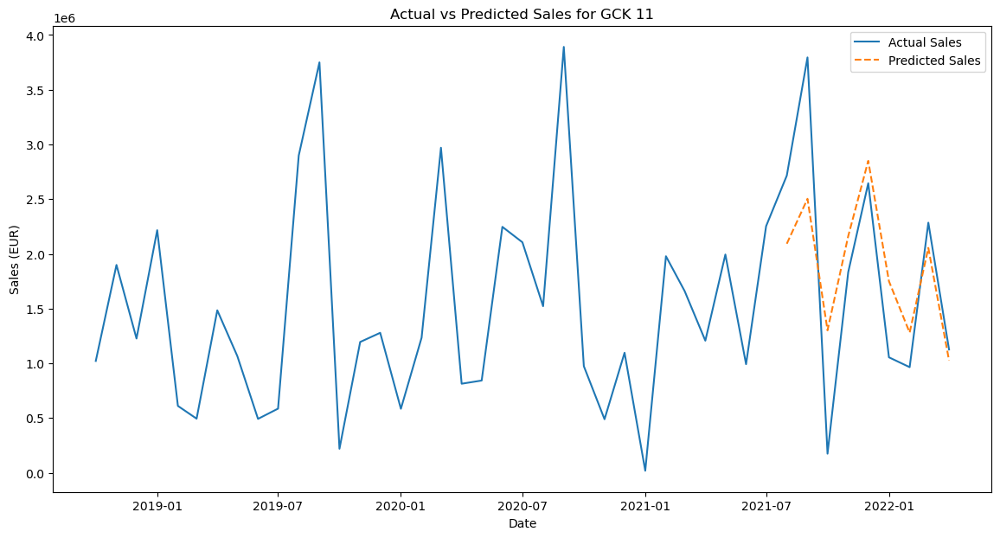

In [238]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck11.index, df_gck11['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck11.index[-len(y11_test):], y11_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 11')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [239]:
#make a knn model
model11_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model11_KNN.fit(X11_train, y11_train)

y11_pred_KNN = model11_KNN.predict(X11_test)

rmse11_KNN = mean_squared_error(y11_test, y11_pred_KNN, squared=False)

rmse11_KNN

1103062.5362985688

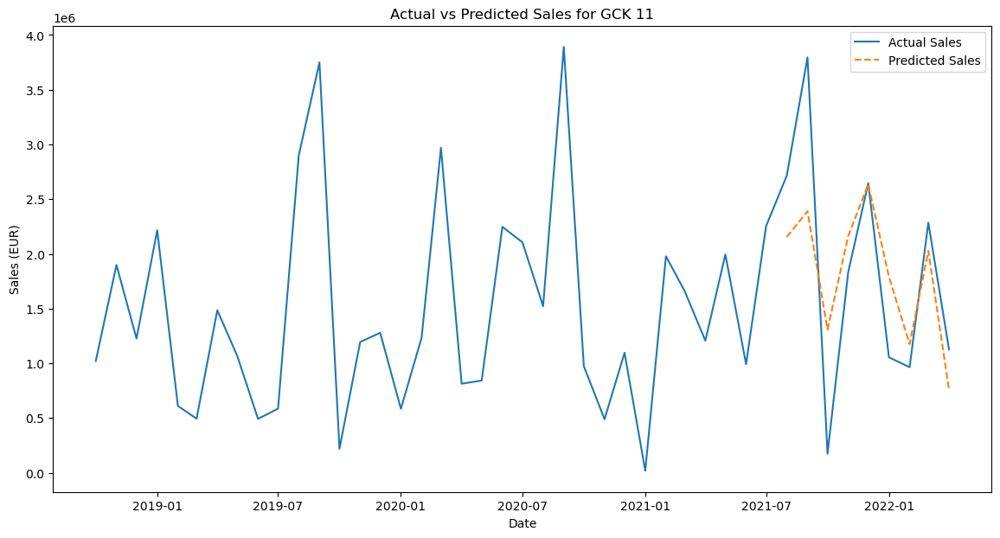

In [240]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck11.index, df_gck11['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck11.index[-len(y11_test):], y11_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 11')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [241]:
#Make an ensemble model that runs these 4 models and selects the best one
model11_ensemble = VotingRegressor(estimators=[
    ('xgb', model11),
    ('rf', model11_RF),
    ('lr', model11_LR),
    ('knn', model11_KNN)
])

model11_ensemble.fit(X11_train, y11_train)

y11_pred_ensemble = model11_ensemble.predict(X11_test)

rmse11_ensemble = mean_squared_error(y11_test, y11_pred_ensemble, squared=False)

rmse11_ensemble

1097897.7445411712

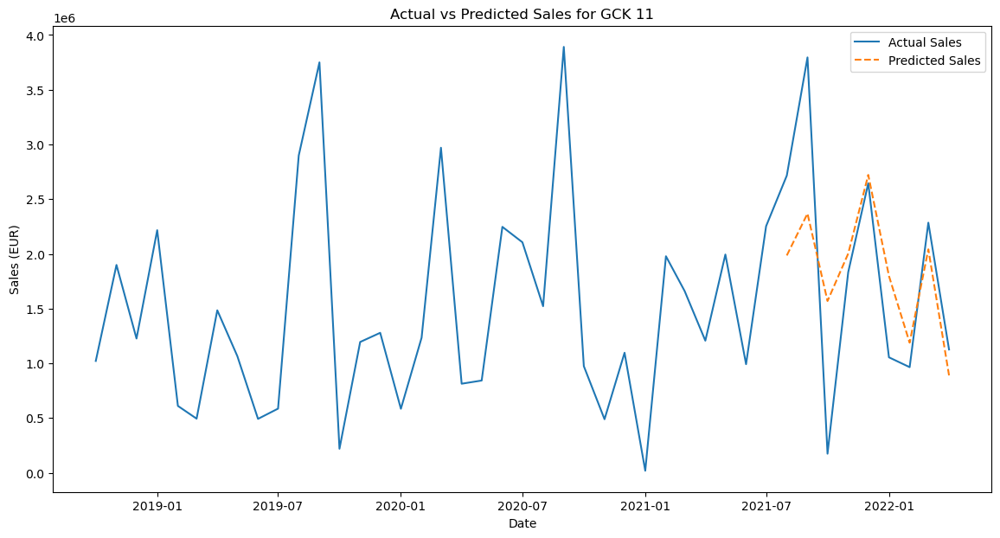

In [242]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck11.index, df_gck11['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck11.index[-len(y11_test):], y11_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 11')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [243]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']
rmse_values = [rmse11, rmse11_RF, rmse11_LR, rmse11_KNN, rmse11_ensemble]

rmse_table11 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table11

,Model,RMSE
0,XGBoost,1.114130e+06
1,Random Forest,1.094146e+06
2,Linear Regression,1.136571e+06
3,KNN,1.103063e+06
4,Ensemble,1.097898e+06


In [244]:
#Create a future DataFrame for the GCK 11 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df11 = pd.DataFrame(index=future_dates, columns=df_gck11_filtered.columns)

#Join the future DataFrame with the df_gck11_filtered DataFrame
final_df11 = pd.concat([df_gck11_filtered, future_df11])

final_df11

,MACD Histogram,MACD,Sales_EUR
2018-10-01,0.000000,0.000000,1021303.50
2018-11-01,8750.411823,19688.426603,1898844.80
2018-12-01,-3961.266001,4225.869611,1226122.00
2019-01-01,16303.568466,32842.942022,2216391.74
2019-02-01,-23001.731225,-16202.250634,610456.60
2019-03-01,-41666.283672,-50360.274818,493999.81
2019-04-01,-13327.625807,-26537.276447,1484281.60
2019-05-01,-12775.743761,-30026.894301,1066063.90
2019-06-01,-33228.396871,-60461.308197,492133.20
2019-07-01,-38115.212843,-76354.128240,585648.14


In [245]:
#Separate the target variable and the features from the final_df DataFrame
y_final11 = final_df11['Sales_EUR']
X_final11 = final_df11.drop('Sales_EUR', axis=1)

In [246]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final11.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df11[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [247]:
final_df11

,MACD Histogram,MACD,Sales_EUR
2018-10-01,0.000000,0.000000,1021303.50
2018-11-01,8750.411823,19688.426603,1898844.80
2018-12-01,-3961.266001,4225.869611,1226122.00
2019-01-01,16303.568466,32842.942022,2216391.74
2019-02-01,-23001.731225,-16202.250634,610456.60
2019-03-01,-41666.283672,-50360.274818,493999.81
2019-04-01,-13327.625807,-26537.276447,1484281.60
2019-05-01,-12775.743761,-30026.894301,1066063.90
2019-06-01,-33228.396871,-60461.308197,492133.20
2019-07-01,-38115.212843,-76354.128240,585648.14


In [248]:
#Split the target and features
y11_final = final_df11['Sales_EUR']
X11_final = final_df11.drop('Sales_EUR', axis=1)

#Train test split
X11_final_train = X11_final.loc['2018-01-01':'2022-04-01']
y11_final_train = y11_final.loc['2018-01-01':'2022-04-01']
X11_final_test = X11_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X11_final11_train_scaled = scaler.fit_transform(X11_final_train)

X11_final11_test_scaled = scaler.transform(X11_final_test)

#Apply the rf model to the final data

model11_RF.fit(X11_final11_train_scaled, y11_final_train)

y11_final_pred = model11_RF.predict(X11_final11_test_scaled)

y11_final_pred

array([ 987925.9053, 1199161.6007, 1534102.4725, 2675311.6039,
       3746593.8628, 1229698.7382,  802298.2713,  772263.1889,
       1080235.8023, 1166259.0514])

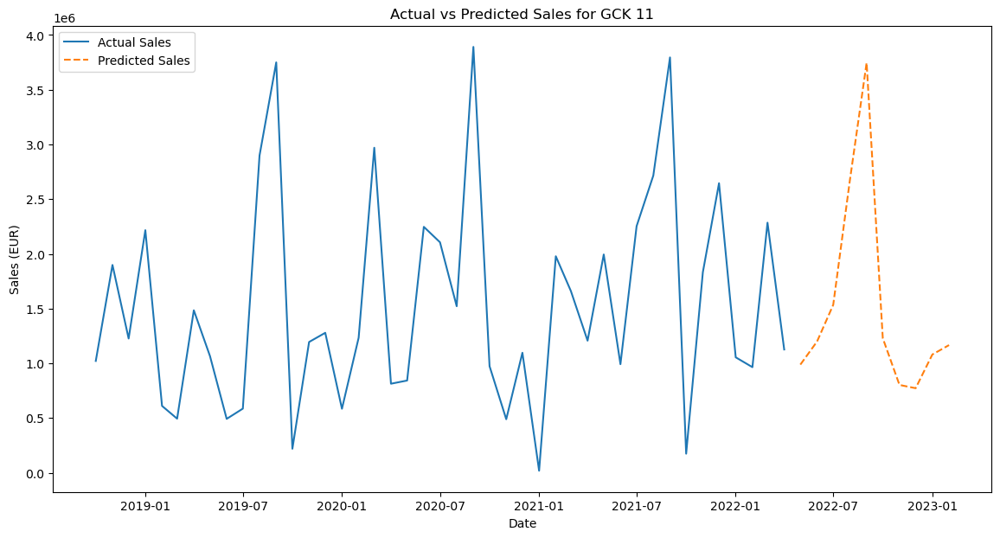

In [249]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df11.index, final_df11['Sales_EUR'], label='Actual Sales')
plt.plot(final_df11.index[-len(y11_final_pred):], y11_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 11')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 12

In [250]:
#Set Date to datetime
df_gck12['Date'] = pd.to_datetime(df_gck12['Date'])
df_gck12.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\1866022445.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck12['Date'] = pd.to_datetime(df_gck12['Date'])


In [251]:
#Check the correlation of the features with the target
correlation = df_gck12.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                              1.000000
MACD                                                                   0.846190
12 Month EMA                                                           0.757204
26 Month EMA                                                           0.716770
Signal Line                                                            0.663698
                                                                         ...   
Switzerland:Production Index Machinery & Electricals_lag_5            -0.445158
production index: Switzerland: Machinery and equipment n.e.c._lag_5   -0.485949
Switzerland:Production Index Machinery & Electricals_lag_6            -0.507642
production index: Switzerland: Machinery and equipment n.e.c._lag_6   -0.538891
Mapped_GCK                                                                  NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [252]:
#Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}

for feature in market_features:
    correlation_with_target[feature] = df_gck12[feature].corr(df_gck12['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]
        
        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_6', 'France:Production Index Machinery & Electricals_lag_2', 'France:Shipments Index Machinery & Electricals', 'Germany:Production Index Machinery & Electricals_lag_4', 'Germany:Shipments Index Machinery & Electricals', 'Italy:Production Index Machinery & Electricals', 'Italy:Shipments Index Machinery & Electricals', 'Japan:Production Index Machinery & Electricals_lag_4', 'Switzerland:Production Index Machinery & Electricals_lag_6', 'UK:Production Index Machinery & Electricals', 'UK:Shipments Index Machinery & Electricals_lag_1', 'US:Production Index Machinery & Electricals_lag_1', 'US:Shipments Index Machinery & Electricals_lag_3', 'Europe:Production Index Machinery & Electricals', 'Europe:Shipments Index Machinery & Electricals', 'World: Price of Energy', 'World: Price of Metals & Minerals_lag_2', 'World: Price of Natural gas index', 'United States: EUR in LCU_lag_3', 'Producer Prices: France: Electrical equipmen

In [253]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck12 = df_gck12.drop(features_to_remove, axis=1)


# Create a list with the pairs features that are highly correlated (0.95) in df_gck12
correlated_features = set()
correlation_matrix = df_gck12.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA', 'Signal Line'}

In [254]:
# Drop the features that are highly correlated
df_gck12 = df_gck12.drop(correlated_features, axis=1)

# Apply the XGBoost model to the GCK 12 data to see the feature importance based on RMSE
X_FI12 = df_gck12.drop('Sales_EUR', axis=1)
y_FI12 = df_gck12['Sales_EUR']

X_train_FI12, X_test_FI12, y_train_FI12, y_test_FI12 = train_test_split(X_FI12, y_FI12, test_size=0.2, random_state=42)

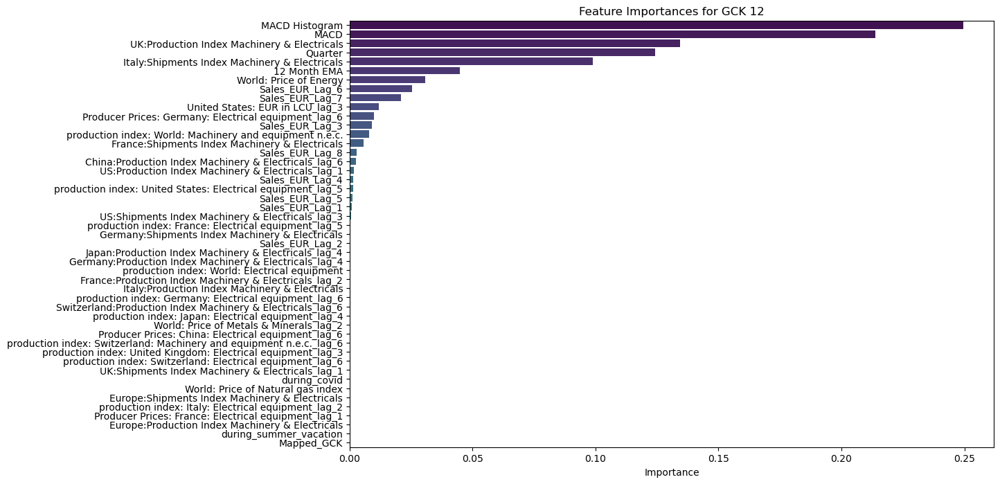

In [255]:
# Apply the XGBoost model to the GCK 12 data to see the feature importance based on RMSE
model_FI12 = XGBRegressor(objective='reg:squarederror', random_state = 42)

model_FI12.fit(X_train_FI12, y_train_FI12)

y_pred_FI12 = model_FI12.predict(X_test_FI12)

rmse_FI12 = mean_squared_error(y_test_FI12, y_pred_FI12, squared=False)

# Get the feature importances
importances_FI12 = model_FI12.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI12 = pd.DataFrame(importances_FI12, index=X_FI12.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI12 = feature_importances_FI12.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI12['Importance'], y=feature_importances_FI12.index, palette='viridis')

plt.title('Feature Importances for GCK 12')
plt.show()

In [256]:
# Get a list of the features with importance greater than 0.01
important_features_FI12 = feature_importances_FI12[feature_importances_FI12['Importance'] > 0.01].index

important_features_FI12

Index(['MACD Histogram', 'MACD', 'UK:Production Index Machinery & Electricals',
       'Quarter', 'Italy:Shipments Index Machinery & Electricals',
       '12 Month EMA', 'World: Price of Energy', 'Sales_EUR_Lag_6',
       'Sales_EUR_Lag_7', 'United States: EUR in LCU_lag_3'],
      dtype='object')

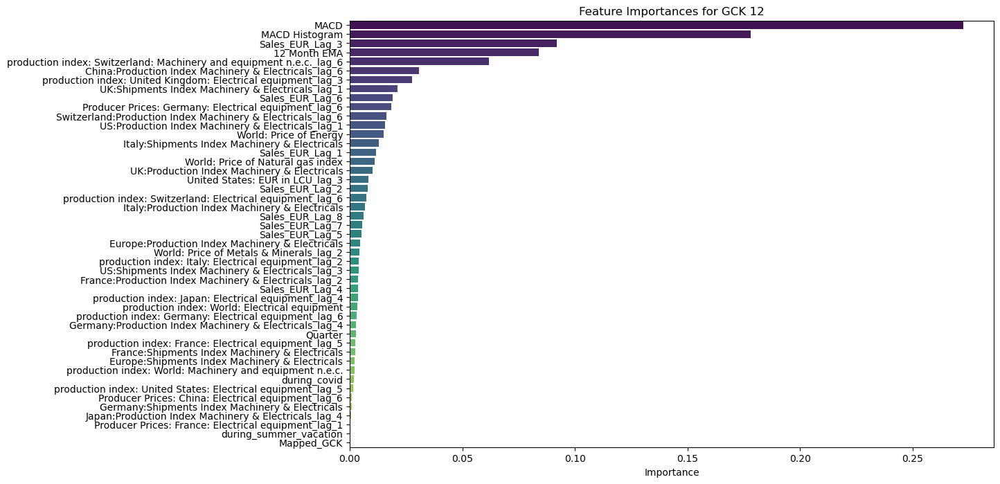

In [257]:
# Do the same with Random Forest model

model_RF12 = RandomForestRegressor(random_state = 42)

model_RF12.fit(X_train_FI12, y_train_FI12)

y_pred_RF12 = model_RF12.predict(X_test_FI12)

rmse_RF12 = mean_squared_error(y_test_FI12, y_pred_RF12, squared=False)

# Get the feature importances

importances_RF12 = model_RF12.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_RF12 = pd.DataFrame(importances_RF12, index=X_FI12.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_RF12 = feature_importances_RF12.sort_values(by='Importance', ascending=False)

# Plot the feature importances

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF12['Importance'], y=feature_importances_RF12.index, palette='viridis')
plt.title('Feature Importances for GCK 12')
plt.show()

In [258]:
# Get a list of the features with importance greater than 0.01
important_features_RF12 = feature_importances_RF12[feature_importances_RF12['Importance'] > 0.01].index

important_features_RF12

Index(['MACD', 'MACD Histogram', 'Sales_EUR_Lag_3', '12 Month EMA',
       'production index: Switzerland: Machinery and equipment n.e.c._lag_6',
       'China:Production Index Machinery & Electricals_lag_6',
       'production index: United Kingdom: Electrical equipment_lag_3',
       'UK:Shipments Index Machinery & Electricals_lag_1', 'Sales_EUR_Lag_6',
       'Producer Prices: Germany: Electrical equipment_lag_6',
       'Switzerland:Production Index Machinery & Electricals_lag_6',
       'US:Production Index Machinery & Electricals_lag_1',
       'World: Price of Energy',
       'Italy:Shipments Index Machinery & Electricals', 'Sales_EUR_Lag_1',
       'World: Price of Natural gas index',
       'UK:Production Index Machinery & Electricals'],
      dtype='object')

In [259]:
# Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck12 = list(set(important_features_FI12).intersection(important_features_RF12))

important_features_gck12

['MACD Histogram',
 'World: Price of Energy',
 'Italy:Shipments Index Machinery & Electricals',
 'MACD',
 '12 Month EMA',
 'Sales_EUR_Lag_6',
 'UK:Production Index Machinery & Electricals']

In [260]:
# Filter the df_gck12 DataFrame to only include the important features and the target variable
df_gck12_filtered = df_gck12[important_features_gck12 + ['Sales_EUR']]

df_gck12_filtered

# Make a df for the target variable and the features
y12 = df_gck12_filtered['Sales_EUR']
X12 = df_gck12_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X12_scaled = scaler.fit_transform(X12)

# Split the data into train and test
X12_train, X12_test, y12_train, y12_test = train_test_split(X12_scaled, y12, test_size=0.2, random_state=42)

In [261]:
# Apply the XGBoost model to the GCK 12 data
model12 = XGBRegressor(objective='reg:squarederror', random_state = 42)

model12.fit(X12_train, y12_train)

y12_pred = model12.predict(X12_test)

rmse12 = mean_squared_error(y12_test, y12_pred, squared=False)

rmse12

86605.54093825402

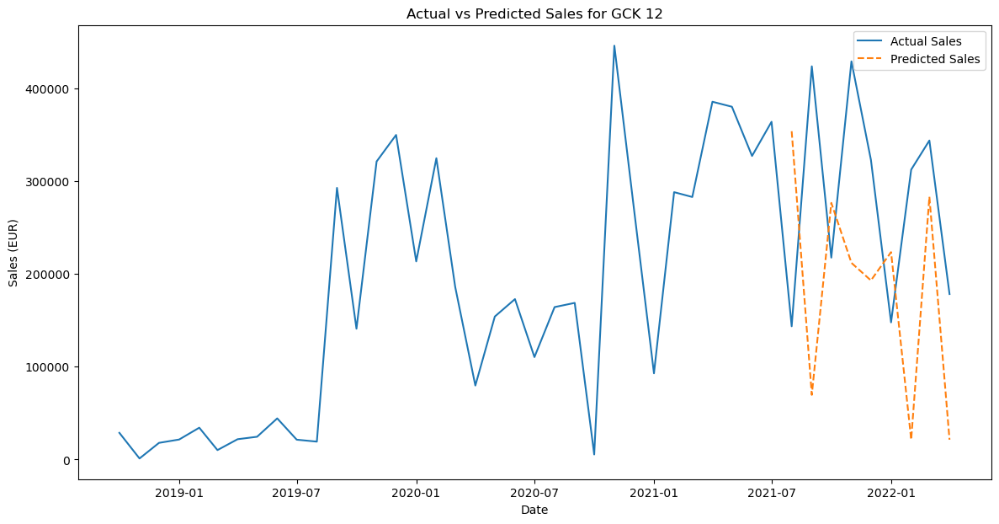

In [262]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck12.index, df_gck12['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck12.index[-len(y12_test):], y12_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 12')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [263]:
#apply the Random Forest model to the GCK 12 data
model12_RF = RandomForestRegressor(random_state = 42)

model12_RF.fit(X12_train, y12_train)

y12_pred_RF = model12_RF.predict(X12_test)

rmse12_RF = mean_squared_error(y12_test, y12_pred_RF, squared=False)

rmse12_RF

101403.74632722221

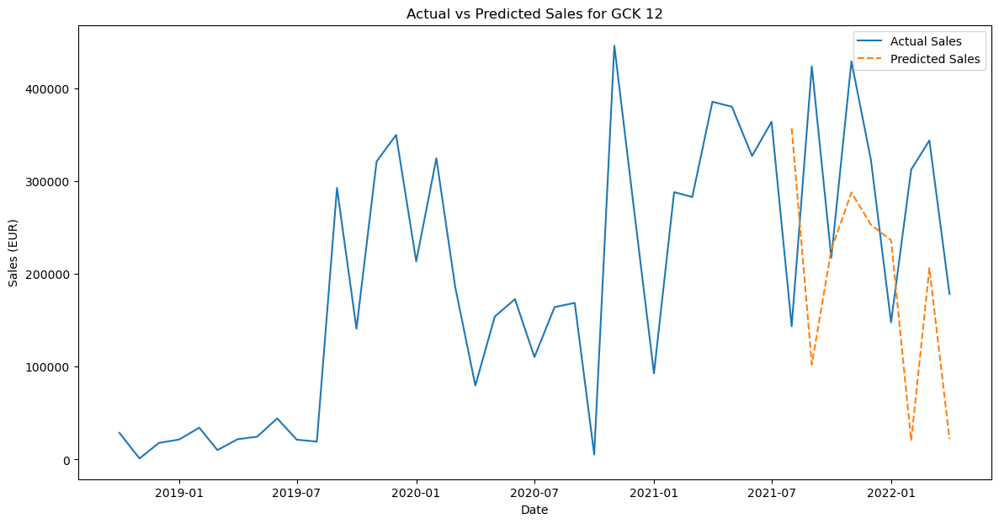

In [264]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck12.index, df_gck12['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck12.index[-len(y12_test):], y12_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 12')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [265]:
#apply the a linear regression model to the GCK 12 data
from sklearn.linear_model import LinearRegression

model12_LR = LinearRegression()

model12_LR.fit(X12_train, y12_train)

y12_pred_LR = model12_LR.predict(X12_test)

rmse12_LR = mean_squared_error(y12_test, y12_pred_LR, squared=False)

rmse12_LR

82851.78045063751

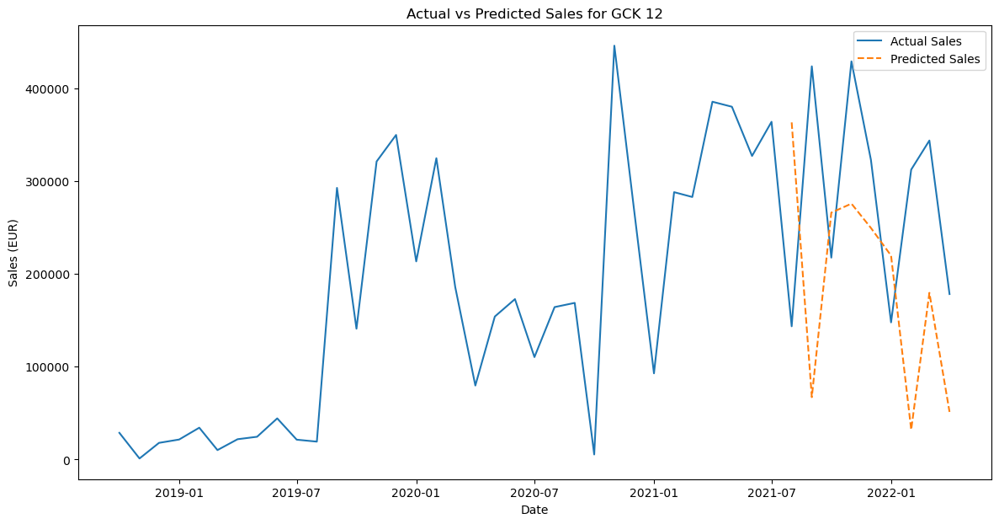

In [266]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck12.index, df_gck12['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck12.index[-len(y12_test):], y12_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 12')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [267]:
#make a knn model
model12_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model12_KNN.fit(X12_train, y12_train)

y12_pred_KNN = model12_KNN.predict(X12_test)

rmse12_KNN = mean_squared_error(y12_test, y12_pred_KNN, squared=False)

rmse12_KNN

109293.23298807711

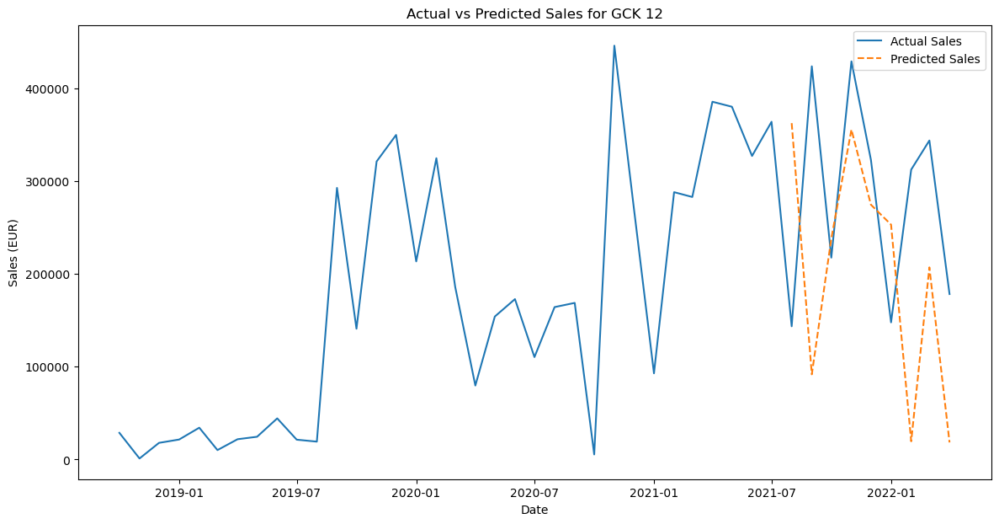

In [268]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck12.index, df_gck12['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck12.index[-len(y12_test):], y12_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 12')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [269]:
#Make an ensemble model that runs these 4 models and selects the best one
model12_ensemble = VotingRegressor(estimators=[
    ('xgb', model12),
    ('rf', model12_RF),
    ('lr', model12_LR),
    ('knn', model12_KNN)
])

model12_ensemble.fit(X12_train, y12_train)

y12_pred_ensemble = model12_ensemble.predict(X12_test)

rmse12_ensemble = mean_squared_error(y12_test, y12_pred_ensemble, squared=False)

rmse12_ensemble

92082.75473812183

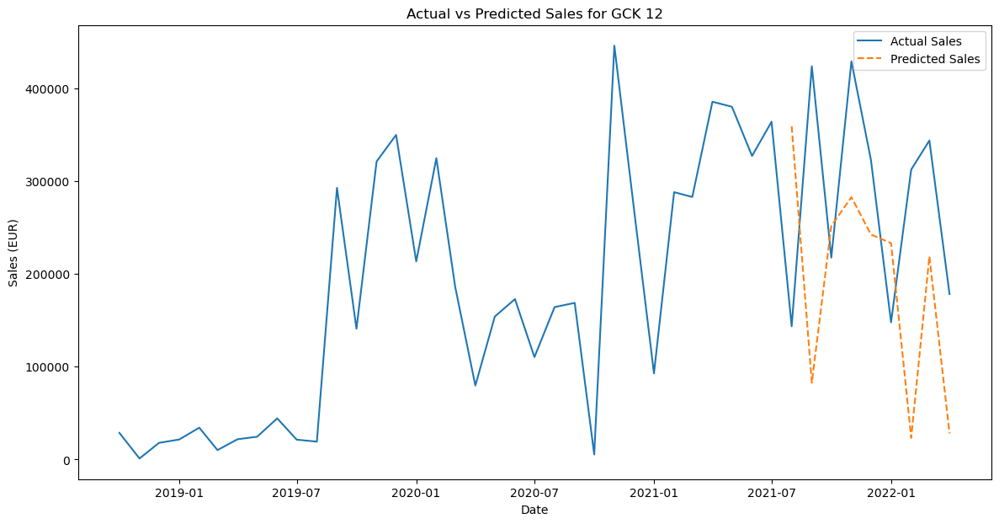

In [270]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck12.index, df_gck12['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck12.index[-len(y12_test):], y12_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 12')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [271]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']

rmse_values = [rmse12, rmse12_RF, rmse12_LR, rmse12_KNN, rmse12_ensemble]

rmse_table12 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table12

,Model,RMSE
0,XGBoost,86605.540938
1,Random Forest,101403.746327
2,Linear Regression,82851.780451
3,KNN,109293.232988
4,Ensemble,92082.754738


In [272]:
#Create a future DataFrame for the GCK 12 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df12 = pd.DataFrame(index=future_dates, columns=df_gck12_filtered.columns)

#Join the future DataFrame with the df_gck12_filtered DataFrame
final_df12 = pd.concat([df_gck12_filtered, future_df12])

final_df12

,MACD Histogram,World: Price of Energy,Italy:Shipments Index Machinery & Electricals,MACD,12 Month EMA,Sales_EUR_Lag_6,UK:Production Index Machinery & Electricals,Sales_EUR
2018-10-01,0.000000,100.222169,122.456894,0.000000,28686.330000,28686.33,113.659322,28686.33
2018-11-01,-275.376510,84.436807,120.132032,-619.597147,13727.484583,28686.33,115.088417,1070.00
2018-12-01,44.868151,74.898746,131.936099,-268.194048,15348.446490,28686.33,101.556108,17880.60
2019-01-01,225.726655,76.204771,92.418842,28.303111,17285.200953,28686.33,101.799754,21484.00
2019-02-01,627.232113,80.086039,103.214212,695.404823,21884.896206,28686.33,103.495768,34214.74
2019-03-01,-11.088190,82.223201,122.454318,52.961412,19024.921374,28686.33,120.754768,10118.00
2019-04-01,79.032154,86.426732,106.279804,169.859391,19647.131614,28686.33,106.691164,21813.27
2019-05-01,213.427247,85.175773,123.261639,371.770412,20653.172542,1070.00,109.719699,24468.00
2019-06-01,1022.247421,76.339272,121.312004,1487.672184,25322.588600,17880.60,111.546958,44255.68
2019-07-01,473.878714,77.038422,123.572862,1076.138894,24563.811577,21484.00,110.593756,21318.48


In [273]:
#Separate the target variable and the features from the final_df DataFrame
y_final12 = final_df12['Sales_EUR']
X_final12 = final_df12.drop('Sales_EUR', axis=1)

In [274]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final12.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df12[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [275]:
final_df12

,MACD Histogram,World: Price of Energy,Italy:Shipments Index Machinery & Electricals,MACD,12 Month EMA,Sales_EUR_Lag_6,UK:Production Index Machinery & Electricals,Sales_EUR
2018-10-01,0.000000,100.222169,122.456894,0.000000,28686.330000,28686.330000,113.659322,28686.33
2018-11-01,-275.376510,84.436807,120.132032,-619.597147,13727.484583,28686.330000,115.088417,1070.00
2018-12-01,44.868151,74.898746,131.936099,-268.194048,15348.446490,28686.330000,101.556108,17880.60
2019-01-01,225.726655,76.204771,92.418842,28.303111,17285.200953,28686.330000,101.799754,21484.00
2019-02-01,627.232113,80.086039,103.214212,695.404823,21884.896206,28686.330000,103.495768,34214.74
2019-03-01,-11.088190,82.223201,122.454318,52.961412,19024.921374,28686.330000,120.754768,10118.00
2019-04-01,79.032154,86.426732,106.279804,169.859391,19647.131614,28686.330000,106.691164,21813.27
2019-05-01,213.427247,85.175773,123.261639,371.770412,20653.172542,1070.000000,109.719699,24468.00
2019-06-01,1022.247421,76.339272,121.312004,1487.672184,25322.588600,17880.600000,111.546958,44255.68
2019-07-01,473.878714,77.038422,123.572862,1076.138894,24563.811577,21484.000000,110.593756,21318.48


In [276]:
#Split the target and features
y12_final = final_df12['Sales_EUR']
X12_final = final_df12.drop('Sales_EUR', axis=1)

#Train test split
X12_final_train = X12_final.loc['2018-01-01':'2022-04-01']
y12_final_train = y12_final.loc['2018-01-01':'2022-04-01']
X12_final_test = X12_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X12_final12_train_scaled = scaler.fit_transform(X12_final_train)

X12_final12_test_scaled = scaler.transform(X12_final_test)

#Apply the LR model to the final data

model12_LR.fit(X12_final12_train_scaled, y12_final_train)

y12_final_pred = model12_LR.predict(X12_final12_test_scaled)

y12_final_pred

array([250257.06123132, 250180.01168214, 230934.81630875, 154934.80198661,
       254829.60756989, 206003.3700108 , 356847.71558122, 377176.56238728,
       247379.43417293, 300774.95632373])

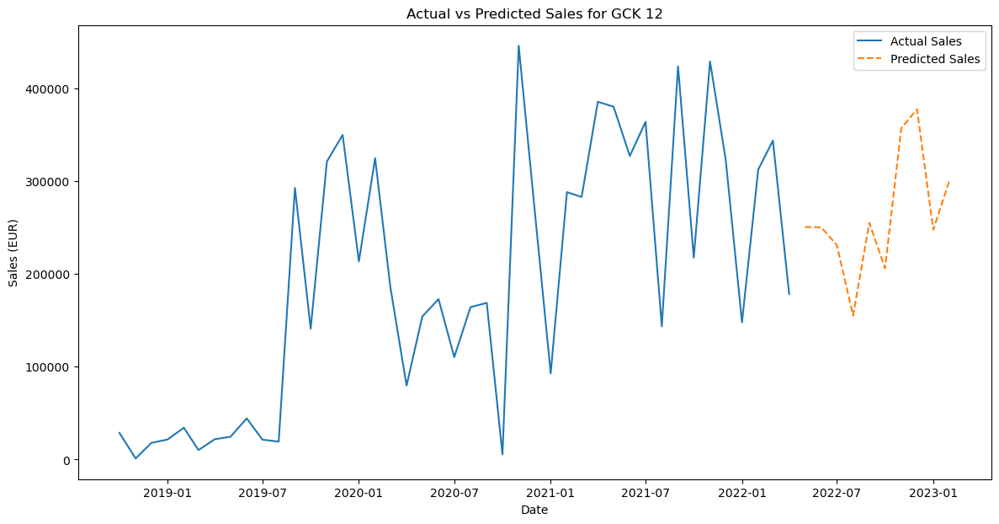

In [277]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df12.index, final_df12['Sales_EUR'], label='Actual Sales')
plt.plot(final_df12.index[-len(y12_final_pred):], y12_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 12')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 13

In [278]:
# Set Date to datetime
df_gck13['Date'] = pd.to_datetime(df_gck13['Date'])
df_gck13.set_index('Date', inplace=True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\2088532301.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck13['Date'] = pd.to_datetime(df_gck13['Date'])


In [279]:
# Check the correlation of the features with the target
correlation = df_gck13.corr()['Sales_EUR'].sort_values(ascending=False)

correlation

Sales_EUR                                                    1.000000
MACD Histogram                                               0.714500
MACD                                                         0.655205
12 Month EMA                                                 0.571370
26 Month EMA                                                 0.480340
                                                               ...   
production index: Switzerland: Electrical equipment_lag_5   -0.240871
during_covid                                                -0.245473
production index: Switzerland: Electrical equipment_lag_6   -0.259841
China:Production Index Machinery & Electricals_lag_2        -0.299357
Mapped_GCK                                                        NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [280]:
# Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}

for feature in market_features:
    correlation_with_target[feature] = df_gck13[feature].corr(df_gck13['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]

        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_2', 'France:Production Index Machinery & Electricals_lag_1', 'France:Shipments Index Machinery & Electricals_lag_1', 'Germany:Production Index Machinery & Electricals_lag_1', 'Germany:Shipments Index Machinery & Electricals_lag_1', 'Italy:Production Index Machinery & Electricals_lag_5', 'Italy:Shipments Index Machinery & Electricals_lag_4', 'Japan:Production Index Machinery & Electricals_lag_1', 'Switzerland:Production Index Machinery & Electricals', 'UK:Production Index Machinery & Electricals_lag_1', 'UK:Shipments Index Machinery & Electricals_lag_1', 'US:Production Index Machinery & Electricals_lag_5', 'US:Shipments Index Machinery & Electricals_lag_6', 'Europe:Production Index Machinery & Electricals_lag_1', 'Europe:Shipments Index Machinery & Electricals_lag_1', 'World: Price of Energy_lag_3', 'World: Price of Metals & Minerals_lag_1', 'World: Price of Natural gas index_lag_2', 'United States: EUR in LCU_lag_4

In [281]:
# Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck13 = df_gck13.drop(features_to_remove, axis=1)

# Create a list with the pairs features that are highly correlated (0.95) in df_gck13
correlated_features = set()

correlation_matrix = df_gck13.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA',
 'production index: France: Electrical equipment_lag_1',
 'production index: Italy: Electrical equipment_lag_5'}

In [282]:
to_drop = ['26 Month EMA',
 'production index: France: Electrical equipment_lag_1',
 'production index: Italy: Electrical equipment_lag_5']

df_gck13 = df_gck13.drop(to_drop, axis=1)

In [283]:
# target and features
X_FI13 = df_gck13.drop('Sales_EUR', axis=1)
y_FI13 = df_gck13['Sales_EUR']
#train test split
X_train_FI13, X_test_FI13, y_train_FI13, y_test_FI13 = train_test_split(X_FI13, y_FI13, test_size=0.2, random_state=42)

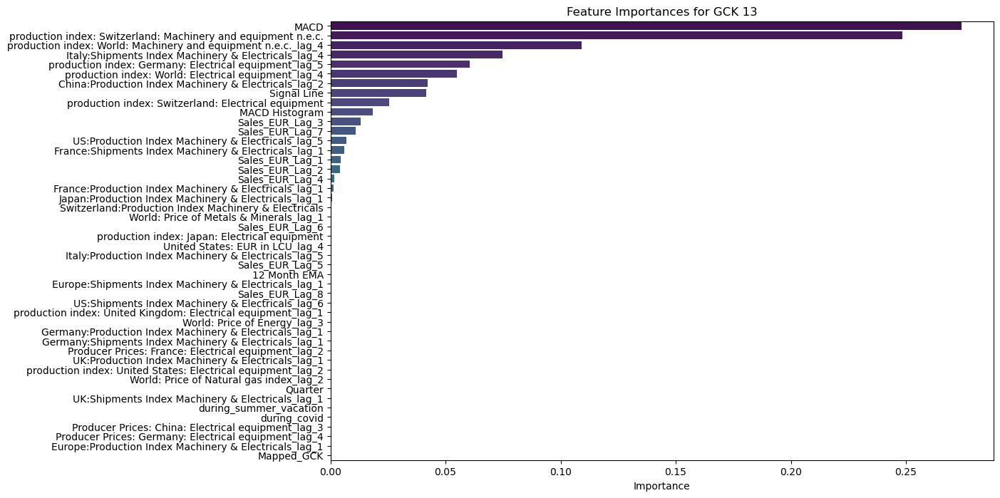

In [284]:
# Apply the XGBoost model to the GCK 13 data to see the feature importance based on RMSE
model_FI13 = XGBRegressor(objective='reg:squarederror', random_state =42)

model_FI13.fit(X_train_FI13, y_train_FI13)

y_pred_FI13 = model_FI13.predict(X_test_FI13)

rmse_FI13 = mean_squared_error(y_test_FI13, y_pred_FI13, squared=False)

# Get the feature importances

importances_FI13 = model_FI13.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_FI13 = pd.DataFrame(importances_FI13, index=X_FI13.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_FI13 = feature_importances_FI13.sort_values(by='Importance', ascending=False)

# Plot the feature importances

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI13['Importance'], y=feature_importances_FI13.index, palette='viridis')

plt.title('Feature Importances for GCK 13')
plt.show()

In [285]:
# Get a list of the features with importance greater than 0.01
important_features_FI13 = feature_importances_FI13[feature_importances_FI13['Importance'] > 0.01].index

important_features_FI13

Index(['MACD', 'production index: Switzerland: Machinery and equipment n.e.c.',
       'production index: World: Machinery and equipment n.e.c._lag_4',
       'Italy:Shipments Index Machinery & Electricals_lag_4',
       'production index: Germany: Electrical equipment_lag_5',
       'production index: World: Electrical equipment_lag_4',
       'China:Production Index Machinery & Electricals_lag_2', 'Signal Line',
       'production index: Switzerland: Electrical equipment', 'MACD Histogram',
       'Sales_EUR_Lag_3', 'Sales_EUR_Lag_7'],
      dtype='object')

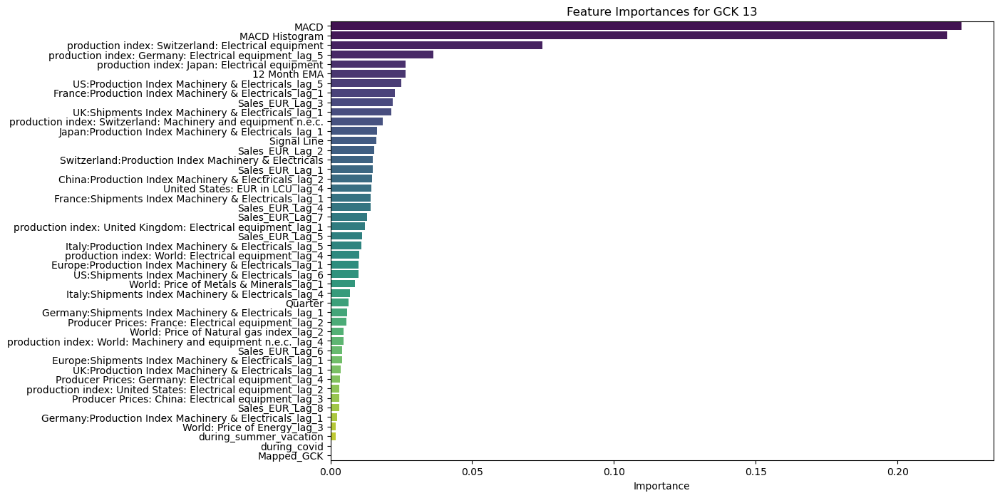

In [286]:
# Do the same with Random Forest model

model_RF13 = RandomForestRegressor(random_state = 42)

model_RF13.fit(X_train_FI13, y_train_FI13)

y_pred_RF13 = model_RF13.predict(X_test_FI13)

rmse_RF13 = mean_squared_error(y_test_FI13, y_pred_RF13, squared=False)

# Get the feature importances

importances_RF13 = model_RF13.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_RF13 = pd.DataFrame(importances_RF13, index=X_FI13.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_RF13 = feature_importances_RF13.sort_values(by='Importance', ascending=False)

# Plot the feature importances

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF13['Importance'], y=feature_importances_RF13.index, palette='viridis')
plt.title('Feature Importances for GCK 13')
plt.show()

In [287]:
# Get a list of the features with importance greater than 0.01
important_features_RF13 = feature_importances_RF13[feature_importances_RF13['Importance'] > 0.01].index

important_features_RF13

Index(['MACD', 'MACD Histogram',
       'production index: Switzerland: Electrical equipment',
       'production index: Germany: Electrical equipment_lag_5',
       'production index: Japan: Electrical equipment', '12 Month EMA',
       'US:Production Index Machinery & Electricals_lag_5',
       'France:Production Index Machinery & Electricals_lag_1',
       'Sales_EUR_Lag_3', 'UK:Shipments Index Machinery & Electricals_lag_1',
       'production index: Switzerland: Machinery and equipment n.e.c.',
       'Japan:Production Index Machinery & Electricals_lag_1', 'Signal Line',
       'Sales_EUR_Lag_2',
       'Switzerland:Production Index Machinery & Electricals',
       'Sales_EUR_Lag_1',
       'China:Production Index Machinery & Electricals_lag_2',
       'United States: EUR in LCU_lag_4',
       'France:Shipments Index Machinery & Electricals_lag_1',
       'Sales_EUR_Lag_4', 'Sales_EUR_Lag_7',
       'production index: United Kingdom: Electrical equipment_lag_1',
       'Sales_EUR_

In [288]:
# Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck13 = list(set(important_features_FI13).intersection(important_features_RF13))

important_features_gck13

['MACD Histogram',
 'production index: World: Electrical equipment_lag_4',
 'production index: Switzerland: Electrical equipment',
 'China:Production Index Machinery & Electricals_lag_2',
 'Signal Line',
 'production index: Switzerland: Machinery and equipment n.e.c.',
 'MACD',
 'production index: Germany: Electrical equipment_lag_5',
 'Sales_EUR_Lag_7',
 'Sales_EUR_Lag_3']

In [289]:
# Filter the df_gck13 DataFrame to only include the important features and the target variable
df_gck13_filtered = df_gck13[important_features_gck13 + ['Sales_EUR']]
df_gck13_filtered

# Make a df for the target variable and the features
y13 = df_gck13_filtered['Sales_EUR']
X13 = df_gck13_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X13_scaled = scaler.fit_transform(X13)

# Split the data into train and test
X13_train, X13_test, y13_train, y13_test = train_test_split(X13_scaled, y13, test_size=0.2, random_state=42)

In [290]:
# Apply the XGBoost model to the GCK 13 data~
model13 = XGBRegressor(objective='reg:squarederror', random_State =42)

model13.fit(X13_train, y13_train)

y13_pred = model13.predict(X13_test)

rmse13 = mean_squared_error(y13_test, y13_pred, squared=False)

rmse13

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\xgboost\core.py:160: UserWarning: [16:51:14] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "random_State" } are not used.

  warnings.warn(smsg, UserWarning)


12082.976010960987

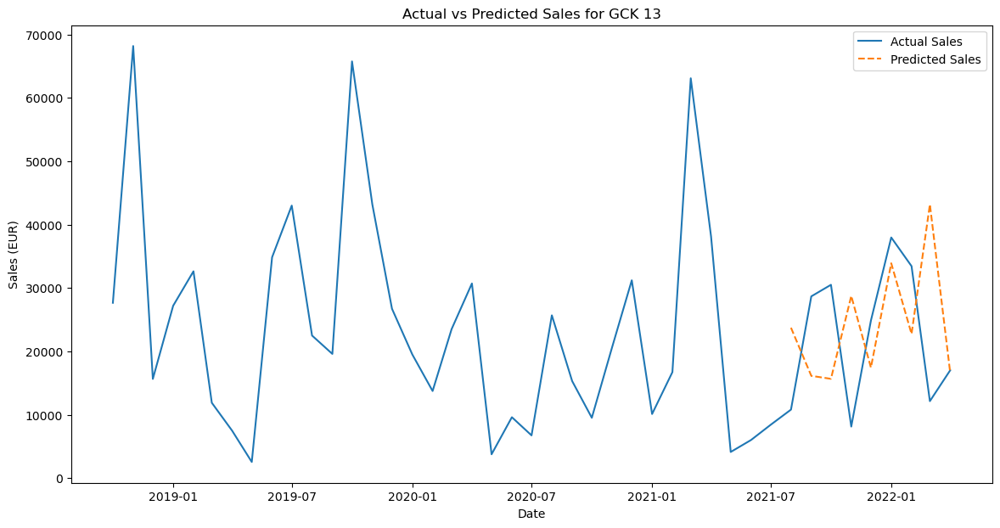

In [291]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck13.index, df_gck13['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck13.index[-len(y13_test):], y13_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 13')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')

plt.legend()
plt.show()

In [292]:
#apply the Random Forest model to the GCK 13 data
model13_RF = RandomForestRegressor(random_state = 42)

model13_RF.fit(X13_train, y13_train)

y13_pred_RF = model13_RF.predict(X13_test)

rmse13_RF = mean_squared_error(y13_test, y13_pred_RF, squared=False)

rmse13_RF

12515.281895819458

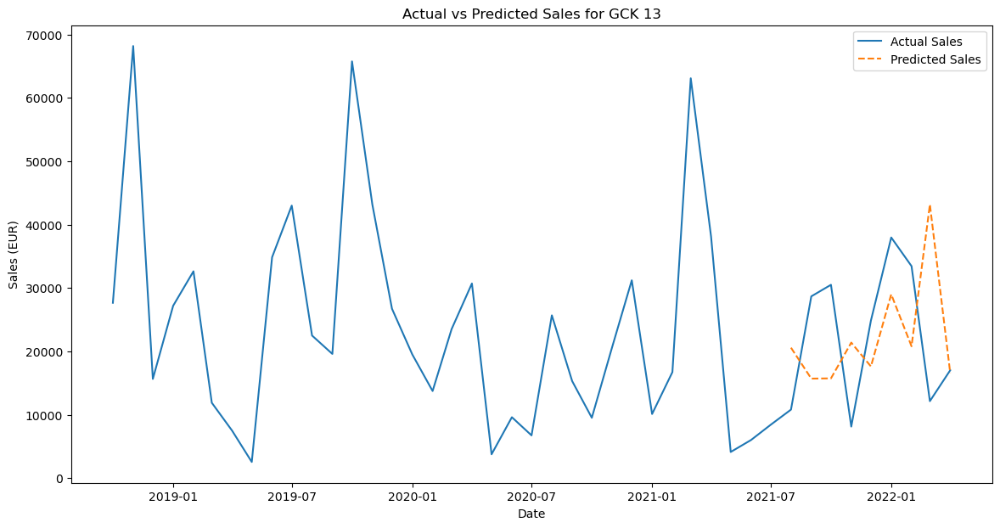

In [293]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck13.index, df_gck13['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck13.index[-len(y13_test):], y13_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 13')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [294]:
#apply the a linear regression model to the GCK 13 data
model13_LR = LinearRegression()

model13_LR.fit(X13_train, y13_train)

y13_pred_LR = model13_LR.predict(X13_test)

rmse13_LR = mean_squared_error(y13_test, y13_pred_LR, squared=False)

rmse13_LR


11282.36489521794

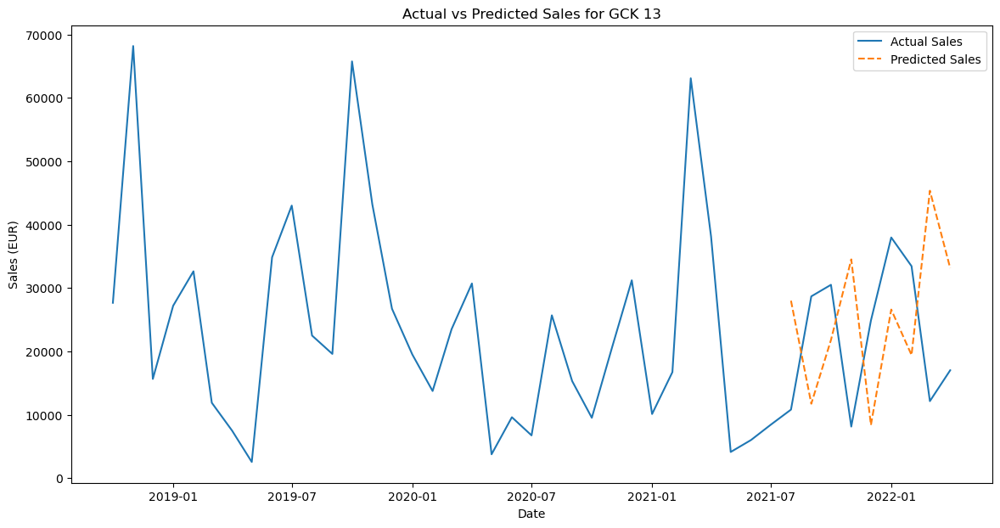

In [295]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck13.index, df_gck13['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck13.index[-len(y13_test):], y13_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 13')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [296]:
#make a knn model
model13_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model13_KNN.fit(X13_train, y13_train)

y13_pred_KNN = model13_KNN.predict(X13_test)

rmse13_KNN = mean_squared_error(y13_test, y13_pred_KNN, squared=False)

rmse13_KNN

16008.795775459372

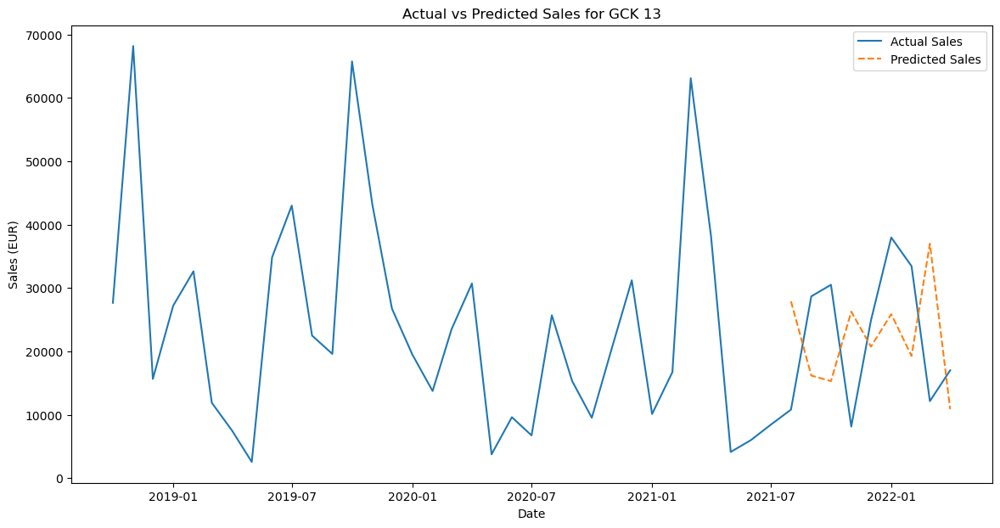

In [297]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck13.index, df_gck13['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck13.index[-len(y13_test):], y13_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 13')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [298]:
#Make an ensemble model that runs these 4 models and selects the best one
model13_ensemble = VotingRegressor(estimators=[
    ('xgb', model13),
    ('rf', model13_RF),
    ('lr', model13_LR),
    ('knn', model13_KNN)
])

model13_ensemble.fit(X13_train, y13_train)

y13_pred_ensemble = model13_ensemble.predict(X13_test)

rmse13_ensemble = mean_squared_error(y13_test, y13_pred_ensemble, squared=False)

rmse13_ensemble

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\xgboost\core.py:160: UserWarning: [16:51:16] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "random_State" } are not used.

  warnings.warn(smsg, UserWarning)


12424.13429302243

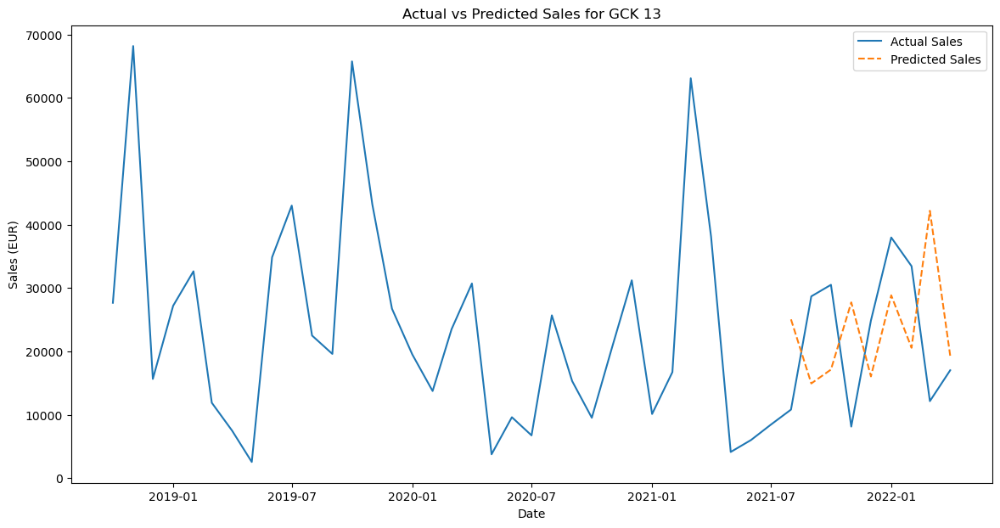

In [299]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck13.index, df_gck13['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck13.index[-len(y13_test):], y13_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 13')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [300]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']

rmse_values = [rmse13, rmse13_RF, rmse13_LR, rmse13_KNN, rmse13_ensemble]

rmse_table13 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table13

,Model,RMSE
0,XGBoost,12082.976011
1,Random Forest,12515.281896
2,Linear Regression,11282.364895
3,KNN,16008.795775
4,Ensemble,12424.134293


In [301]:
#Create a future DataFrame for the GCK 13 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df13 = pd.DataFrame(index=future_dates, columns=df_gck13_filtered.columns)

#Join the future DataFrame with the df_gck13_filtered DataFrame
final_df13 = pd.concat([df_gck13_filtered, future_df13])

final_df13

,MACD Histogram,production index: World: Electrical equipment_lag_4,production index: Switzerland: Electrical equipment,China:Production Index Machinery & Electricals_lag_2,Signal Line,production index: Switzerland: Machinery and equipment n.e.c.,MACD,production index: Germany: Electrical equipment_lag_5,Sales_EUR_Lag_7,Sales_EUR_Lag_3,Sales_EUR
2018-10-01,0.000000,126.296242,112.970843,197.528665,0.000000,106.816937,0.000000,106.746880,27666.10,27666.10,27666.10
2018-11-01,403.984758,121.935760,114.736013,199.419203,504.980947,110.792831,908.965705,116.751183,27666.10,27666.10,68180.00
2018-12-01,-575.746080,117.507843,116.501182,211.955755,105.157281,114.768725,-470.588799,111.181778,27666.10,27666.10,15655.18
2019-01-01,-512.401313,126.344688,110.354610,220.519655,-157.343392,109.196212,-669.744705,111.284912,27666.10,27666.10,27198.29
2019-02-01,-274.009243,129.325775,104.208038,241.846854,-273.370341,103.623699,-547.379585,110.872368,27666.10,68180.00,32638.63
2019-03-01,-785.354392,128.236176,98.061466,175.668147,-565.401812,98.051186,-1350.756204,118.298233,27666.10,15655.18,11890.00
2019-04-01,-1102.982811,117.043549,95.539795,175.668147,-939.113895,97.988573,-2042.096706,117.163727,27666.10,27198.29,7488.54
2019-05-01,-1343.553103,111.522202,93.018125,261.642802,-1364.135704,97.925961,-2707.688808,89.626122,27666.10,32638.63,2550.31
2019-06-01,-123.653233,112.666725,90.496454,219.595813,-1401.280951,97.863348,-1524.934184,105.406097,68180.00,11890.00,34849.21
2019-07-01,898.400468,131.456177,97.557132,234.169196,-1141.862245,98.113798,-243.461777,103.652771,15655.18,7488.54,43008.35


In [302]:
#Separate the target variable and the features from the final_df DataFrame
y_final13 = final_df13['Sales_EUR']
X_final13 = final_df13.drop('Sales_EUR', axis=1)

In [303]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final13.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df13[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

In [304]:
final_df13

,MACD Histogram,production index: World: Electrical equipment_lag_4,production index: Switzerland: Electrical equipment,China:Production Index Machinery & Electricals_lag_2,Signal Line,production index: Switzerland: Machinery and equipment n.e.c.,MACD,production index: Germany: Electrical equipment_lag_5,Sales_EUR_Lag_7,Sales_EUR_Lag_3,Sales_EUR
2018-10-01,0.000000,126.296242,112.970843,197.528665,0.000000,106.816937,0.000000,106.746880,27666.100000,27666.100000,27666.10
2018-11-01,403.984758,121.935760,114.736013,199.419203,504.980947,110.792831,908.965705,116.751183,27666.100000,27666.100000,68180.00
2018-12-01,-575.746080,117.507843,116.501182,211.955755,105.157281,114.768725,-470.588799,111.181778,27666.100000,27666.100000,15655.18
2019-01-01,-512.401313,126.344688,110.354610,220.519655,-157.343392,109.196212,-669.744705,111.284912,27666.100000,27666.100000,27198.29
2019-02-01,-274.009243,129.325775,104.208038,241.846854,-273.370341,103.623699,-547.379585,110.872368,27666.100000,68180.000000,32638.63
2019-03-01,-785.354392,128.236176,98.061466,175.668147,-565.401812,98.051186,-1350.756204,118.298233,27666.100000,15655.180000,11890.00
2019-04-01,-1102.982811,117.043549,95.539795,175.668147,-939.113895,97.988573,-2042.096706,117.163727,27666.100000,27198.290000,7488.54
2019-05-01,-1343.553103,111.522202,93.018125,261.642802,-1364.135704,97.925961,-2707.688808,89.626122,27666.100000,32638.630000,2550.31
2019-06-01,-123.653233,112.666725,90.496454,219.595813,-1401.280951,97.863348,-1524.934184,105.406097,68180.000000,11890.000000,34849.21
2019-07-01,898.400468,131.456177,97.557132,234.169196,-1141.862245,98.113798,-243.461777,103.652771,15655.180000,7488.540000,43008.35


In [305]:
#Split the target and features
y13_final = final_df13['Sales_EUR']
X13_final = final_df13.drop('Sales_EUR', axis=1)

#Train test split
X13_final_train = X13_final.loc['2018-01-01':'2022-04-01']
y13_final_train = y13_final.loc['2018-01-01':'2022-04-01']
X13_final_test = X13_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X13_final13_train_scaled = scaler.fit_transform(X13_final_train)

X13_final13_test_scaled = scaler.transform(X13_final_test)

#Apply the LR model to the final data

model13.fit(X13_final13_train_scaled, y13_final_train)

y13_final_pred = model13.predict(X13_final13_test_scaled)

y13_final_pred

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\xgboost\core.py:160: UserWarning: [16:51:41] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\learner.cc:742: 
Parameters: { "random_State" } are not used.

  warnings.warn(smsg, UserWarning)


array([ 8229.069, 10132.354, 23919.754, 24155.857, 15579.166, 19380.434,
       19177.65 , 20269.842, 20926.115, 21288.357], dtype=float32)

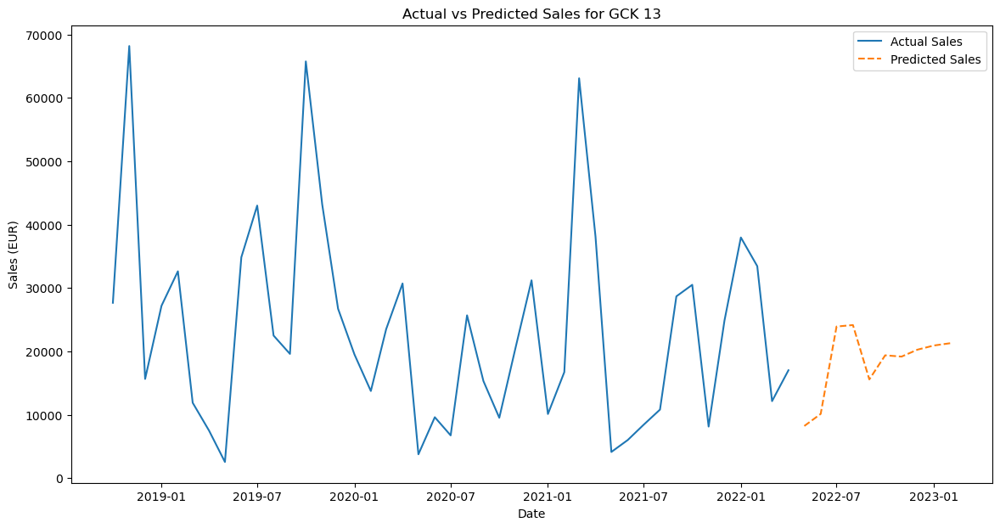

In [306]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df13.index, final_df13['Sales_EUR'], label='Actual Sales')
plt.plot(final_df13.index[-len(y13_final_pred):], y13_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 13')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 14

In [307]:
#Set Date to datetime
df_gck14['Date'] = pd.to_datetime(df_gck14['Date'])
df_gck14.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\3570536982.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck14['Date'] = pd.to_datetime(df_gck14['Date'])


In [308]:
#Check the correlation of the features with the target
correlation = df_gck14.corr()['Sales_EUR'].sort_values(ascending=False)
correlation

Sales_EUR                                                    1.000000
MACD Histogram                                               0.802458
MACD                                                         0.688185
12 Month EMA                                                 0.582756
26 Month EMA                                                 0.466244
                                                               ...   
China:Production Index Machinery & Electricals_lag_5        -0.217165
Sales_EUR_Lag_6                                             -0.277148
production index: Switzerland: Electrical equipment         -0.307169
production index: Switzerland: Electrical equipment_lag_1   -0.315482
Mapped_GCK                                                        NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [309]:
# Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}

for feature in market_features:
    correlation_with_target[feature] = df_gck14[feature].corr(df_gck14['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]

        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_5', 'France:Production Index Machinery & Electricals', 'France:Shipments Index Machinery & Electricals_lag_3', 'Germany:Production Index Machinery & Electricals_lag_2', 'Germany:Shipments Index Machinery & Electricals_lag_3', 'Italy:Production Index Machinery & Electricals', 'Italy:Shipments Index Machinery & Electricals', 'Japan:Production Index Machinery & Electricals_lag_4', 'Switzerland:Production Index Machinery & Electricals_lag_6', 'UK:Production Index Machinery & Electricals_lag_4', 'UK:Shipments Index Machinery & Electricals_lag_3', 'US:Production Index Machinery & Electricals_lag_4', 'US:Shipments Index Machinery & Electricals_lag_3', 'Europe:Production Index Machinery & Electricals_lag_4', 'Europe:Shipments Index Machinery & Electricals_lag_3', 'World: Price of Energy_lag_5', 'World: Price of Metals & Minerals_lag_2', 'World: Price of Natural gas index_lag_5', 'United States: EUR in LCU_lag_6', 'Producer

In [310]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck14 = df_gck14.drop(features_to_remove, axis=1)

# Create a list with the pairs features that are highly correlated (0.95) in df_gck14
correlated_features = set()
correlation_matrix = df_gck14.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA',
 'Producer Prices: Germany: Electrical equipment_lag_2',
 'production index: Italy: Electrical equipment'}

In [311]:
#Drop the features that are highly correlated
df_gck14 = df_gck14.drop(correlated_features, axis=1)

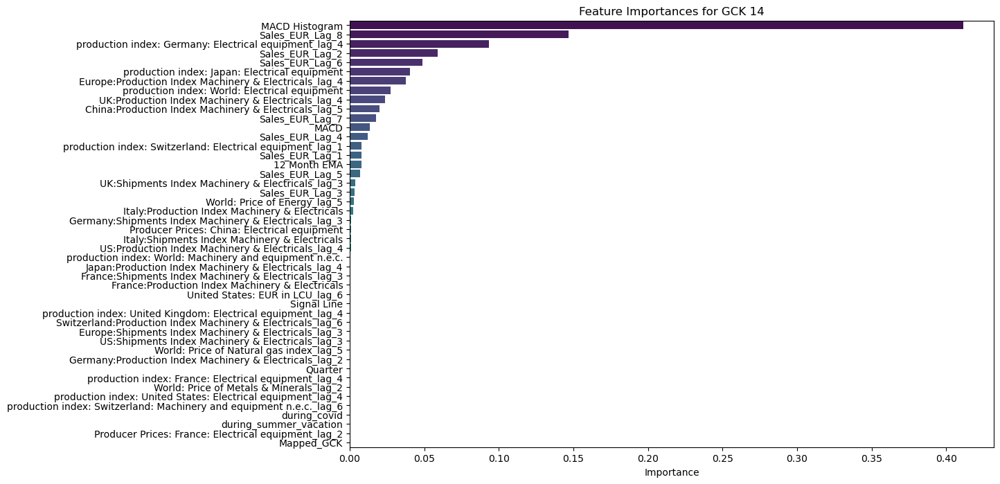

In [312]:
#Target and Features
X_FI14 = df_gck14.drop('Sales_EUR', axis=1)
y_FI14 = df_gck14['Sales_EUR']

#Train test and split
X_train_FI14, X_test_FI14, y_train_FI14, y_test_FI14 = train_test_split(X_FI14, y_FI14, test_size=0.2, random_state=42)

#Apply the XGBoost model to the GCK 14 data to see the feature importance based on RMSE
model_FI14 = XGBRegressor(objective='reg:squarederror', random_state =42)
model_FI14.fit(X_train_FI14, y_train_FI14)

y_pred_FI14 = model_FI14.predict(X_test_FI14)

rmse_FI14 = mean_squared_error(y_test_FI14, y_pred_FI14, squared=False)

# Get the feature importances
importances_FI14 = model_FI14.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI14 = pd.DataFrame(importances_FI14, index=X_FI14.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI14 = feature_importances_FI14.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI14['Importance'], y=feature_importances_FI14.index, palette='viridis')
plt.title('Feature Importances for GCK 14')
plt.show()

In [313]:
# Get a list of the features with importance greater than 0.01
important_features_FI14 = feature_importances_FI14[feature_importances_FI14['Importance'] > 0.01].index

important_features_FI14

Index(['MACD Histogram', 'Sales_EUR_Lag_8',
       'production index: Germany: Electrical equipment_lag_4',
       'Sales_EUR_Lag_2', 'Sales_EUR_Lag_6',
       'production index: Japan: Electrical equipment',
       'Europe:Production Index Machinery & Electricals_lag_4',
       'production index: World: Electrical equipment',
       'UK:Production Index Machinery & Electricals_lag_4',
       'China:Production Index Machinery & Electricals_lag_5',
       'Sales_EUR_Lag_7', 'MACD', 'Sales_EUR_Lag_4'],
      dtype='object')

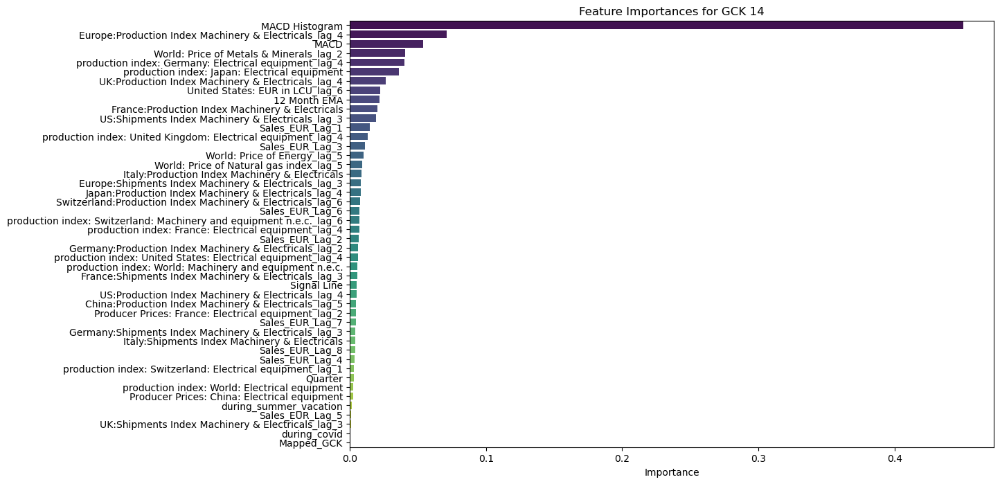

In [314]:
# Do the same with Random Forest model

model_RF14 = RandomForestRegressor(random_state = 42)

model_RF14.fit(X_train_FI14, y_train_FI14)

y_pred_RF14 = model_RF14.predict(X_test_FI14)

rmse_RF14 = mean_squared_error(y_test_FI14, y_pred_RF14, squared=False)

# Get the feature importances

importances_RF14 = model_RF14.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_RF14 = pd.DataFrame(importances_RF14, index=X_FI14.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_RF14 = feature_importances_RF14.sort_values(by='Importance', ascending=False)

# Plot the feature importances

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF14['Importance'], y=feature_importances_RF14.index, palette='viridis')
plt.title('Feature Importances for GCK 14')
plt.show()

In [315]:
#Get a list of the features with importance greater than 0.01
important_features_RF14 = feature_importances_RF14[feature_importances_RF14['Importance'] > 0.01].index

important_features_RF14

Index(['MACD Histogram',
       'Europe:Production Index Machinery & Electricals_lag_4', 'MACD',
       'World: Price of Metals & Minerals_lag_2',
       'production index: Germany: Electrical equipment_lag_4',
       'production index: Japan: Electrical equipment',
       'UK:Production Index Machinery & Electricals_lag_4',
       'United States: EUR in LCU_lag_6', '12 Month EMA',
       'France:Production Index Machinery & Electricals',
       'US:Shipments Index Machinery & Electricals_lag_3', 'Sales_EUR_Lag_1',
       'production index: United Kingdom: Electrical equipment_lag_4',
       'Sales_EUR_Lag_3', 'World: Price of Energy_lag_5'],
      dtype='object')

In [316]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck14 = list(set(important_features_FI14).intersection(important_features_RF14))

important_features_gck14

['MACD Histogram',
 'production index: Japan: Electrical equipment',
 'Europe:Production Index Machinery & Electricals_lag_4',
 'UK:Production Index Machinery & Electricals_lag_4',
 'MACD',
 'production index: Germany: Electrical equipment_lag_4']

In [317]:
#Filter the df_gck14 DataFrame to only include the important features and the target variable
df_gck14_filtered = df_gck14[important_features_gck14 + ['Sales_EUR']]

# Make a df for the target variable and the features
y14 = df_gck14_filtered['Sales_EUR']
X14 = df_gck14_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X14_scaled = scaler.fit_transform(X14)

# Split the data into train and test
X14_train, X14_test, y14_train, y14_test = train_test_split(X14_scaled, y14, test_size=0.2, random_state=42)


In [318]:
# Apply the XGBoost model to the GCK 14 data
model14 = XGBRegressor(objective='reg:squarederror', random_state = 42)

model14.fit(X14_train, y14_train)

y14_pred = model14.predict(X14_test)

rmse14 = mean_squared_error(y14_test, y14_pred, squared=False)

rmse14

18255.173834000925

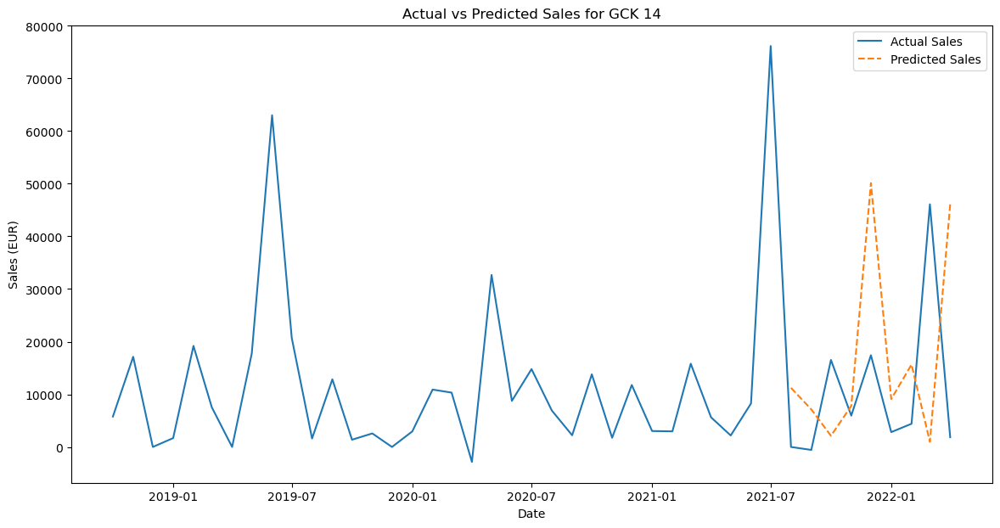

In [319]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck14.index, df_gck14['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck14.index[-len(y14_test):], y14_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 14')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()


In [320]:
#apply the Random Forest model to the GCK 14 data
model14_RF = RandomForestRegressor(random_state = 42)

model14_RF.fit(X14_train, y14_train)

y14_pred_RF = model14_RF.predict(X14_test)

rmse14_RF = mean_squared_error(y14_test, y14_pred_RF, squared=False)

rmse14_RF

15514.196463154116

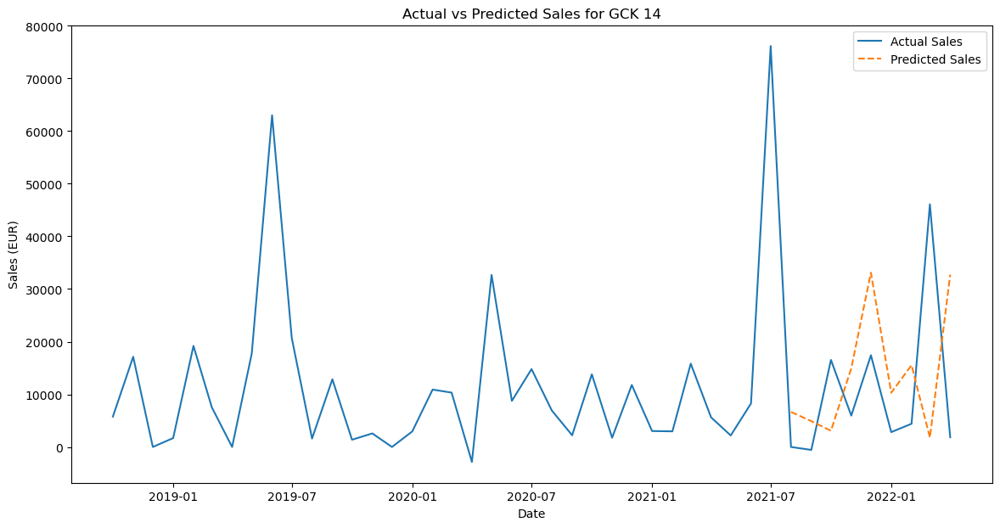

In [321]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck14.index, df_gck14['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck14.index[-len(y14_test):], y14_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 14')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [322]:
#apply the a linear regression model to the GCK 14 data
model14_LR = LinearRegression()

model14_LR.fit(X14_train, y14_train)

y14_pred_LR = model14_LR.predict(X14_test)

rmse14_LR = mean_squared_error(y14_test, y14_pred_LR, squared=False)

rmse14_LR

14084.547364506165

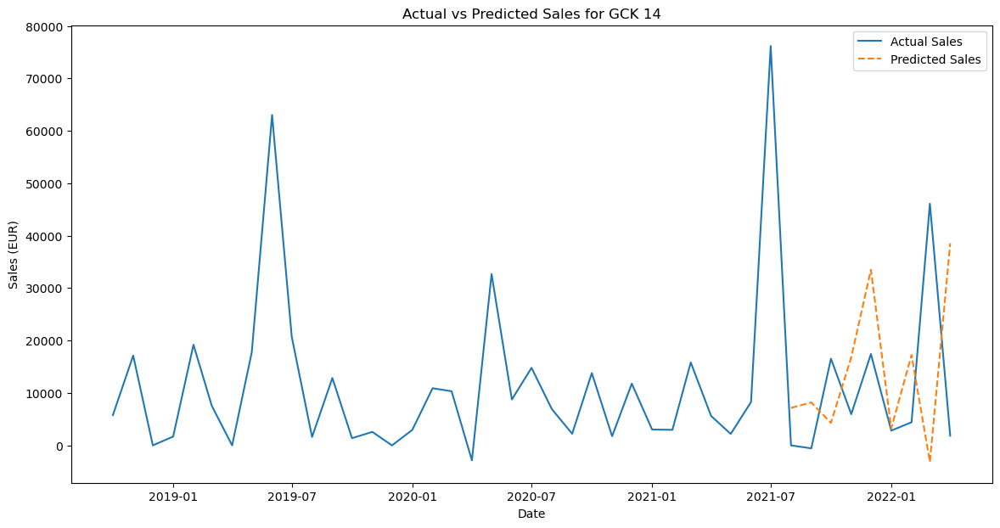

In [323]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck14.index, df_gck14['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck14.index[-len(y14_test):], y14_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 14')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [324]:
#make a knn model
model14_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model14_KNN.fit(X14_train, y14_train)

y14_pred_KNN = model14_KNN.predict(X14_test)

rmse14_KNN = mean_squared_error(y14_test, y14_pred_KNN, squared=False)

rmse14_KNN

16538.52144713724

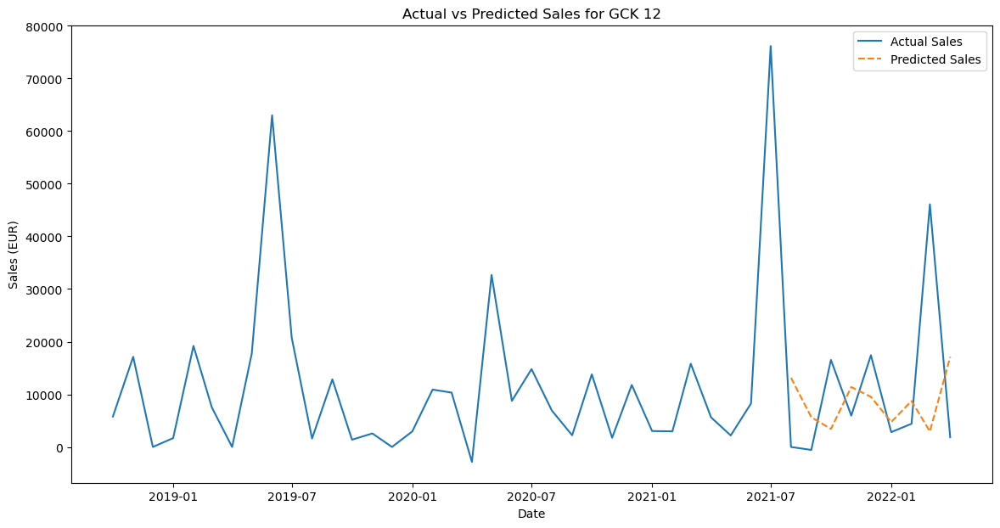

In [325]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck14.index, df_gck14['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck14.index[-len(y14_test):], y14_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 12')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [326]:
#Make an ensemble model that runs these 4 models and selects the best one
model14_ensemble = VotingRegressor(estimators=[
    ('xgb', model14),
    ('rf', model14_RF),
    ('lr', model14_LR),
    ('knn', model14_KNN)
])

model14_ensemble.fit(X14_train, y14_train)

y14_pred_ensemble = model14_ensemble.predict(X14_test)

rmse14_ensemble = mean_squared_error(y14_test, y14_pred_ensemble, squared=False)

rmse14_ensemble

14848.530904827865

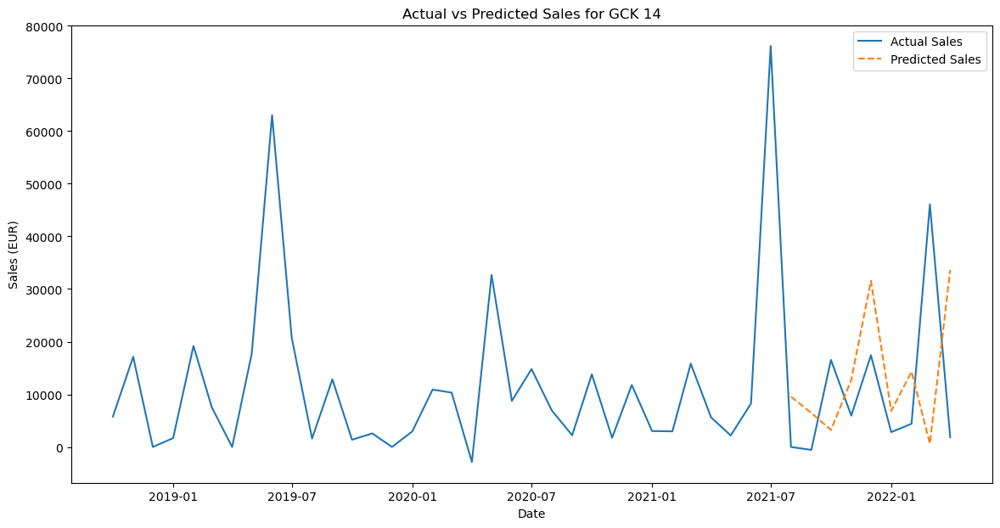

In [327]:
#plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck14.index, df_gck14['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck14.index[-len(y14_test):], y14_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 14')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [328]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']

rmse_values = [rmse14, rmse14_RF, rmse14_LR, rmse14_KNN, rmse14_ensemble]

rmse_table14 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table14

,Model,RMSE
0,XGBoost,18255.173834
1,Random Forest,15514.196463
2,Linear Regression,14084.547365
3,KNN,16538.521447
4,Ensemble,14848.530905


In [329]:
#Create a future DataFrame for the GCK 14 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df14 = pd.DataFrame(index=future_dates, columns=df_gck14_filtered.columns)

#Join the future DataFrame with the df_gck14_filtered DataFrame
final_df14 = pd.concat([df_gck14_filtered, future_df14])

final_df14

,MACD Histogram,production index: Japan: Electrical equipment,Europe:Production Index Machinery & Electricals_lag_4,UK:Production Index Machinery & Electricals_lag_4,MACD,production index: Germany: Electrical equipment_lag_4,Sales_EUR
2018-10-01,0.000000,112.376774,124.095892,111.152096,0.000000,116.751183,5770.00
2018-11-01,113.276353,111.907535,114.045316,106.077526,254.871795,111.181778,17130.00
2018-12-01,-205.399748,112.524242,100.683516,103.659614,-206.443020,111.284912,0.00
2019-01-01,-230.952642,95.957352,116.988080,108.307376,-350.311817,110.872368,1686.40
2019-02-01,277.500203,107.309956,124.391967,113.659322,275.646195,118.298233,19196.30
2019-03-01,109.320739,131.450762,123.070091,115.088417,148.117292,117.163727,7535.25
2019-04-01,-236.309361,101.308407,113.858005,101.556108,-277.579027,89.626122,0.00
2019-05-01,249.111370,101.892947,106.418002,101.799754,286.646006,105.406097,17771.40
2019-06-01,2214.935866,112.251279,110.429590,103.495768,2917.833928,103.652771,63017.71
2019-07-01,1443.419211,114.830812,123.693913,120.754768,2563.113521,111.388054,20719.30


In [330]:
#Separate the target variable and the features from the final_df DataFrame
y_final14 = final_df14['Sales_EUR']
X_final14 = final_df14.drop('Sales_EUR', axis=1)

In [331]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final14.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df14[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [332]:
final_df14

,MACD Histogram,production index: Japan: Electrical equipment,Europe:Production Index Machinery & Electricals_lag_4,UK:Production Index Machinery & Electricals_lag_4,MACD,production index: Germany: Electrical equipment_lag_4,Sales_EUR
2018-10-01,0.000000,112.376774,124.095892,111.152096,0.000000,116.751183,5770.00
2018-11-01,113.276353,111.907535,114.045316,106.077526,254.871795,111.181778,17130.00
2018-12-01,-205.399748,112.524242,100.683516,103.659614,-206.443020,111.284912,0.00
2019-01-01,-230.952642,95.957352,116.988080,108.307376,-350.311817,110.872368,1686.40
2019-02-01,277.500203,107.309956,124.391967,113.659322,275.646195,118.298233,19196.30
2019-03-01,109.320739,131.450762,123.070091,115.088417,148.117292,117.163727,7535.25
2019-04-01,-236.309361,101.308407,113.858005,101.556108,-277.579027,89.626122,0.00
2019-05-01,249.111370,101.892947,106.418002,101.799754,286.646006,105.406097,17771.40
2019-06-01,2214.935866,112.251279,110.429590,103.495768,2917.833928,103.652771,63017.71
2019-07-01,1443.419211,114.830812,123.693913,120.754768,2563.113521,111.388054,20719.30


In [441]:
#Split the target and features
y14_final = final_df14['Sales_EUR']
X14_final = final_df14.drop('Sales_EUR', axis=1)

#Train test split
X14_final_train = X14_final.loc['2018-01-01':'2022-04-01']
y14_final_train = y14_final.loc['2018-01-01':'2022-04-01']
X14_final_test = X14_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X14_final14_train_scaled = scaler.fit_transform(X14_final_train)

X14_final14_test_scaled = scaler.transform(X14_final_test)

#Apply the LR model to the final data

model14_LR.fit(X14_final14_train_scaled, y14_final_train)

y14_final_pred = model14_LR.predict(X14_final14_test_scaled)

y14_final_pred

array([13894.89271333, 17335.70966121, 51166.23431962, 21954.57180566,
       12027.3841372 , 17028.73736782,  8470.59062026, 17663.89999234,
        6455.64415853,   836.23411578])

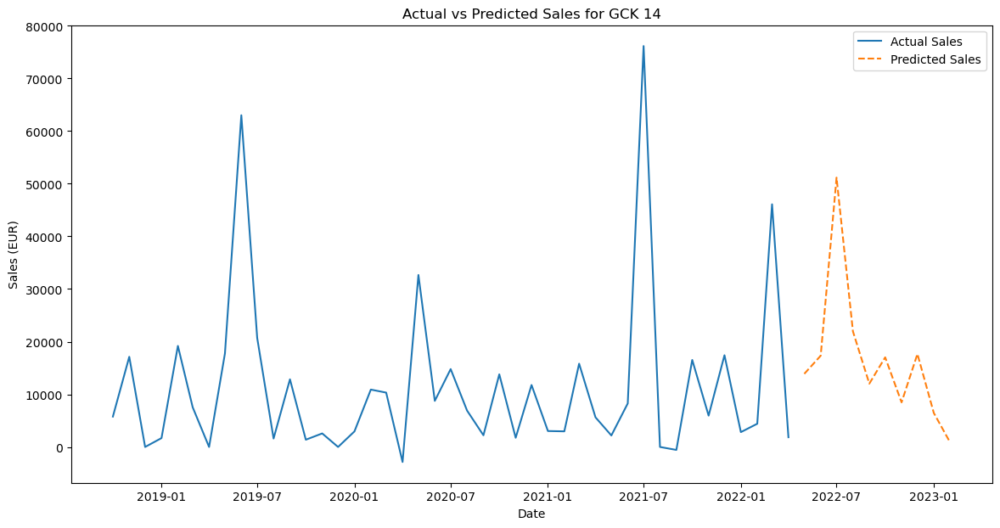

In [442]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df14.index, final_df14['Sales_EUR'], label='Actual Sales')
plt.plot(final_df14.index[-len(y14_final_pred):], y14_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 14')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 16

In [335]:
#Set Date to datetime
df_gck16['Date'] = pd.to_datetime(df_gck16['Date'])
df_gck16.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\1014277870.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck16['Date'] = pd.to_datetime(df_gck16['Date'])


In [336]:
#Check the correlation of the features with the target
correlation = df_gck16.corr()['Sales_EUR'].sort_values(ascending=False)
correlation

Sales_EUR                                               1.000000
12 Month EMA                                            0.743624
26 Month EMA                                            0.704708
MACD                                                    0.679037
Signal Line                                             0.588751
                                                          ...   
Producer Prices: Germany: Electrical equipment_lag_3   -0.340939
Producer Prices: Germany: Electrical equipment_lag_4   -0.357601
Producer Prices: Germany: Electrical equipment_lag_5   -0.369567
Producer Prices: Germany: Electrical equipment_lag_6   -0.403899
Mapped_GCK                                                   NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [337]:
# Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}

for feature in market_features:
    correlation_with_target[feature] = df_gck16[feature].corr(df_gck16['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]

        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_4', 'France:Production Index Machinery & Electricals_lag_6', 'France:Shipments Index Machinery & Electricals_lag_6', 'Germany:Production Index Machinery & Electricals_lag_6', 'Germany:Shipments Index Machinery & Electricals_lag_6', 'Italy:Production Index Machinery & Electricals_lag_6', 'Italy:Shipments Index Machinery & Electricals_lag_4', 'Japan:Production Index Machinery & Electricals_lag_6', 'Switzerland:Production Index Machinery & Electricals', 'UK:Production Index Machinery & Electricals_lag_2', 'UK:Shipments Index Machinery & Electricals_lag_2', 'US:Production Index Machinery & Electricals_lag_6', 'US:Shipments Index Machinery & Electricals_lag_1', 'Europe:Production Index Machinery & Electricals_lag_6', 'Europe:Shipments Index Machinery & Electricals_lag_6', 'World: Price of Energy_lag_6', 'World: Price of Metals & Minerals', 'World: Price of Natural gas index', 'United States: EUR in LCU_lag_1', 'Producer

In [338]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck16 = df_gck16.drop(features_to_remove, axis=1)

# Create a list with the pairs features that are highly correlated (0.95) in df_gck16
correlated_features = set()
correlation_matrix = df_gck16.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA',
 'Europe:Shipments Index Machinery & Electricals_lag_6',
 'Germany:Shipments Index Machinery & Electricals_lag_6',
 'production index: Japan: Electrical equipment_lag_6'}

In [339]:
#Drop the features that are highly correlated
df_gck16 = df_gck16.drop(correlated_features, axis=1)

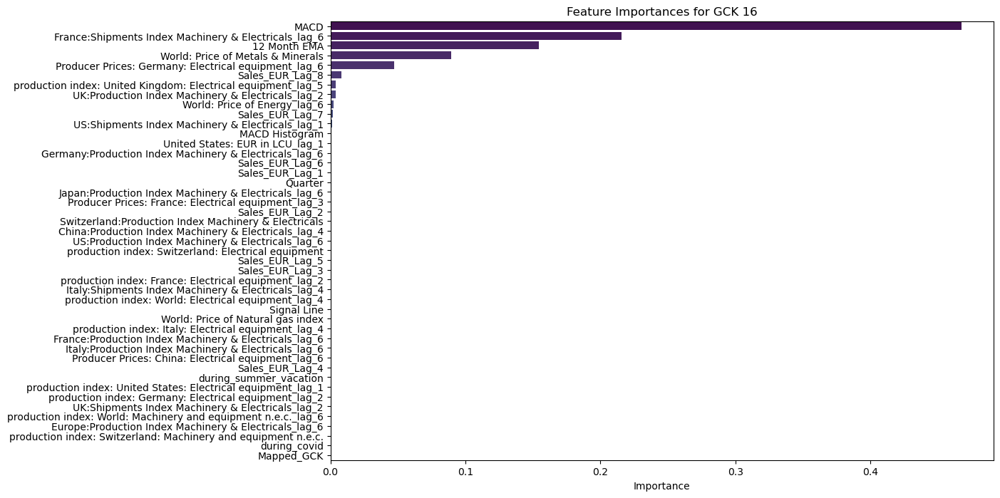

In [340]:
#Target and Features
X_FI16 = df_gck16.drop('Sales_EUR', axis=1)
y_FI16 = df_gck16['Sales_EUR']

#Train test and split
X_train_FI16, X_test_FI16, y_train_FI16, y_test_FI16 = train_test_split(X_FI16, y_FI16, test_size=0.2, random_state=42)

#Apply the XGBoost model to the GCK 16 data to see the feature importance based on RMSE
model_FI16 = XGBRegressor(objective='reg:squarederror', random_state = 42)
model_FI16.fit(X_train_FI16, y_train_FI16)

y_pred_FI16 = model_FI16.predict(X_test_FI16)

rmse_FI16 = mean_squared_error(y_test_FI16, y_pred_FI16, squared=False)

# Get the feature importances
importances_FI16 = model_FI16.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI16 = pd.DataFrame(importances_FI16, index=X_FI16.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI16 = feature_importances_FI16.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI16['Importance'], y=feature_importances_FI16.index, palette='viridis')
plt.title('Feature Importances for GCK 16')
plt.show()

In [341]:
# Get a list of the features with importance greater than 0.01
important_features_FI16 = feature_importances_FI16[feature_importances_FI16['Importance'] > 0.01].index

important_features_FI16

Index(['MACD', 'France:Shipments Index Machinery & Electricals_lag_6',
       '12 Month EMA', 'World: Price of Metals & Minerals',
       'Producer Prices: Germany: Electrical equipment_lag_6'],
      dtype='object')

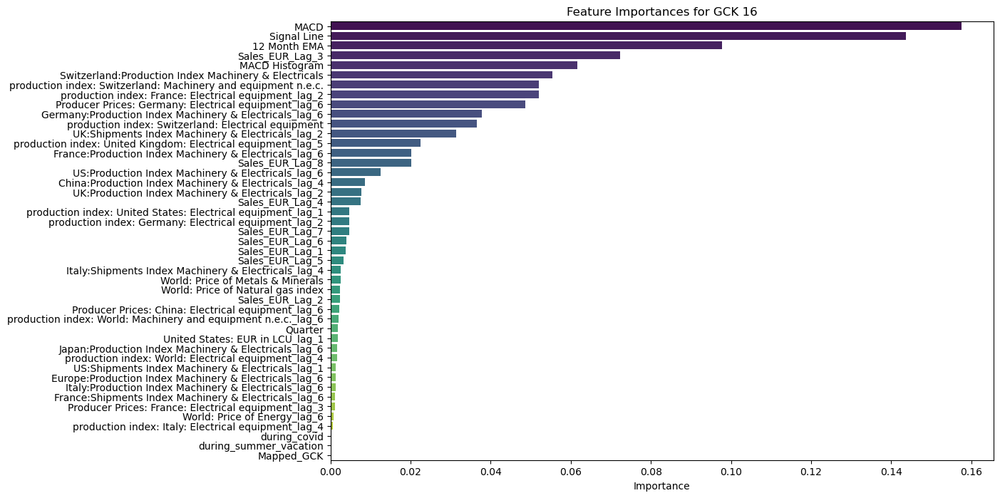

In [342]:
# Do the same with Random Forest model
model_RF16 = RandomForestRegressor(random_state = 42)
model_RF16.fit(X_train_FI16, y_train_FI16)

y_pred_RF16 = model_RF16.predict(X_test_FI16)

rmse_RF16 = mean_squared_error(y_test_FI16, y_pred_RF16, squared=False)

# Get the feature importances

importances_RF16 = model_RF16.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_RF16 = pd.DataFrame(importances_RF16, index=X_FI16.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_RF16 = feature_importances_RF16.sort_values(by='Importance', ascending=False)

# Plot the feature importances

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF16['Importance'], y=feature_importances_RF16.index, palette='viridis')
plt.title('Feature Importances for GCK 16')
plt.show()

In [343]:
# Get a list of the features with importance greater than 0.01
important_features_RF16 = feature_importances_RF16[feature_importances_RF16['Importance'] > 0.01].index

important_features_RF16

Index(['MACD', 'Signal Line', '12 Month EMA', 'Sales_EUR_Lag_3',
       'MACD Histogram',
       'Switzerland:Production Index Machinery & Electricals',
       'production index: Switzerland: Machinery and equipment n.e.c.',
       'production index: France: Electrical equipment_lag_2',
       'Producer Prices: Germany: Electrical equipment_lag_6',
       'Germany:Production Index Machinery & Electricals_lag_6',
       'production index: Switzerland: Electrical equipment',
       'UK:Shipments Index Machinery & Electricals_lag_2',
       'production index: United Kingdom: Electrical equipment_lag_5',
       'France:Production Index Machinery & Electricals_lag_6',
       'Sales_EUR_Lag_8', 'US:Production Index Machinery & Electricals_lag_6'],
      dtype='object')

In [344]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck16 = list(set(important_features_FI16).intersection(important_features_RF16))

important_features_gck16

['MACD',
 '12 Month EMA',
 'Producer Prices: Germany: Electrical equipment_lag_6']

In [345]:
#Filter the df_gck16 DataFrame to only include the important features and the target variable
df_gck16_filtered = df_gck16[important_features_gck16 + ['Sales_EUR']]

# Make a df for the target variable and the features
y16 = df_gck16_filtered['Sales_EUR']
X16 = df_gck16_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X16_scaled = scaler.fit_transform(X16)

# Split the data into train and test
X16_train, X16_test, y16_train, y16_test = train_test_split(X16_scaled, y16, test_size=0.2, random_state=42)

In [346]:
# Apply the XGBoost model to the GCK 16 data
model16 = XGBRegressor(objective='reg:squarederror', random_state = 42)

model16.fit(X16_train, y16_train)

y16_pred = model16.predict(X16_test)

rmse16 = mean_squared_error(y16_test, y16_pred, squared=False)

rmse16

65993.26113878348

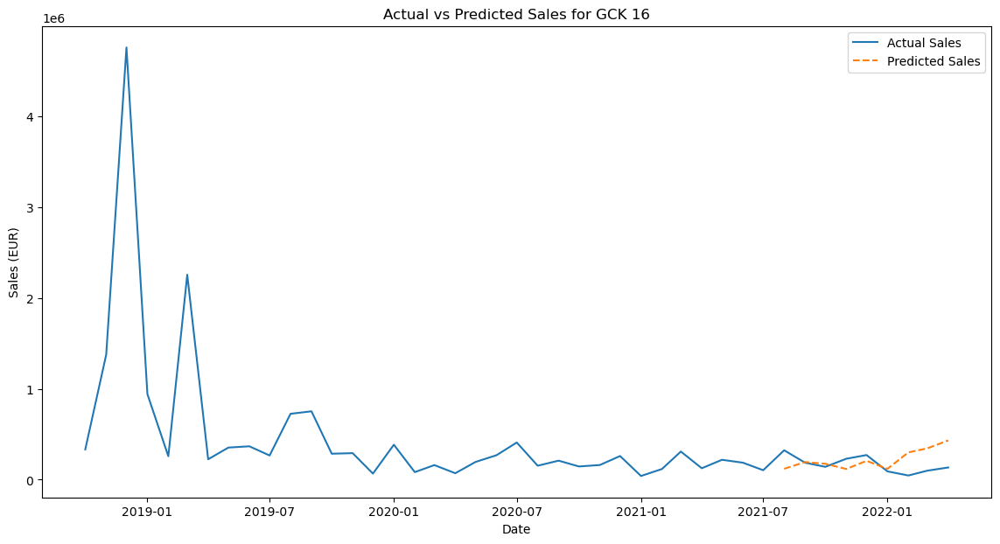

In [347]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck16.index, df_gck16['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck16.index[-len(y16_test):], y16_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 16')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [348]:
#apply the Random Forest model to the GCK 16 data
model16_RF = RandomForestRegressor(random_state = 42)

model16_RF.fit(X16_train, y16_train)

y16_pred_RF = model16_RF.predict(X16_test)

rmse16_RF = mean_squared_error(y16_test, y16_pred_RF, squared=False)

rmse16_RF

147652.98624478068

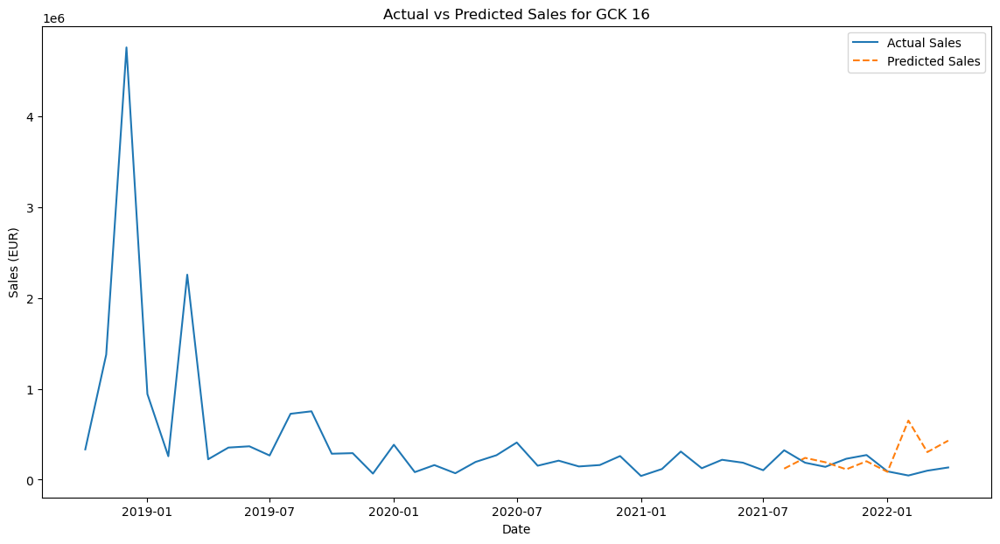

In [349]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck16.index, df_gck16['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck16.index[-len(y16_test):], y16_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 16')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [350]:
#apply the a linear regression model to the GCK 16 data
model16_LR = LinearRegression()

model16_LR.fit(X16_train, y16_train)

y16_pred_LR = model16_LR.predict(X16_test)

rmse16_LR = mean_squared_error(y16_test, y16_pred_LR, squared=False)

rmse16_LR

470891.574750567

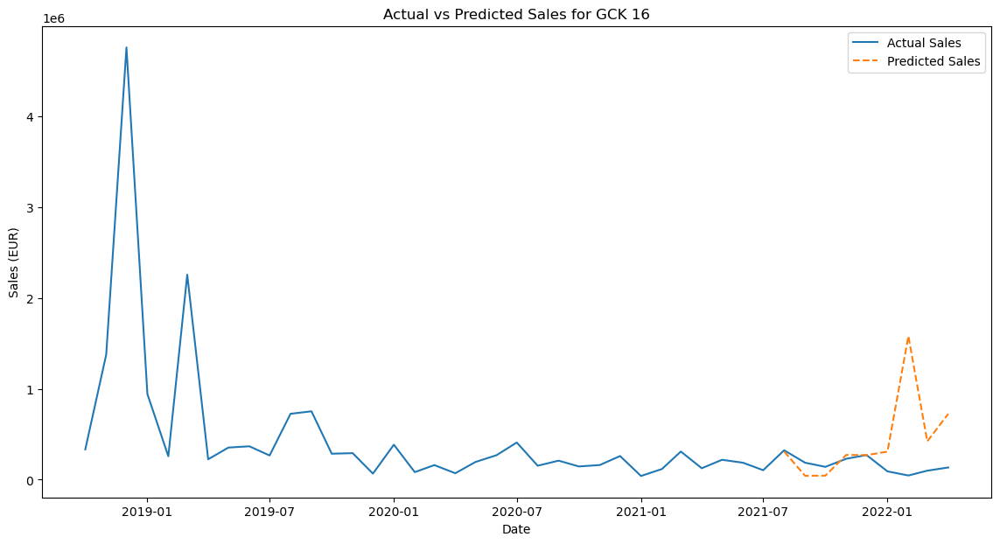

In [351]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck16.index, df_gck16['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck16.index[-len(y16_test):], y16_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 16')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [352]:
#make a knn model
from sklearn.neighbors import KNeighborsRegressor

model16_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model16_KNN.fit(X16_train, y16_train)

y16_pred_KNN = model16_KNN.predict(X16_test)

rmse16_KNN = mean_squared_error(y16_test, y16_pred_KNN, squared=False)

rmse16_KNN

262239.1263776845

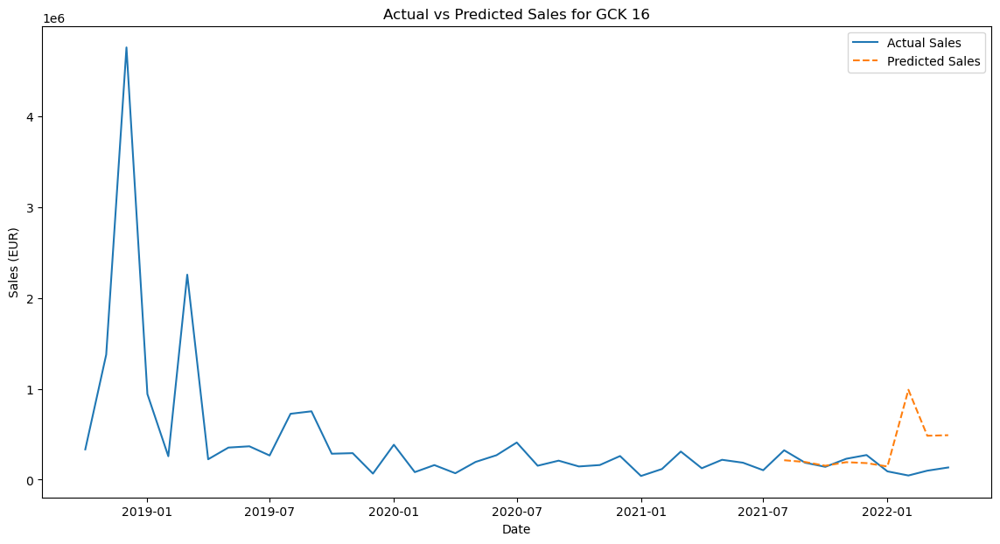

In [353]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck16.index, df_gck16['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck16.index[-len(y16_test):], y16_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 16')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [354]:
#Make an ensemble model that runs these 4 models and selects the best one
from sklearn.ensemble import VotingRegressor

model16_ensemble = VotingRegressor(estimators=[
    ('xgb', model16),
    ('rf', model16_RF),
    ('lr', model16_LR),
    ('knn', model16_KNN)
])

model16_ensemble.fit(X16_train, y16_train)

y16_pred_ensemble = model16_ensemble.predict(X16_test)

rmse16_ensemble = mean_squared_error(y16_test, y16_pred_ensemble, squared=False)

rmse16_ensemble

221689.75774958293

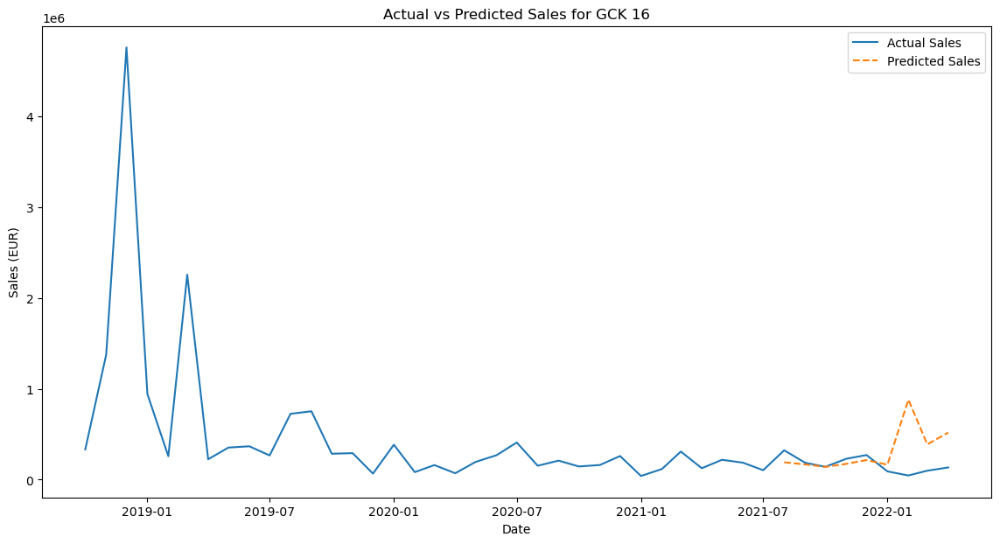

In [355]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck16.index, df_gck16['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck16.index[-len(y16_test):], y16_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 16')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [356]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']

rmse_values = [rmse16, rmse16_RF, rmse16_LR, rmse16_KNN, rmse16_ensemble]

rmse_table16 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table16

,Model,RMSE
0,XGBoost,65993.261139
1,Random Forest,147652.986245
2,Linear Regression,470891.574751
3,KNN,262239.126378
4,Ensemble,221689.757750


In [357]:
#Create a future DataFrame for the GCK 16 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df16 = pd.DataFrame(index=future_dates, columns=df_gck16_filtered.columns)

#Join the future DataFrame with the df_gck14_filtered DataFrame
final_df16 = pd.concat([df_gck16_filtered, future_df16])

final_df16

,MACD,12 Month EMA,Producer Prices: Germany: Electrical equipment_lag_6,Sales_EUR
2018-10-01,0.000000,3.331969e+05,108.172577,333196.87
2018-11-01,23434.237660,8.989663e+05,108.277802,1377694.32
2018-12-01,134823.256473,2.406914e+06,108.593475,4762524.66
2019-01-01,44276.961435,1.944800e+06,108.803925,942957.19
2019-02-01,-33122.054982,1.486439e+06,108.909157,257765.04
2019-03-01,6519.503316,1.674054e+06,108.909157,2258352.22
2019-04-01,-60307.122136,1.350592e+06,109.119614,224501.90
2019-05-01,-98013.947453,1.142504e+06,109.224838,353451.54
2019-06-01,-121940.597863,9.891658e+05,109.330063,367425.38
2019-07-01,-142352.145321,8.521690e+05,109.750961,266225.86


In [358]:
#Separate the target variable and the features from the final_df DataFrame
y_final16 = final_df16['Sales_EUR']
X_final16 = final_df16.drop('Sales_EUR', axis=1)

In [359]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final16.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df16[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning: Non-invertible starting MA parameters found. Using zeros as starting parameters.
  warn('Non-invertible starting MA parameters found.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate star

In [360]:
final_df16

,MACD,12 Month EMA,Producer Prices: Germany: Electrical equipment_lag_6,Sales_EUR
2018-10-01,0.000000,3.331969e+05,108.172577,333196.87
2018-11-01,23434.237660,8.989663e+05,108.277802,1377694.32
2018-12-01,134823.256473,2.406914e+06,108.593475,4762524.66
2019-01-01,44276.961435,1.944800e+06,108.803925,942957.19
2019-02-01,-33122.054982,1.486439e+06,108.909157,257765.04
2019-03-01,6519.503316,1.674054e+06,108.909157,2258352.22
2019-04-01,-60307.122136,1.350592e+06,109.119614,224501.90
2019-05-01,-98013.947453,1.142504e+06,109.224838,353451.54
2019-06-01,-121940.597863,9.891658e+05,109.330063,367425.38
2019-07-01,-142352.145321,8.521690e+05,109.750961,266225.86


In [361]:
#Split the target and features
y16_final = final_df16['Sales_EUR']
X16_final = final_df16.drop('Sales_EUR', axis=1)

#Train test split
X16_final_train = X16_final.loc['2018-01-01':'2022-04-01']
y16_final_train = y16_final.loc['2018-01-01':'2022-04-01']
X16_final_test = X16_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X16_final16_train_scaled = scaler.fit_transform(X16_final_train)

X16_final16_test_scaled = scaler.transform(X16_final_test)

#Apply the XGBoost model to the final data

model16.fit(X16_final16_train_scaled, y16_final_train)

y16_final_pred = model16.predict(X16_final16_test_scaled)

y16_final_pred

array([127074.8 , 136670.3 , 128930.97, 126835.14, 132708.7 , 136217.61,
       132708.7 , 330421.25, 299438.88, 224246.84], dtype=float32)

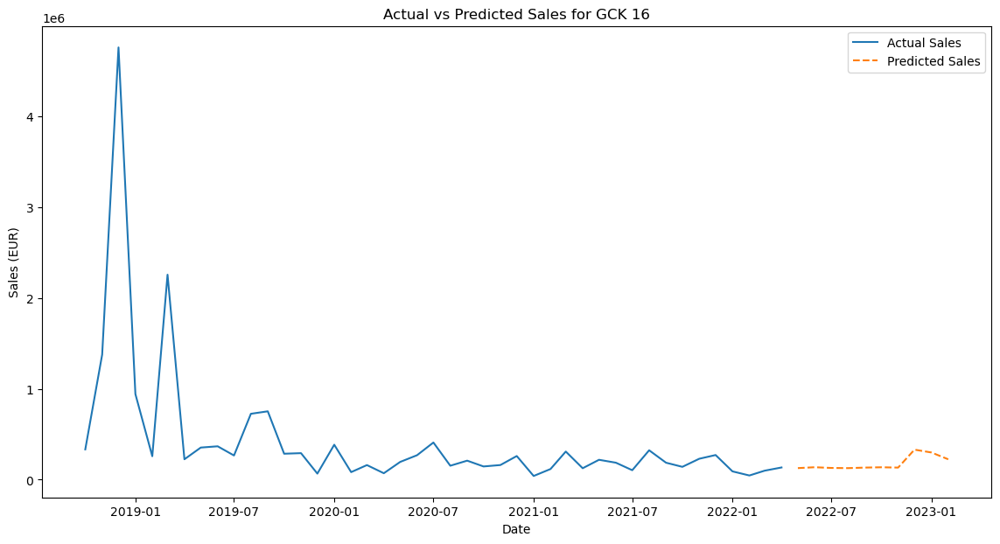

In [362]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df16.index, final_df16['Sales_EUR'], label='Actual Sales')
plt.plot(final_df16.index[-len(y16_final_pred):], y16_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 16')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 20

In [363]:
#Set Date to datetime
df_gck20['Date'] = pd.to_datetime(df_gck20['Date'])
df_gck20.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\1599697073.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck20['Date'] = pd.to_datetime(df_gck20['Date'])


In [364]:
#Check the correlation of the features with the target
correlation = df_gck20.corr()['Sales_EUR'].sort_values(ascending=False)
correlation

Sales_EUR                                                       1.000000
MACD Histogram                                                  0.727349
MACD                                                            0.637731
12 Month EMA                                                    0.544716
production index: Germany: Electrical equipment_lag_1           0.406666
                                                                  ...   
UK:Shipments Index Machinery & Electricals_lag_6               -0.347015
production index: United States: Electrical equipment_lag_4    -0.359034
UK:Production Index Machinery & Electricals_lag_6              -0.387108
production index: United Kingdom: Electrical equipment_lag_6   -0.410453
Mapped_GCK                                                           NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [365]:
# Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}

for feature in market_features:
    correlation_with_target[feature] = df_gck20[feature].corr(df_gck20['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]

        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_2', 'France:Production Index Machinery & Electricals_lag_1', 'France:Shipments Index Machinery & Electricals_lag_1', 'Germany:Production Index Machinery & Electricals_lag_1', 'Germany:Shipments Index Machinery & Electricals_lag_1', 'Italy:Production Index Machinery & Electricals_lag_1', 'Italy:Shipments Index Machinery & Electricals_lag_2', 'Japan:Production Index Machinery & Electricals_lag_1', 'Switzerland:Production Index Machinery & Electricals_lag_6', 'UK:Production Index Machinery & Electricals_lag_6', 'UK:Shipments Index Machinery & Electricals_lag_6', 'US:Production Index Machinery & Electricals_lag_4', 'US:Shipments Index Machinery & Electricals_lag_3', 'Europe:Production Index Machinery & Electricals_lag_1', 'Europe:Shipments Index Machinery & Electricals_lag_1', 'World: Price of Energy_lag_6', 'World: Price of Metals & Minerals_lag_6', 'World: Price of Natural gas index_lag_6', 'United States: EUR in LCU

In [366]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck20 = df_gck20.drop(features_to_remove, axis=1)

# Create a list with the pairs features that are highly correlated (0.95) in df_gck20
correlated_features = set()
correlation_matrix = df_gck20.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA',
 'production index: France: Electrical equipment_lag_1',
 'production index: Italy: Electrical equipment_lag_1'}

In [367]:
#Drop the features that are highly correlated
df_gck20 = df_gck20.drop(correlated_features, axis=1)

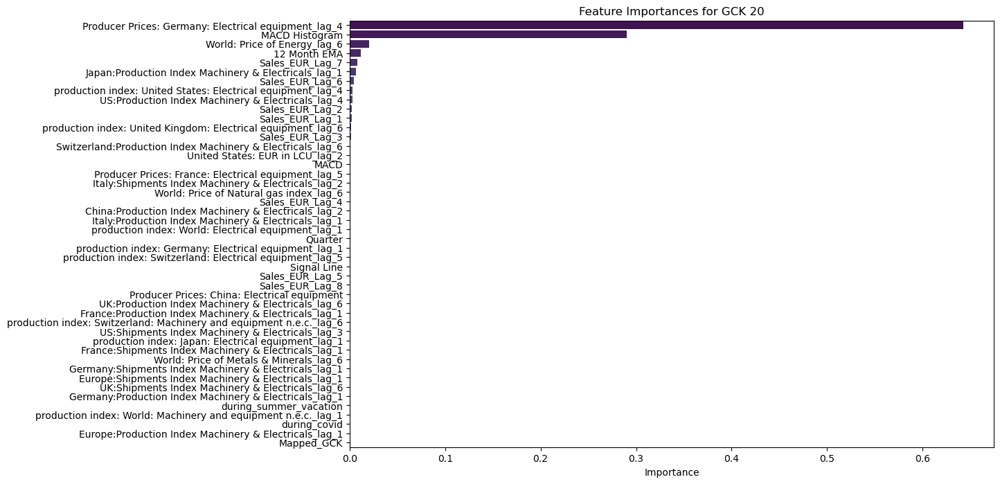

In [368]:
#Target and Features
X_FI20 = df_gck20.drop('Sales_EUR', axis=1)
y_FI20 = df_gck20['Sales_EUR']

#Train test and split
X_train_FI20, X_test_FI20, y_train_FI20, y_test_FI20 = train_test_split(X_FI20, y_FI20, test_size=0.2, random_state=42)

#Apply the XGBoost model to the GCK 20 data to see the feature importance based on RMSE
model_FI20 = XGBRegressor(objective='reg:squarederror', random_state = 42)
model_FI20.fit(X_train_FI20, y_train_FI20)

y_pred_FI20 = model_FI20.predict(X_test_FI20)

rmse_FI20 = mean_squared_error(y_test_FI20, y_pred_FI20, squared=False)

# Get the feature importances
importances_FI20 = model_FI20.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI20 = pd.DataFrame(importances_FI20, index=X_FI20.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI20 = feature_importances_FI20.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI20['Importance'], y=feature_importances_FI20.index, palette='viridis')
plt.title('Feature Importances for GCK 20')
plt.show()

In [369]:
# Get a list of the features with importance greater than 0.01
important_features_FI20 = feature_importances_FI20[feature_importances_FI20['Importance'] > 0.01].index

important_features_FI20

Index(['Producer Prices: Germany: Electrical equipment_lag_4',
       'MACD Histogram', 'World: Price of Energy_lag_6', '12 Month EMA'],
      dtype='object')

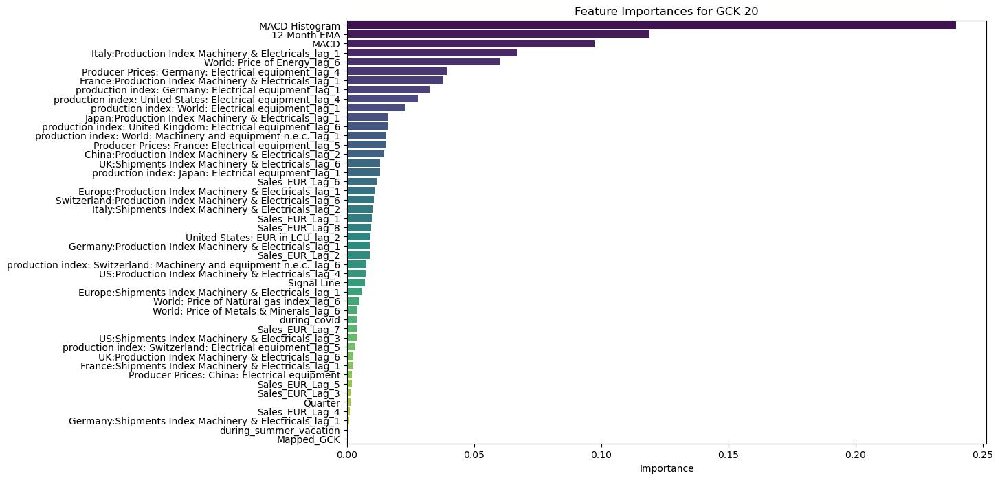

In [370]:
# Do the same with Random Forest model
model_RF20 = RandomForestRegressor(random_state = 42)
model_RF20.fit(X_train_FI20, y_train_FI20)

y_pred_RF20 = model_RF20.predict(X_test_FI20)
rmse_RF20 = mean_squared_error(y_test_FI20, y_pred_RF20, squared=False)

# Get the feature importances

importances_RF20 = model_RF20.feature_importances_

# Create a DataFrame to store the feature importances

feature_importances_RF20 = pd.DataFrame(importances_RF20, index=X_FI20.columns, columns=['Importance'])

# Sort the DataFrame in descending order

feature_importances_RF20 = feature_importances_RF20.sort_values(by='Importance', ascending=False)

# Plot the feature importances

plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF20['Importance'], y=feature_importances_RF20.index, palette='viridis')
plt.title('Feature Importances for GCK 20')
plt.show()

In [371]:
# Get a list of the features with importance greater than 0.01
important_features_RF20 = feature_importances_RF20[feature_importances_RF20['Importance'] > 0.01].index

important_features_RF20

Index(['MACD Histogram', '12 Month EMA', 'MACD',
       'Italy:Production Index Machinery & Electricals_lag_1',
       'World: Price of Energy_lag_6',
       'Producer Prices: Germany: Electrical equipment_lag_4',
       'France:Production Index Machinery & Electricals_lag_1',
       'production index: Germany: Electrical equipment_lag_1',
       'production index: United States: Electrical equipment_lag_4',
       'production index: World: Electrical equipment_lag_1',
       'Japan:Production Index Machinery & Electricals_lag_1',
       'production index: United Kingdom: Electrical equipment_lag_6',
       'production index: World: Machinery and equipment n.e.c._lag_1',
       'Producer Prices: France: Electrical equipment_lag_5',
       'China:Production Index Machinery & Electricals_lag_2',
       'UK:Shipments Index Machinery & Electricals_lag_6',
       'production index: Japan: Electrical equipment_lag_1',
       'Sales_EUR_Lag_6',
       'Europe:Production Index Machinery & Elec

In [372]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck20 = list(set(important_features_FI20).intersection(important_features_RF20))

important_features_gck20

['MACD Histogram',
 '12 Month EMA',
 'Producer Prices: Germany: Electrical equipment_lag_4',
 'World: Price of Energy_lag_6']

In [373]:
#Filter the df_gck20 DataFrame to only include the important features and the target variable
df_gck20_filtered = df_gck20[important_features_gck20 + ['Sales_EUR']]

# Make a df for the target variable and the features
y20 = df_gck20_filtered['Sales_EUR']
X20 = df_gck20_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X20_scaled = scaler.fit_transform(X20)

# Split the data into train and test
X20_train, X20_test, y20_train, y20_test = train_test_split(X20_scaled, y20, test_size=0.2, random_state=42)

In [374]:
# Apply the XGBoost model to the GCK 20 data
model20 = XGBRegressor(objective='reg:squarederror', random_state=42)

model20.fit(X20_train, y20_train)

y20_pred = model20.predict(X20_test)

rmse20 = mean_squared_error(y20_test, y20_pred, squared=False)

rmse20

1370.311993799849

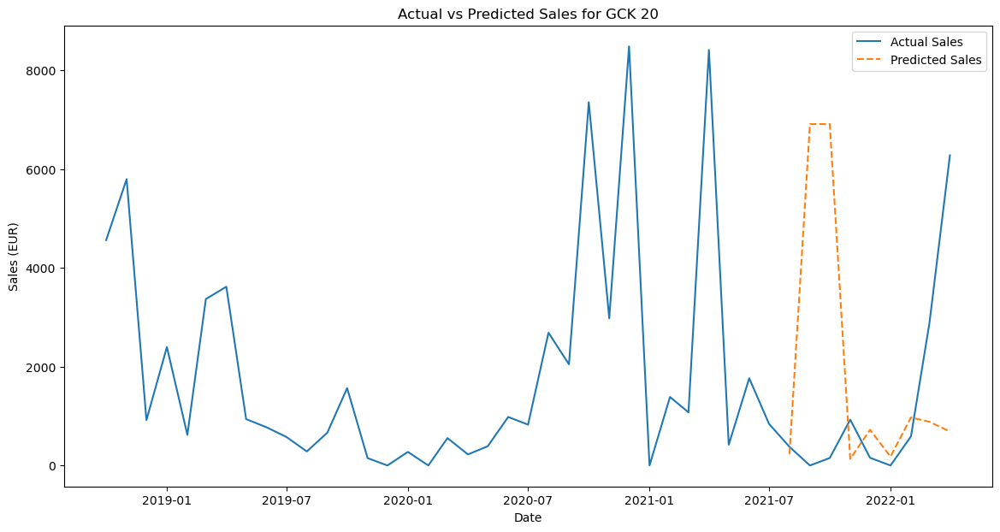

In [375]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck20.index, df_gck20['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck20.index[-len(y20_test):], y20_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 20')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [376]:
#apply the Random Forest model to the GCK 20 data
model20_RF = RandomForestRegressor(random_state=42)

model20_RF.fit(X20_train, y20_train)

y20_pred_RF = model20_RF.predict(X20_test)

rmse20_RF = mean_squared_error(y20_test, y20_pred_RF, squared=False)

rmse20_RF

1153.0744151864376

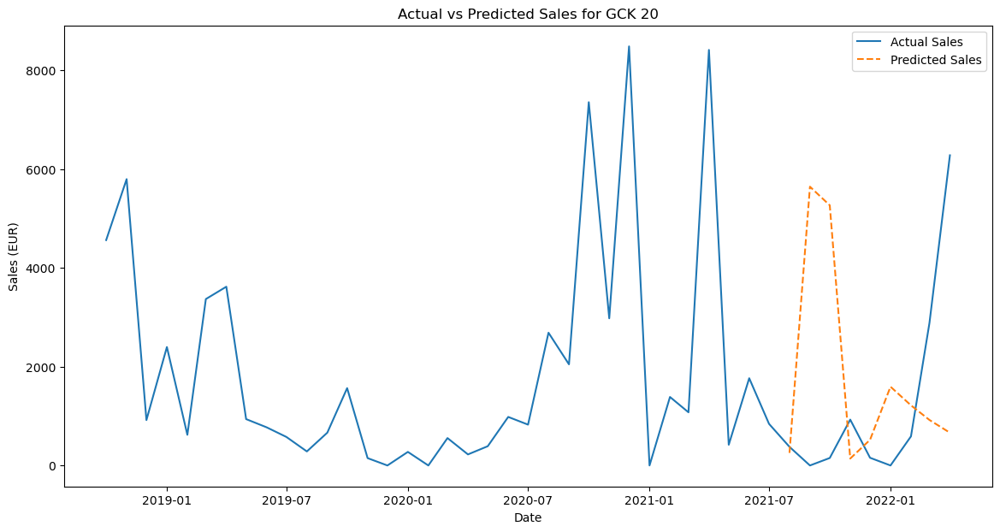

In [377]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck20.index, df_gck20['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck20.index[-len(y20_test):], y20_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 20')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [378]:
#apply the a linear regression model to the GCK 20 data
model20_LR = LinearRegression()

model20_LR.fit(X20_train, y20_train)

y20_pred_LR = model20_LR.predict(X20_test)

rmse20_LR = mean_squared_error(y20_test, y20_pred_LR, squared=False)

rmse20_LR

1276.6241924029018

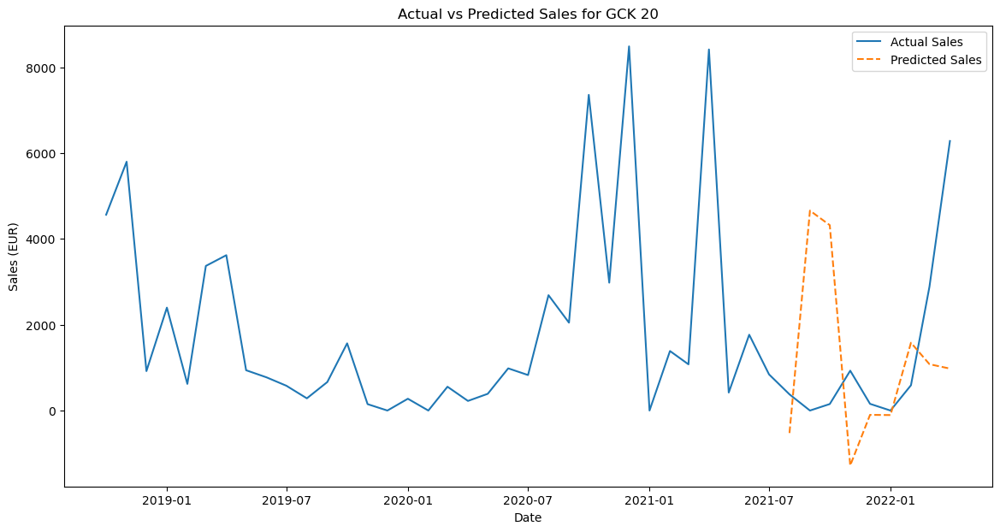

In [379]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck20.index, df_gck20['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck20.index[-len(y20_test):], y20_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 20')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [380]:
#make a knn model
model20_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model20_KNN.fit(X20_train, y20_train)

y20_pred_KNN = model20_KNN.predict(X20_test)

rmse20_KNN = mean_squared_error(y20_test, y20_pred_KNN, squared=False)

rmse20_KNN

1327.7480507151517

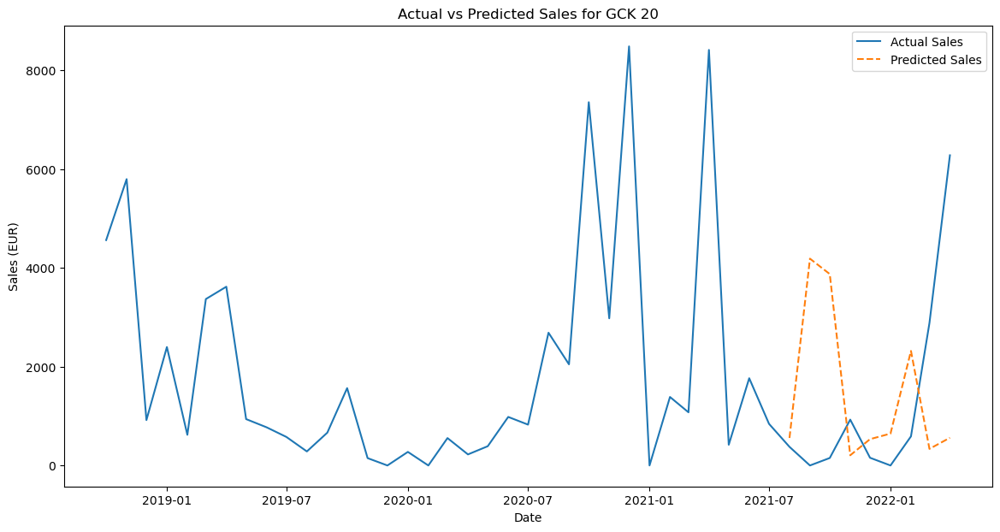

In [381]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck20.index, df_gck20['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck20.index[-len(y20_test):], y20_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 20')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [382]:
#Make an ensemble model that runs these 4 models and selects the best one
from sklearn.ensemble import VotingRegressor

model20_ensemble = VotingRegressor(estimators=[
    ('xgb', model20),
    ('rf', model20_RF),
    ('lr', model20_LR),
    ('knn', model20_KNN)
])

model20_ensemble.fit(X20_train, y20_train)

y20_pred_ensemble = model20_ensemble.predict(X20_test)

rmse20_ensemble = mean_squared_error(y20_test, y20_pred_ensemble, squared=False)

rmse20_ensemble

1104.6324184856267

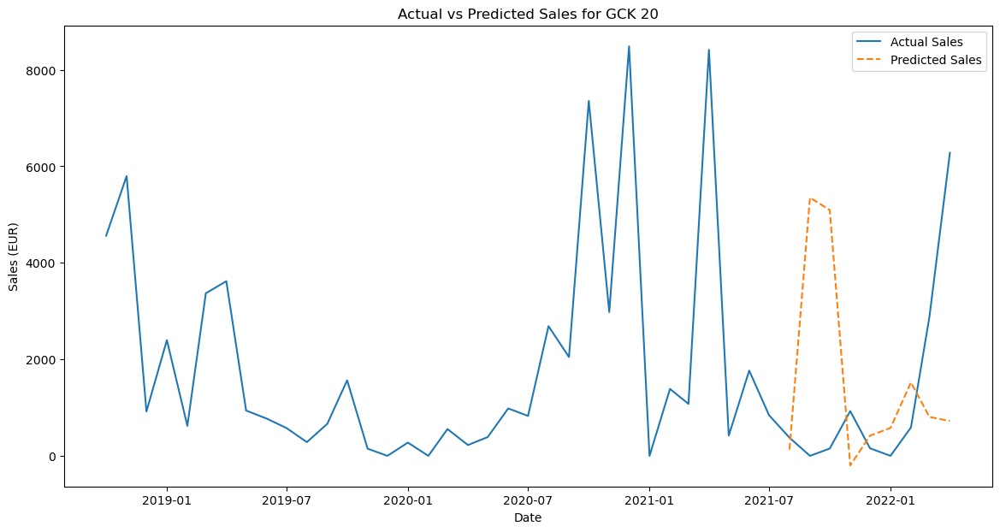

In [383]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck20.index, df_gck20['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck20.index[-len(y20_test):], y20_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 20')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [384]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']

rmse_values = [rmse20, rmse20_RF, rmse20_LR, rmse20_KNN, rmse20_ensemble]

rmse_table20 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table20

,Model,RMSE
0,XGBoost,1370.311994
1,Random Forest,1153.074415
2,Linear Regression,1276.624192
3,KNN,1327.748051
4,Ensemble,1104.632418


In [385]:
#Create a future DataFrame for the GCK 20 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df20 = pd.DataFrame(index=future_dates, columns=df_gck20_filtered.columns)

#Join the future DataFrame with the df_gck20_filtered DataFrame
final_df20 = pd.concat([df_gck20_filtered, future_df20])

final_df20

,MACD Histogram,12 Month EMA,Producer Prices: Germany: Electrical equipment_lag_4,World: Price of Energy_lag_6,Sales_EUR
2018-10-01,0.000000,4563.140000,108.593475,88.397452,4563.14
2018-11-01,12.314815,5232.098333,108.803925,94.596396,5798.14
2018-12-01,-77.547715,3548.558453,108.909157,93.668528,918.65
2019-01-01,-57.301198,3185.384740,108.909157,93.028863,2398.04
2019-02-01,-91.568711,2488.558194,109.119614,91.986125,620.66
2019-03-01,-10.356651,2702.685552,109.224838,98.724499,3369.55
2019-04-01,39.337199,2907.298497,109.330063,100.222169,3619.63
2019-05-01,-34.163360,2496.524070,109.750961,84.436807,938.90
2019-06-01,-75.835990,2155.537794,109.856194,74.898746,772.94
2019-07-01,-99.797509,1856.519195,109.961418,76.204771,577.60


In [386]:
#Separate the target variable and the features from the final_df DataFrame
y_final20 = final_df20['Sales_EUR']
X_final20 = final_df20.drop('Sales_EUR', axis=1)

In [387]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final20.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df20[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\base\model.py:607: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  warnings.warn("Maximum Likelihood optimization f

In [388]:
final_df20

,MACD Histogram,12 Month EMA,Producer Prices: Germany: Electrical equipment_lag_4,World: Price of Energy_lag_6,Sales_EUR
2018-10-01,0.000000,4563.140000,108.593475,88.397452,4563.14
2018-11-01,12.314815,5232.098333,108.803925,94.596396,5798.14
2018-12-01,-77.547715,3548.558453,108.909157,93.668528,918.65
2019-01-01,-57.301198,3185.384740,108.909157,93.028863,2398.04
2019-02-01,-91.568711,2488.558194,109.119614,91.986125,620.66
2019-03-01,-10.356651,2702.685552,109.224838,98.724499,3369.55
2019-04-01,39.337199,2907.298497,109.330063,100.222169,3619.63
2019-05-01,-34.163360,2496.524070,109.750961,84.436807,938.90
2019-06-01,-75.835990,2155.537794,109.856194,74.898746,772.94
2019-07-01,-99.797509,1856.519195,109.961418,76.204771,577.60


In [389]:
#Split the target and features
y20_final = final_df20['Sales_EUR']
X20_final = final_df20.drop('Sales_EUR', axis=1)

#Train test split
X20_final_train = X20_final.loc['2018-01-01':'2022-04-01']
y20_final_train = y20_final.loc['2018-01-01':'2022-04-01']
X20_final_test = X20_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X20_final20_train_scaled = scaler.fit_transform(X20_final_train)

X20_final20_test_scaled = scaler.transform(X20_final_test)

#Apply the Ensemble model to the final data

model20_ensemble.fit(X20_final20_train_scaled, y20_final_train)

y20_final_pred = model20_ensemble.predict(X20_final20_test_scaled)

y20_final_pred

array([3973.81520489, 3880.3956667 , 3701.79145369, 3740.15728307,
       3659.90842899, 5444.49282208, 4238.52292584, 5561.28715943,
       3822.08051277, 3649.85260409])

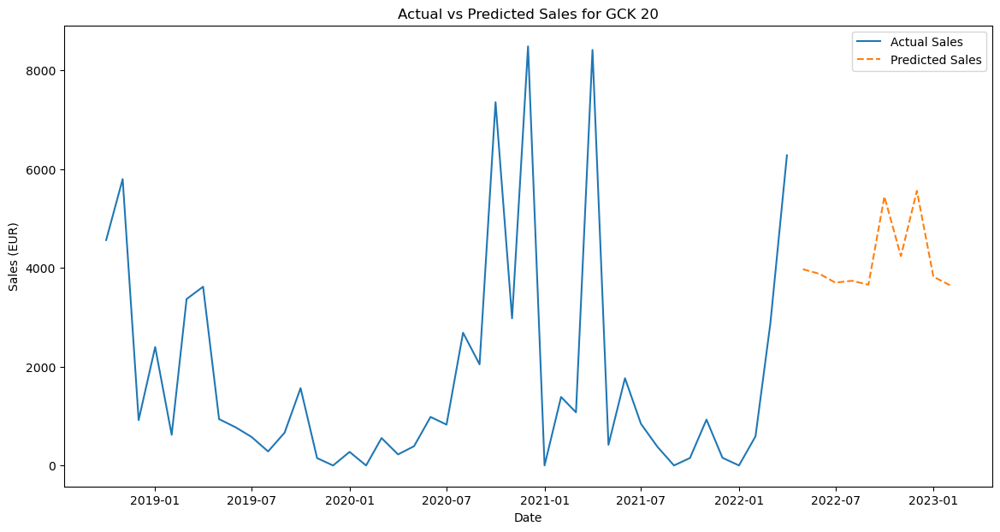

In [390]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df20.index, final_df20['Sales_EUR'], label='Actual Sales')
plt.plot(final_df20.index[-len(y20_final_pred):], y20_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 20')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

# GCK 36

In [391]:
#Set Date to datetime
df_gck36['Date'] = pd.to_datetime(df_gck36['Date'])
df_gck36.set_index('Date', inplace = True)

C:\Users\diogo\AppData\Local\Temp\ipykernel_14368\926857438.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_gck36['Date'] = pd.to_datetime(df_gck36['Date'])


In [392]:
#Check the correlation of the features with the target
correlation = df_gck36.corr()['Sales_EUR'].sort_values(ascending=False)
correlation

Sales_EUR                                               1.000000
MACD Histogram                                          0.751234
MACD                                                    0.673671
12 Month EMA                                            0.528131
26 Month EMA                                            0.387957
                                                          ...   
Switzerland:Production Index Machinery & Electricals   -0.307579
production index: Switzerland: Electrical equipment    -0.313335
US:Shipments Index Machinery & Electricals_lag_5       -0.317815
UK:Production Index Machinery & Electricals_lag_2      -0.323412
Mapped_GCK                                                   NaN
Name: Sales_EUR, Length: 242, dtype: float64

In [393]:
# Code generated with chatgpt

# Compute the correlation of each feature with the target variable

correlation_with_target = {}

for feature in market_features:
    correlation_with_target[feature] = df_gck36[feature].corr(df_gck36['Sales_EUR'])

# Create a dictionary to store the maximum correlation for each group of features
max_correlation_per_group = {}

# Compute the correlation of each lagged feature with the target variable
for feature in market_features:
    if '_lag_' in feature:
        original_feature = feature.split('_lag_')[0]
        lag = int(feature.split('_lag_')[1])
        correlation = correlation_with_target[feature]

        # Update max correlation for the group
        if original_feature not in max_correlation_per_group or abs(correlation) > abs(max_correlation_per_group[original_feature][0]):
            max_correlation_per_group[original_feature] = (correlation, lag)

# Select the lagged feature with the highest absolute correlation for each original feature
selected_features = []

for original_feature, (correlation, lag) in max_correlation_per_group.items():
    if original_feature in correlation_with_target:  # Check if the original feature exists
        original_correlation = correlation_with_target[original_feature]
        if abs(original_correlation) >= abs(correlation):
            selected_features.append(original_feature)
        else:
            selected_features.append(f"{original_feature}_lag_{lag}")
    else:
        selected_features.append(f"{original_feature}_lag_{lag}")

# Print selected features
print("Selected features:")
print(selected_features)

Selected features:
['China:Production Index Machinery & Electricals_lag_1', 'France:Production Index Machinery & Electricals_lag_2', 'France:Shipments Index Machinery & Electricals_lag_2', 'Germany:Production Index Machinery & Electricals_lag_2', 'Germany:Shipments Index Machinery & Electricals_lag_2', 'Italy:Production Index Machinery & Electricals_lag_3', 'Italy:Shipments Index Machinery & Electricals_lag_3', 'Japan:Production Index Machinery & Electricals_lag_5', 'Switzerland:Production Index Machinery & Electricals', 'UK:Production Index Machinery & Electricals_lag_2', 'UK:Shipments Index Machinery & Electricals_lag_2', 'US:Production Index Machinery & Electricals_lag_2', 'US:Shipments Index Machinery & Electricals_lag_5', 'Europe:Production Index Machinery & Electricals_lag_2', 'Europe:Shipments Index Machinery & Electricals_lag_2', 'World: Price of Energy_lag_6', 'World: Price of Metals & Minerals', 'World: Price of Natural gas index_lag_1', 'United States: EUR in LCU_lag_3', 'Pr

In [394]:
#Make a list with the features that are not in the selected features
features_to_remove = [feature for feature in market_features if feature not in selected_features]

# Drop the features that are not in the selected features
df_gck36 = df_gck36.drop(features_to_remove, axis=1)

# Create a list with the pairs features that are highly correlated (0.95) in df_gck36
correlated_features = set()
correlation_matrix = df_gck36.corr()

for i in range(len(correlation_matrix.columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

correlated_features

{'26 Month EMA',
 'production index: France: Electrical equipment_lag_2',
 'production index: Japan: Electrical equipment_lag_5'}

In [395]:
#Drop the features that are highly correlated
df_gck36 = df_gck36.drop(correlated_features, axis=1)

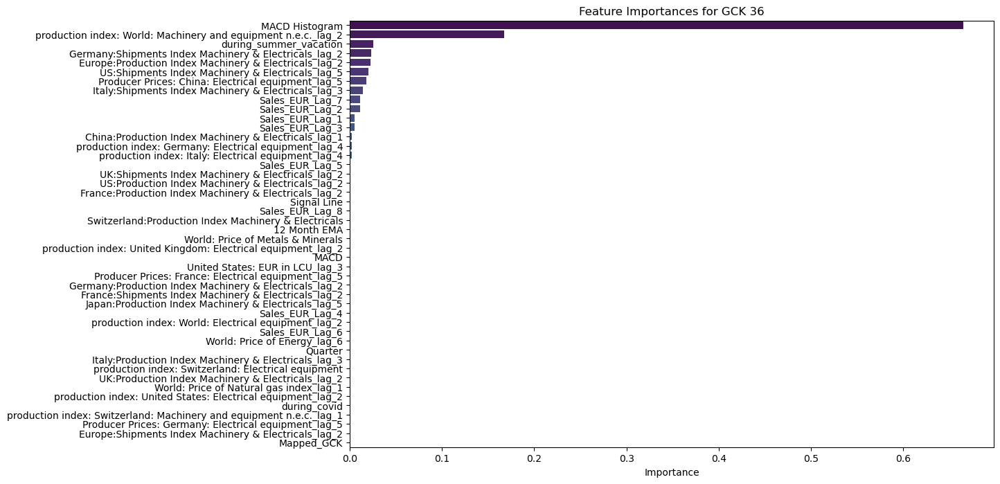

In [396]:
#Target and Features
X_FI36 = df_gck36.drop('Sales_EUR', axis=1)
y_FI36 = df_gck36['Sales_EUR']

#Train test and split
X_train_FI36, X_test_FI36, y_train_FI36, y_test_FI36 = train_test_split(X_FI36, y_FI36, test_size=0.2, random_state=42)

#Apply the XGBoost model to the GCK 36 data to see the feature importance based on RMSE
model_FI36 = XGBRegressor(objective='reg:squarederror', random_state = 42)
model_FI36.fit(X_train_FI36, y_train_FI36)

y_pred_FI36 = model_FI36.predict(X_test_FI36)

rmse_FI36 = mean_squared_error(y_test_FI36, y_pred_FI36, squared=False)

# Get the feature importances
importances_FI36 = model_FI36.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_FI36 = pd.DataFrame(importances_FI36, index=X_FI36.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_FI36 = feature_importances_FI36.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_FI36['Importance'], y=feature_importances_FI36.index, palette='viridis')
plt.title('Feature Importances for GCK 36')
plt.show()

In [397]:
# Get a list of the features with importance greater than 0.01
important_features_FI36 = feature_importances_FI36[feature_importances_FI36['Importance'] > 0.01].index

important_features_FI36

Index(['MACD Histogram',
       'production index: World: Machinery and equipment n.e.c._lag_2',
       'during_summer_vacation',
       'Germany:Shipments Index Machinery & Electricals_lag_2',
       'Europe:Production Index Machinery & Electricals_lag_2',
       'US:Shipments Index Machinery & Electricals_lag_5',
       'Producer Prices: China: Electrical equipment_lag_5',
       'Italy:Shipments Index Machinery & Electricals_lag_3',
       'Sales_EUR_Lag_7', 'Sales_EUR_Lag_2'],
      dtype='object')

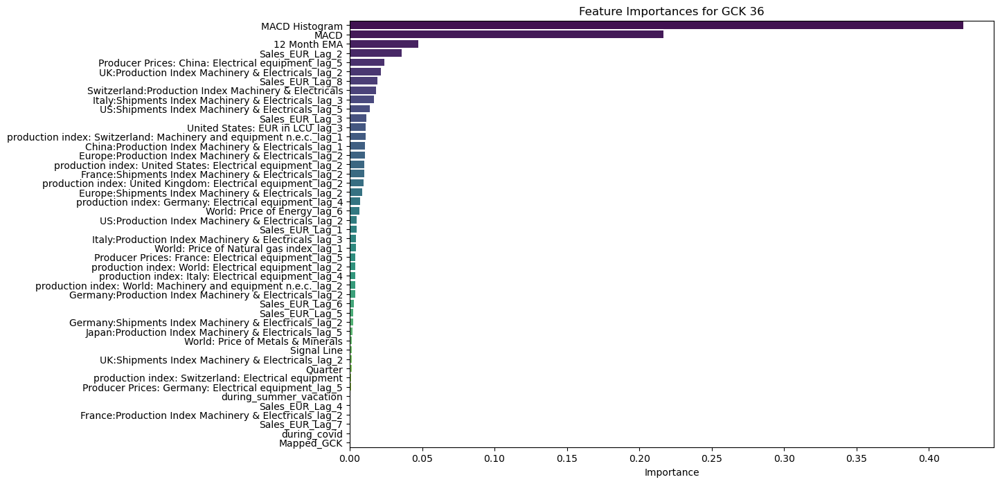

In [398]:
# Do the same with Random Forest model
model_RF36 = RandomForestRegressor(random_state =42)
model_RF36.fit(X_train_FI36, y_train_FI36)

y_pred_RF36 = model_RF36.predict(X_test_FI36)
rmse_RF36 = mean_squared_error(y_test_FI36, y_pred_RF36, squared=False)

# Get the feature importances
importances_RF36 = model_RF36.feature_importances_

# Create a DataFrame to store the feature importances
feature_importances_RF36 = pd.DataFrame(importances_RF36, index=X_FI36.columns, columns=['Importance'])

# Sort the DataFrame in descending order
feature_importances_RF36 = feature_importances_RF36.sort_values(by='Importance', ascending=False)

# Plot the feature importances
plt.figure(figsize=(12, 8))
sns.barplot(x=feature_importances_RF36['Importance'], y=feature_importances_RF36.index, palette='viridis')
plt.title('Feature Importances for GCK 36')
plt.show()

In [399]:
# Get a list of the features with importance greater than 0.01
important_features_RF36 = feature_importances_RF36[feature_importances_RF36['Importance'] > 0.01].index

important_features_RF36

Index(['MACD Histogram', 'MACD', '12 Month EMA', 'Sales_EUR_Lag_2',
       'Producer Prices: China: Electrical equipment_lag_5',
       'UK:Production Index Machinery & Electricals_lag_2', 'Sales_EUR_Lag_8',
       'Switzerland:Production Index Machinery & Electricals',
       'Italy:Shipments Index Machinery & Electricals_lag_3',
       'US:Shipments Index Machinery & Electricals_lag_5', 'Sales_EUR_Lag_3',
       'United States: EUR in LCU_lag_3',
       'production index: Switzerland: Machinery and equipment n.e.c._lag_1',
       'China:Production Index Machinery & Electricals_lag_1',
       'Europe:Production Index Machinery & Electricals_lag_2',
       'production index: United States: Electrical equipment_lag_2',
       'France:Shipments Index Machinery & Electricals_lag_2'],
      dtype='object')

In [400]:
#Get the intersection of the important features from the XGBoost and Random Forest models
important_features_gck36 = list(set(important_features_FI36).intersection(important_features_RF36))

important_features_gck36

['MACD Histogram',
 'Europe:Production Index Machinery & Electricals_lag_2',
 'Producer Prices: China: Electrical equipment_lag_5',
 'Italy:Shipments Index Machinery & Electricals_lag_3',
 'Sales_EUR_Lag_2',
 'US:Shipments Index Machinery & Electricals_lag_5']

In [401]:
#Filter the df_gck36 DataFrame to only include the important features and the target variable
df_gck36_filtered = df_gck36[important_features_gck36 + ['Sales_EUR']]

# Make a df for the target variable and the features
y36 = df_gck36_filtered['Sales_EUR']
X36 = df_gck36_filtered.drop('Sales_EUR', axis=1)

# Scale the features with minmaxscaler
X36_scaled = scaler.fit_transform(X36)

# Split the data into train and test
X36_train, X36_test, y36_train, y36_test = train_test_split(X36_scaled, y36, test_size=0.2, random_state=42)

In [402]:
# Apply the XGBoost model to the GCK 36 data
model36 = XGBRegressor(objective='reg:squarederror', random_state = 42)

model36.fit(X36_train, y36_train)

y36_pred = model36.predict(X36_test)

rmse36 = mean_squared_error(y36_test, y36_pred, squared=False)

rmse36

17062.970439857716

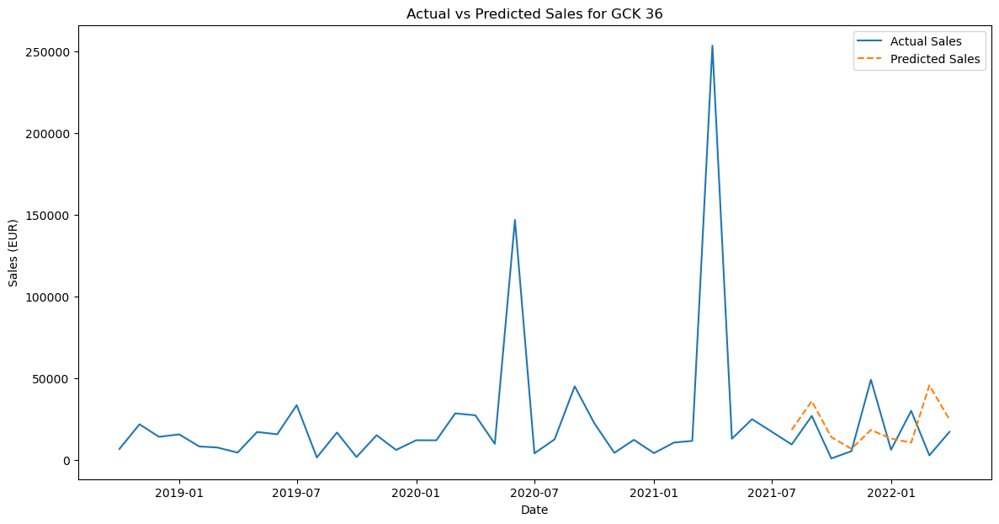

In [403]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck36.index, df_gck36['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck36.index[-len(y36_test):], y36_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 36')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [404]:
#apply the Random Forest model to the GCK 36 data
model36_RF = RandomForestRegressor(random_state = 42)

model36_RF.fit(X36_train, y36_train)

y36_pred_RF = model36_RF.predict(X36_test)

rmse36_RF = mean_squared_error(y36_test, y36_pred_RF, squared=False)

rmse36_RF

10337.899083119406

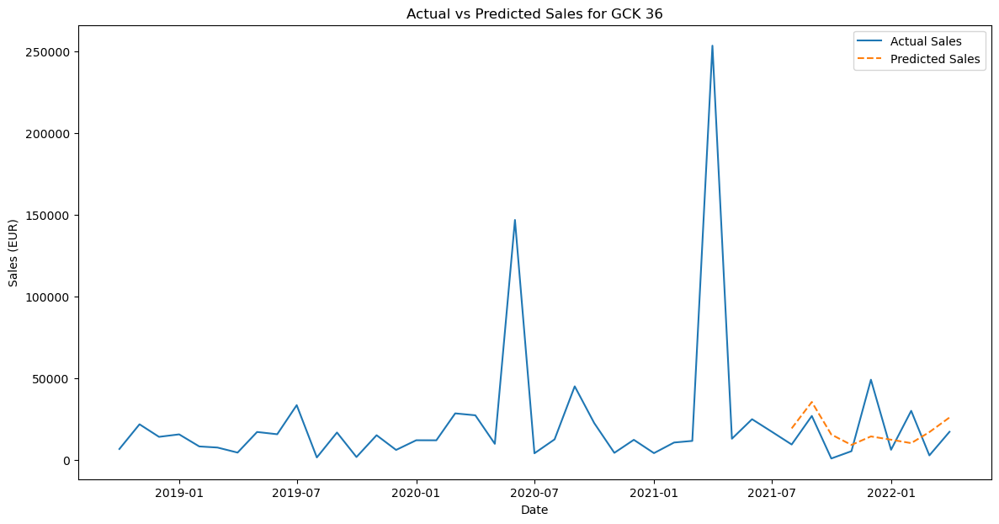

In [405]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck36.index, df_gck36['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck36.index[-len(y36_test):], y36_pred_RF, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 36')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [406]:
#apply the a linear regression model to the GCK 36 data
model36_LR = LinearRegression()

model36_LR.fit(X36_train, y36_train)

y36_pred_LR = model36_LR.predict(X36_test)

rmse36_LR = mean_squared_error(y36_test, y36_pred_LR, squared=False)

rmse36_LR

28629.92547252959

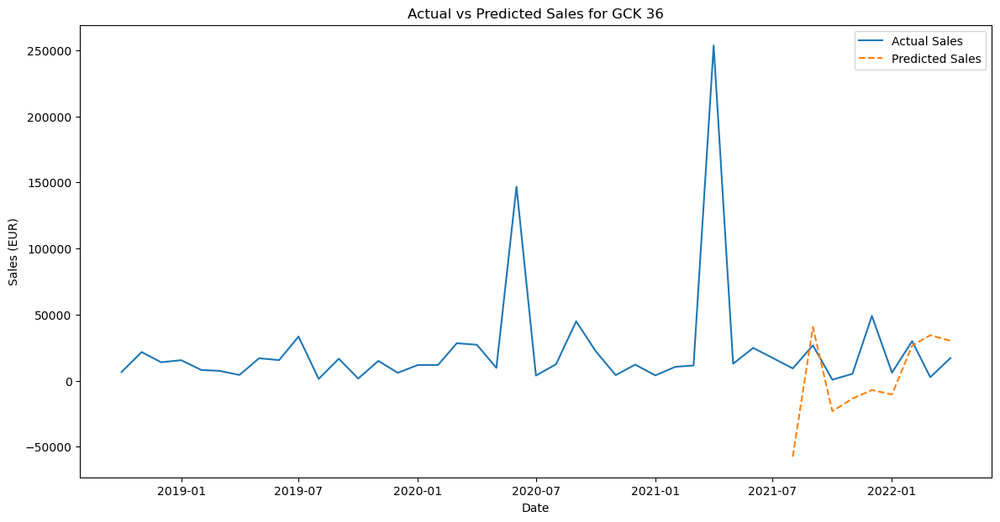

In [407]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck36.index, df_gck36['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck36.index[-len(y36_test):], y36_pred_LR, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 36')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [408]:
#make a knn model
model36_KNN = KNeighborsRegressor(n_neighbors=5, weights='distance', algorithm='kd_tree')

model36_KNN.fit(X36_train, y36_train)

y36_pred_KNN = model36_KNN.predict(X36_test)

rmse36_KNN = mean_squared_error(y36_test, y36_pred_KNN, squared=False)

rmse36_KNN

11866.052174802222

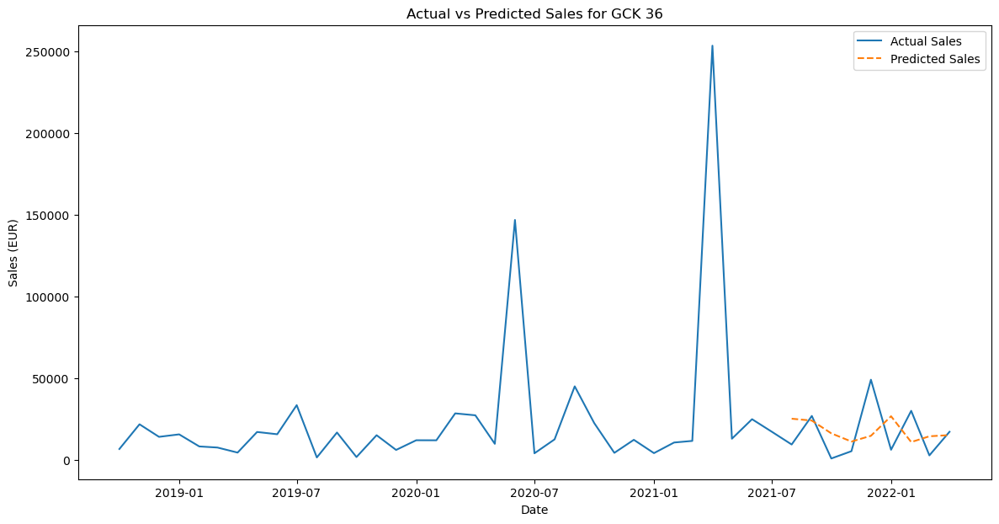

In [409]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck36.index, df_gck36['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck36.index[-len(y36_test):], y36_pred_KNN, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 36')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [410]:
#Make an ensemble model that runs these 4 models and selects the best one
from sklearn.ensemble import VotingRegressor

model36_ensemble = VotingRegressor(estimators=[
    ('xgb', model36),
    ('rf', model36_RF),
    ('lr', model36_LR),
    ('knn', model36_KNN)
])

model36_ensemble.fit(X36_train, y36_train)

y36_pred_ensemble = model36_ensemble.predict(X36_test)

rmse36_ensemble = mean_squared_error(y36_test, y36_pred_ensemble, squared=False)

rmse36_ensemble

10379.296585421893

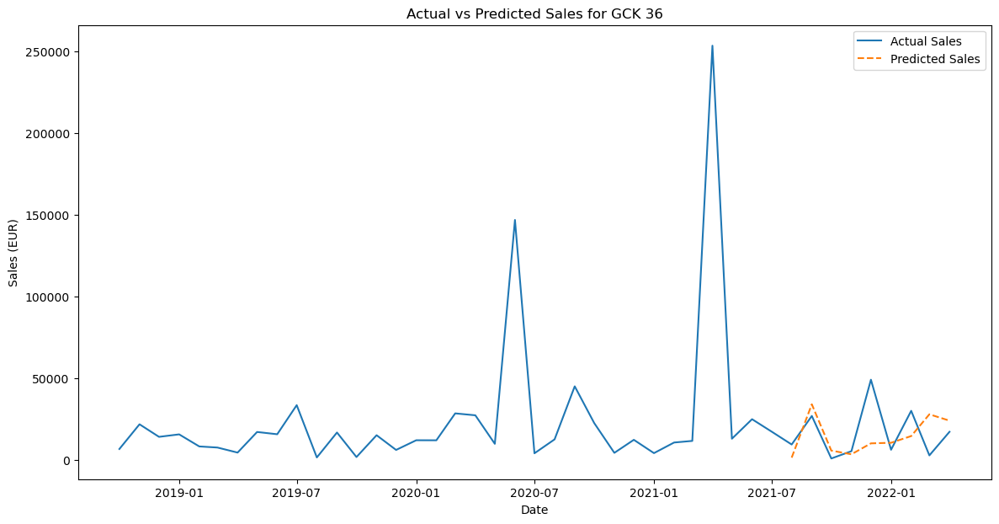

In [411]:
# Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(df_gck36.index, df_gck36['Sales_EUR'], label='Actual Sales')
plt.plot(df_gck36.index[-len(y36_test):], y36_pred_ensemble, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 36')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [412]:
#Make a table with the RMSE values for each model
models = ['XGBoost', 'Random Forest', 'Linear Regression', 'KNN', 'Ensemble']

rmse_values = [rmse36, rmse36_RF, rmse36_LR, rmse36_KNN, rmse36_ensemble]

rmse_table36 = pd.DataFrame({'Model': models, 'RMSE': rmse_values})

rmse_table36

,Model,RMSE
0,XGBoost,17062.970440
1,Random Forest,10337.899083
2,Linear Regression,28629.925473
3,KNN,11866.052175
4,Ensemble,10379.296585


In [413]:
#Create a future DataFrame for the GCK 36 data from May 2022 to Feb 2023
future_dates = pd.date_range(start='2022-05-01', end='2023-02-01', freq='MS')
future_df36 = pd.DataFrame(index=future_dates, columns=df_gck36_filtered.columns)

#Join the future DataFrame with the df_gck36_filtered DataFrame
final_df36 = pd.concat([df_gck36_filtered, future_df36])

final_df36

,MACD Histogram,Europe:Production Index Machinery & Electricals_lag_2,Producer Prices: China: Electrical equipment_lag_5,Italy:Shipments Index Machinery & Electricals_lag_3,Sales_EUR_Lag_2,US:Shipments Index Machinery & Electricals_lag_5,Sales_EUR
2018-10-01,0.000000,100.683516,96.616188,121.357126,6474.60,126.236188,6474.60
2018-11-01,150.998675,116.988080,97.008073,74.464983,6474.60,133.797520,21617.61
2018-12-01,3.301692,124.391967,97.068489,115.289962,6474.60,117.733911,13924.52
2019-01-01,-8.410717,123.070091,96.773172,122.456894,21617.61,128.232758,15444.39
2019-02-01,-221.339962,113.858005,96.577716,120.132032,13924.52,126.013347,8051.15
2019-03-01,-315.085060,106.418002,96.318329,131.936099,15444.39,127.808839,7373.42
2019-04-01,-436.672170,110.429590,95.370118,92.418842,8051.15,117.675874,4280.25
2019-05-01,-5.449058,123.693913,94.994885,103.214212,7373.42,123.280134,16905.32
2019-06-01,173.624238,111.925595,94.950134,122.454318,4280.25,111.043755,15516.22
2019-07-01,973.574298,117.901031,94.712204,106.279804,16905.32,116.736921,33334.41


In [414]:
#Separate the target variable and the features from the final_df DataFrame
y_final36 = final_df36['Sales_EUR']
X_final36 = final_df36.drop('Sales_EUR', axis=1)

In [415]:
#import sarimax
from statsmodels.tsa.statespace.sarimax import SARIMAX

# Get all the columns in the final_df DataFrame except for the target variable
columns_to_impute = X_final36.columns

# Iterate over each column to impute missing values
for column in columns_to_impute:
    # Extract the time series data for the current column
    time_series = final_df36[column]
    
    # Find the indices of missing values
    missing_indices = time_series[time_series.isnull()].index
    
    # Iterate over each missing index to impute the missing value
    for idx in missing_indices:
        # Define the SARIMA model
        model = SARIMAX(time_series.dropna(), order=(1, 1, 1), seasonal_order=(1, 1, 1, 12))
        
        # Fit the SARIMA model
        model_fit = model.fit(disp=False)
        
        # Forecast the missing value
        forecast = model_fit.forecast(steps=1)
        
        # Assign the forecasted value to the missing index
        time_series[idx] = forecast[0]

c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\statespace\sarimax.py:866: UserWarning: Too few observations to estimate starting parameters for seasonal ARMA. All parameters except for variances will be set to zeros.
  warn('Too few observations to estimate starting parameters%s.'
c:\Users\diogo\anaconda3\envs\environment_dm\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
c:\Users

In [416]:
final_df36

,MACD Histogram,Europe:Production Index Machinery & Electricals_lag_2,Producer Prices: China: Electrical equipment_lag_5,Italy:Shipments Index Machinery & Electricals_lag_3,Sales_EUR_Lag_2,US:Shipments Index Machinery & Electricals_lag_5,Sales_EUR
2018-10-01,0.000000,100.683516,96.616188,121.357126,6474.600000,126.236188,6474.60
2018-11-01,150.998675,116.988080,97.008073,74.464983,6474.600000,133.797520,21617.61
2018-12-01,3.301692,124.391967,97.068489,115.289962,6474.600000,117.733911,13924.52
2019-01-01,-8.410717,123.070091,96.773172,122.456894,21617.610000,128.232758,15444.39
2019-02-01,-221.339962,113.858005,96.577716,120.132032,13924.520000,126.013347,8051.15
2019-03-01,-315.085060,106.418002,96.318329,131.936099,15444.390000,127.808839,7373.42
2019-04-01,-436.672170,110.429590,95.370118,92.418842,8051.150000,117.675874,4280.25
2019-05-01,-5.449058,123.693913,94.994885,103.214212,7373.420000,123.280134,16905.32
2019-06-01,173.624238,111.925595,94.950134,122.454318,4280.250000,111.043755,15516.22
2019-07-01,973.574298,117.901031,94.712204,106.279804,16905.320000,116.736921,33334.41


In [417]:
#Split the target and features
y36_final = final_df36['Sales_EUR']
X36_final = final_df36.drop('Sales_EUR', axis=1)

#Train test split
X36_final_train = X36_final.loc['2018-01-01':'2022-04-01']
y36_final_train = y36_final.loc['2018-01-01':'2022-04-01']
X36_final_test = X36_final.loc['2022-05-01':'2023-02-01']

#Scale the features
X36_final36_train_scaled = scaler.fit_transform(X36_final_train)

X36_final36_test_scaled = scaler.transform(X36_final_test)

#Apply the Ensemble model to the final data

model36_ensemble.fit(X36_final36_train_scaled, y36_final_train)

y36_final_pred = model36_ensemble.predict(X36_final36_test_scaled)

y36_final_pred

array([15795.49475899, 40973.7936141 , 26715.28633812, 24924.13525915,
       20326.14428754, 23612.66482817, 15116.28806932, 19724.41241559,
       14019.12749749, 15752.91732679])

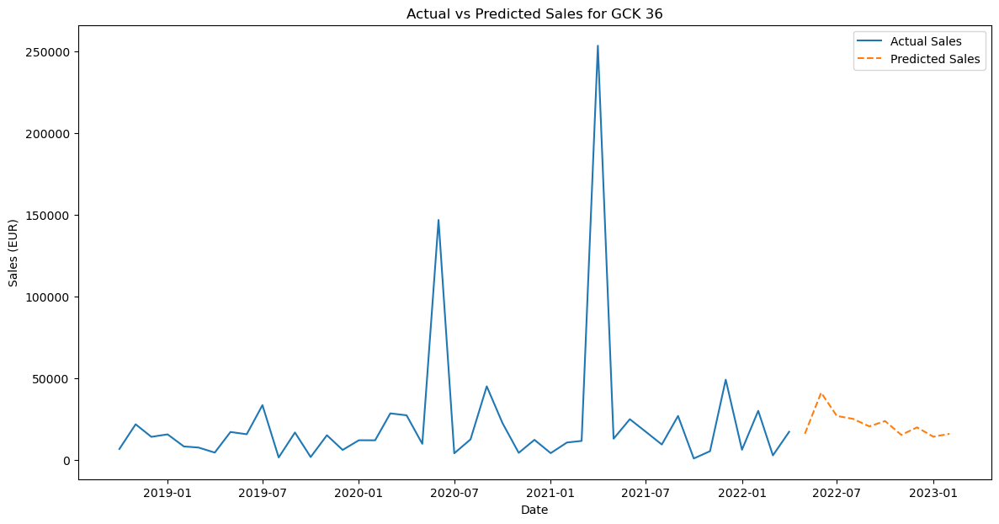

In [419]:
#Plot the sales
plt.figure(figsize=(14, 7))
plt.plot(final_df36.index, final_df36['Sales_EUR'], label='Actual Sales')
plt.plot(final_df36.index[-len(y36_final_pred):], y36_final_pred, label='Predicted Sales', linestyle='dashed')
plt.title('Actual vs Predicted Sales for GCK 36')
plt.xlabel('Date')
plt.ylabel('Sales (EUR)')
plt.legend()
plt.show()

In [420]:
original_df = df.copy()

# Final Results 

In [421]:
# List of RMSE tables
rmse_tables = [rmse_table1, rmse_table3, rmse_table4, rmse_table5, rmse_table6, rmse_table8, rmse_table9, rmse_table11, rmse_table12, rmse_table13, rmse_table14, rmse_table16, rmse_table20, rmse_table36]

# List of GCK numbers corresponding to the RMSE tables
gck_numbers = [1, 3, 4, 5, 6, 8, 9, 11, 12, 13, 14, 16, 20, 36]

# Create a new list to store modified DataFrames
modified_rmse_tables = []

# Add 'Mapped_GCK' column to each DataFrame and store the modified DataFrame in the new list
for gck, df in zip(gck_numbers, rmse_tables):
    modified_df = df.copy()  # Create a copy to avoid modifying the original DataFrame
    modified_df['Mapped_GCK'] = gck
    modified_rmse_tables.append(modified_df)

# Concatenate the modified DataFrames along the rows axis
rmse_df = pd.concat(modified_rmse_tables)

# Display the final DataFrame
rmse_df




,Model,RMSE,Mapped_GCK
0,XGBoost,3.103321e+06,1
1,Random Forest,2.855161e+06,1
2,Linear Regression,2.989967e+06,1
3,KNN,2.574300e+06,1
4,Ensemble,2.626833e+06,1
...,...,...,...
0,XGBoost,1.706297e+04,36
1,Random Forest,1.033790e+04,36
2,Linear Regression,2.862993e+04,36
3,KNN,1.186605e+04,36


In [422]:
#Upload test data
test = pd.read_csv("Case2_Test Set Template(1).csv", sep= ';')
test

,Month Year,Mapped_GCK,Sales_EUR
0,Mai 22,#3,NaN
1,Jun 22,#3,NaN
2,Jul 22,#3,NaN
3,Aug 22,#3,NaN
4,Sep 22,#3,NaN
...,...,...,...
135,Okt 22,#1,NaN
136,Nov 22,#1,NaN
137,Dez 22,#1,NaN
138,Jan 23,#1,NaN


In [423]:
#Make a df with the predicted sales and its corresponding date
final_df1_pred = pd.DataFrame(y_final_pred, index=final_df1.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df1_pred

#Add Column that is called mapped GCK and it has the value of #1
final_df1_pred['Mapped_GCK'] = '#1'

final_df1_pred

,Sales_EUR,Mapped_GCK
2022-05-01,3.655270e+07,#1
2022-06-01,3.579696e+07,#1
2022-07-01,3.712275e+07,#1
2022-08-01,3.723147e+07,#1
2022-09-01,3.903364e+07,#1
2022-10-01,4.037773e+07,#1
2022-11-01,4.018790e+07,#1
2022-12-01,3.987725e+07,#1
2023-01-01,3.685239e+07,#1
2023-02-01,3.643125e+07,#1


In [424]:
#Make a df with the predicted sales and its corresponding date
final_df3_pred = pd.DataFrame(y3_final_pred, index=final_df3.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df3_pred

#Add Column that is called mapped GCK and it has the value of #1
final_df3_pred['Mapped_GCK'] = '#3'

final_df3_pred

,Sales_EUR,Mapped_GCK
2022-05-01,9.818221e+06,#3
2022-06-01,1.301409e+07,#3
2022-07-01,1.375214e+07,#3
2022-08-01,1.255429e+07,#3
2022-09-01,1.397768e+07,#3
2022-10-01,1.117237e+07,#3
2022-11-01,1.497790e+07,#3
2022-12-01,1.114256e+07,#3
2023-01-01,7.910121e+06,#3
2023-02-01,1.094718e+07,#3


In [425]:
#Make a df with the predicted sales and its corresponding date
final_df4_pred = pd.DataFrame(y4_final_pred, index=final_df4.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df4_pred

#Add Column that is called mapped GCK and it has the value of #4
final_df4_pred['Mapped_GCK'] = '#4'

final_df4_pred

,Sales_EUR,Mapped_GCK
2022-05-01,275353.960393,#4
2022-06-01,336599.951285,#4
2022-07-01,337234.469311,#4
2022-08-01,274897.230215,#4
2022-09-01,381364.386082,#4
2022-10-01,371831.521314,#4
2022-11-01,378848.028625,#4
2022-12-01,334001.656335,#4
2023-01-01,269512.734183,#4
2023-02-01,343958.393007,#4


In [426]:
#Make a df with the predicted sales and its corresponding date
final_df5_pred = pd.DataFrame(y5_final_pred, index=final_df5.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df5_pred

#Add Column that is called mapped GCK and it has the value of #5
final_df5_pred['Mapped_GCK'] = '#5'

final_df5_pred

,Sales_EUR,Mapped_GCK
2022-05-01,9.449835e+06,#5
2022-06-01,1.220273e+07,#5
2022-07-01,8.221505e+06,#5
2022-08-01,1.099778e+07,#5
2022-09-01,1.593276e+07,#5
2022-10-01,1.003051e+07,#5
2022-11-01,9.155457e+06,#5
2022-12-01,8.825385e+06,#5
2023-01-01,5.921271e+06,#5
2023-02-01,8.813358e+06,#5


In [427]:
#Make a df with the predicted sales and its corresponding date
final_df6_pred = pd.DataFrame(y6_final_pred, index=final_df6.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df6_pred

#Add Column that is called mapped GCK and it has the value of #6
final_df6_pred['Mapped_GCK'] = '#6'

final_df6_pred

,Sales_EUR,Mapped_GCK
2022-05-01,271440.6307,#6
2022-06-01,269992.1662,#6
2022-07-01,270045.5374,#6
2022-08-01,253056.0374,#6
2022-09-01,301725.0996,#6
2022-10-01,213046.9152,#6
2022-11-01,239378.7130,#6
2022-12-01,245210.1993,#6
2023-01-01,132966.8749,#6
2023-02-01,230532.9097,#6


In [428]:
#Make a df with the predicted sales and its corresponding date
final_df8_pred = pd.DataFrame(y8_final_pred, index=final_df8.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df8_pred

#Add Column that is called mapped GCK and it has the value of #1
final_df8_pred['Mapped_GCK'] = '#8'

final_df8_pred

,Sales_EUR,Mapped_GCK
2022-05-01,1.496981e+06,#8
2022-06-01,1.436136e+06,#8
2022-07-01,1.499146e+06,#8
2022-08-01,1.719348e+06,#8
2022-09-01,2.247271e+06,#8
2022-10-01,1.384169e+06,#8
2022-11-01,1.472686e+06,#8
2022-12-01,2.162848e+06,#8
2023-01-01,1.570364e+06,#8
2023-02-01,1.863184e+06,#8


In [429]:
#Make a df with the predicted sales and its corresponding date
final_df9_pred = pd.DataFrame(y9_final_pred, index=final_df9.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df9_pred

#Add Column that is called mapped GCK and it has the value of #9
final_df9_pred['Mapped_GCK'] = '#9'

final_df9_pred

,Sales_EUR,Mapped_GCK
2022-05-01,10742.935064,#9
2022-06-01,13357.459610,#9
2022-07-01,12002.146494,#9
2022-08-01,14369.831284,#9
2022-09-01,14601.084803,#9
2022-10-01,32698.638929,#9
2022-11-01,26377.251283,#9
2022-12-01,15229.273029,#9
2023-01-01,15716.388093,#9
2023-02-01,51607.990029,#9


In [430]:
#Make a df with the predicted sales and its corresponding date
final_df11_pred = pd.DataFrame(y11_final_pred, index=final_df11.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df11_pred

#Add Column that is called mapped GCK and it has the value of #11
final_df11_pred['Mapped_GCK'] = '#11'

final_df11_pred

,Sales_EUR,Mapped_GCK
2022-05-01,9.879259e+05,#11
2022-06-01,1.199162e+06,#11
2022-07-01,1.534102e+06,#11
2022-08-01,2.675312e+06,#11
2022-09-01,3.746594e+06,#11
2022-10-01,1.229699e+06,#11
2022-11-01,8.022983e+05,#11
2022-12-01,7.722632e+05,#11
2023-01-01,1.080236e+06,#11
2023-02-01,1.166259e+06,#11


In [431]:
#Make a df with the predicted sales and its corresponding date
final_df12_pred = pd.DataFrame(y12_final_pred, index=final_df12.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df12_pred

#Add Column that is called mapped GCK and it has the value of #12
final_df12_pred['Mapped_GCK'] = '#12'

final_df12_pred

,Sales_EUR,Mapped_GCK
2022-05-01,250257.061231,#12
2022-06-01,250180.011682,#12
2022-07-01,230934.816309,#12
2022-08-01,154934.801987,#12
2022-09-01,254829.607570,#12
2022-10-01,206003.370011,#12
2022-11-01,356847.715581,#12
2022-12-01,377176.562387,#12
2023-01-01,247379.434173,#12
2023-02-01,300774.956324,#12


In [432]:
#Make a df with the predicted sales and its corresponding date
final_df13_pred = pd.DataFrame(y13_final_pred, index=final_df13.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df13_pred

#Add Column that is called mapped GCK and it has the value of #12
final_df13_pred['Mapped_GCK'] = '#13'

final_df13_pred

,Sales_EUR,Mapped_GCK
2022-05-01,8229.069336,#13
2022-06-01,10132.353516,#13
2022-07-01,23919.753906,#13
2022-08-01,24155.857422,#13
2022-09-01,15579.166016,#13
2022-10-01,19380.433594,#13
2022-11-01,19177.650391,#13
2022-12-01,20269.841797,#13
2023-01-01,20926.115234,#13
2023-02-01,21288.357422,#13


In [433]:
#Make a df with the predicted sales and its corresponding date
final_df14_pred = pd.DataFrame(y14_final_pred, index=final_df14.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df14_pred

#Add Column that is called mapped GCK and it has the value of #12
final_df14_pred['Mapped_GCK'] = '#14'

final_df14_pred

,Sales_EUR,Mapped_GCK
2022-05-01,27578.957031,#14
2022-06-01,28222.308594,#14
2022-07-01,63386.210938,#14
2022-08-01,21533.783203,#14
2022-09-01,28387.166016,#14
2022-10-01,28062.318359,#14
2022-11-01,7919.697266,#14
2022-12-01,28092.265625,#14
2023-01-01,6254.613770,#14
2023-02-01,2410.299072,#14


In [434]:
#Make a df with the predicted sales and its corresponding date
final_df16_pred = pd.DataFrame(y16_final_pred, index=final_df16.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df16_pred

#Add Column that is called mapped GCK and it has the value of #16
final_df16_pred['Mapped_GCK'] = '#16'

final_df16_pred

,Sales_EUR,Mapped_GCK
2022-05-01,127074.796875,#16
2022-06-01,136670.296875,#16
2022-07-01,128930.968750,#16
2022-08-01,126835.140625,#16
2022-09-01,132708.703125,#16
2022-10-01,136217.609375,#16
2022-11-01,132708.703125,#16
2022-12-01,330421.250000,#16
2023-01-01,299438.875000,#16
2023-02-01,224246.843750,#16


In [435]:
#Make a df with the predicted sales and its corresponding date
final_df20_pred = pd.DataFrame(y20_final_pred, index=final_df20.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df20_pred

#Add Column that is called mapped GCK and it has the value of #12
final_df20_pred['Mapped_GCK'] = '#12'

final_df20_pred

,Sales_EUR,Mapped_GCK
2022-05-01,3973.815205,#12
2022-06-01,3880.395667,#12
2022-07-01,3701.791454,#12
2022-08-01,3740.157283,#12
2022-09-01,3659.908429,#12
2022-10-01,5444.492822,#12
2022-11-01,4238.522926,#12
2022-12-01,5561.287159,#12
2023-01-01,3822.080513,#12
2023-02-01,3649.852604,#12


In [436]:
#Make a df with the predicted sales and its corresponding date
final_df36_pred = pd.DataFrame(y36_final_pred, index=final_df36.loc['2022-05-01':'2023-02-01'].index, columns=['Sales_EUR'])

final_df36_pred

#Add Column that is called mapped GCK and it has the value of #12
final_df36_pred['Mapped_GCK'] = '#36'

final_df36_pred


,Sales_EUR,Mapped_GCK
2022-05-01,15795.494759,#36
2022-06-01,40973.793614,#36
2022-07-01,26715.286338,#36
2022-08-01,24924.135259,#36
2022-09-01,20326.144288,#36
2022-10-01,23612.664828,#36
2022-11-01,15116.288069,#36
2022-12-01,19724.412416,#36
2023-01-01,14019.127497,#36
2023-02-01,15752.917327,#36


In [437]:
#Code from chatGPT
# Assuming you have all the final_dfX_pred dataframes defined in your environment
# Also assuming the old format is already read into these dataframes

# Function to convert index to "Month Year" format
def convert_index_to_month_year(index):
    return index.strftime("%b %y")

# List of dataframe names
df_names = [f"final_df{i}_pred" for i in gck_numbers]

# List comprehension to access and retrieve the dataframes
dfs = [eval(name) for name in df_names]

# Add "Month Year" column to each dataframe
for df in dfs:
    df['Month Year'] = df.index.to_series().apply(convert_index_to_month_year)

# Concatenate all dataframes together
concatenated_df = pd.concat(dfs, ignore_index=True)

concatenated_df


,Sales_EUR,Mapped_GCK,Month Year
0,3.655270e+07,#1,May 22
1,3.579696e+07,#1,Jun 22
2,3.712275e+07,#1,Jul 22
3,3.723147e+07,#1,Aug 22
4,3.903364e+07,#1,Sep 22
...,...,...,...
135,2.361266e+04,#36,Oct 22
136,1.511629e+04,#36,Nov 22
137,1.972441e+04,#36,Dec 22
138,1.401913e+04,#36,Jan 23


In [438]:
#code from chatgpt
month_abbr_mapping = {
    'Jan': ['Jan', 'Jan.'],
    'Feb': ['Feb', 'Feb.'],
    'Mar': ['Mar', 'Mär'],
    'Apr': ['Apr', 'Apr.'],
    'May': ['May', 'Mai'],
    'Jun': ['Jun', 'Jun.'],
    'Jul': ['Jul', 'Jul.'],
    'Aug': ['Aug', 'Aug.'],
    'Sep': ['Sep', 'Sep.'],
    'Oct': ['Oct', 'Okt'],
    'Nov': ['Nov', 'Nov.'],
    'Dec': ['Dec', 'Dez']
}

# Function to normalize month abbreviation
def normalize_month_abbr(month_abbr):
    for eng_month, ger_months in month_abbr_mapping.items():
        if month_abbr in ger_months:
            return eng_month
    return month_abbr  # If no mapping found, return original abbreviation

# Iterate through each row in the test dataframe
for index, row in test.iterrows():
    # Extract the corresponding Month Year and Mapped_GCK values from the test dataframe
    month_year = row['Month Year']
    mapped_gck = row['Mapped_GCK']
    
    # Split Month Year to extract month abbreviation
    month_abbr = month_year.split()[0]
    # Normalize month abbreviation
    month_abbr = normalize_month_abbr(month_abbr)
    
    # Find the corresponding row in the concatenated dataframe
    corresponding_row = concatenated_df[(concatenated_df['Month Year'].str.startswith(month_abbr)) & (concatenated_df['Mapped_GCK'] == mapped_gck)]
    
    # If a corresponding row is found, impute the Sales_EUR value from concatenated_df to test_df
    if not corresponding_row.empty:
        test.at[index, 'Sales_EUR'] = corresponding_row['Sales_EUR'].values[0]
    


In [439]:
test

,Month Year,Mapped_GCK,Sales_EUR
0,Mai 22,#3,9.818221e+06
1,Jun 22,#3,1.301409e+07
2,Jul 22,#3,1.375214e+07
3,Aug 22,#3,1.255429e+07
4,Sep 22,#3,1.397768e+07
...,...,...,...
135,Okt 22,#1,4.037773e+07
136,Nov 22,#1,4.018790e+07
137,Dez 22,#1,3.987725e+07
138,Jan 23,#1,3.685239e+07


In [440]:
csv_file_path = "test.csv"

# Export the DataFrame to a CSV file
test.to_csv(csv_file_path, index=False)